In [1]:
import torch
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import scipy.io as scio
import os
from HS_reading import *

In [2]:
"""Code for fitting temporal receptive models using Ridge (L2 regularized) regression.

Given two ndarrays, stim and resp, there are two ways to fit trfs in terms of the cross validation strategy.
Both CV strategies split the data into three mutually exclusive sets, training, validation (ridge), and test.
The regression weights are fit to the training data. The best ridge parameter is found by testing on the ridge
set. The final model performance (correlation between actual and predicted response) is calculated from the
test set.

The two strategies are:

1. Simple KFold: run_cv_temporal_ridge_regression_model
    The total samples of the data are split into a (K-1)/K train set, 1/2K ridge set, and 1/2K test set
    K times.

2. User-defined: run_cv_temporal_ridge_regression_model_fold
    Use this function when you want to specify your own train, ridge, and test sets (e.g. I use this to
    make sure training sets have TIMIT sentences with low-to-high pitch variability so that I don't end up
    with a training set that is only low pitch variability or only high pitch variability)
"""


import sklearn.model_selection as model_selection

def get_alphas(start=2, stop=7, num=10):
    """Returns alphas from num^start to num^stop in log space.
    """
    return np.logspace(start, stop, num)

def get_delays(delay_seconds=0.4, fs=100):
    """Returns 1d array of delays for a given window (in s). Default sampling frequency (fs) is 100Hz.
    """
    return np.arange(np.floor(delay_seconds * fs), dtype=int)

def get_dstim_with_different_delays(stim_list, delays_list, add_edges=True):
    dstims = []
    dstim_lens = []
    for stim, delays in zip(stim_list, delays_list):
        dstim = get_dstim(stim, delays, add_edges=add_edges)
        dstims.append(dstim)
        dstim_lens.append(dstim.shape[1])
    return np.concatenate(dstims, axis=1), dstim_lens

def get_dstim(stim, delays=get_delays(), add_edges=True):
    """Returns stimulus features with given delays.

    Args:
        stim: (n_samples, n_features)
        delays: list of delays to use, values in delays have units of indices for stim.
        add_edges: adds 3 additional delays to both sides of the delays list to account for edge effects in temporal
            receptive fields.

    Returns:
        dstim (ndarray): (n_samples, n_features x n_delays (including edge delays if added))
    """
    n_samples, n_features = stim.shape
    if add_edges:
        step = delays[1] - delays[0]
        delays_beg = [delays[0]-3*step, delays[0]-2*step, delays[0]-step]
        delays_end = [delays[-1]+step, delays[-1]+2*step, delays[-1]+3*step]
        delays = np.concatenate([delays_beg, delays, delays_end])
    dstim = []
    for i, d in enumerate(delays):
        dstim_slice = np.zeros((n_samples, n_features))
        if d<0:
            dstim_slice[:d, :] = stim[-d:, :]
        elif d>0:
            dstim_slice[d:, :] = stim[:-d, :]
        else:
            dstim_slice = stim.copy()
        dstim.append(dstim_slice)

    dstim = np.hstack(dstim)
    return dstim


def run_cv_temporal_ridge_regression_model(stim, resp, delays=get_delays(), alphas=get_alphas(),
                                           n_folds=5, add_edges=True, pred=False):
    """Given stim and resp, fit temporal receptive fields using ridge regression and KFold cross validation.

    Args:
        stim: (n_samples, n_features)
        resp: (n_samples, n_chans)
        delays: (n_delays)
        alphas: (n_alphas)
        n_folds (int): number of folds to use for KFold cross validation. The 1/K fraction of data usually used
            for the test set is split in half for the ridge parameter validation set and the test set.

    Returns:
        (tuple)
            * **test_corr_folds** (*ndarray*): Correlation between predicted and actual responses on
                test set using wts computed for alpha with best performance on validation set.
                Shape of test_corr_folds is (n_folds, n_chans)
            * **wts_folds** (*ndarray*): Computed regression weights. Shape of wts_folds is
                (n_folds, n_features, n_chans)
    """
    if delays.size > 0:
        dstim = get_dstim(stim, delays, add_edges=add_edges)
    else:
        dstim = stim.copy()

    n_features = dstim.shape[1]
    n_chans = resp.shape[1]

    test_corr_folds = np.zeros((n_folds, n_chans))
    wts_folds = np.zeros((n_folds, n_features, n_chans))
    best_alphas = np.zeros((n_folds, n_chans))

    kf = model_selection.KFold(n_splits=n_folds)

    if pred:
        pred_all = np.zeros(resp.shape)

    for i, (train, test) in enumerate(kf.split(dstim)):
        print('Running fold ' + str(i) + ".", end=" ")

        train_stim = dstim[train, :]
        train_resp = resp[train, :]

        #Use half of the test set returned by KFold for validation and half for test.
        ridge_stim = dstim[test[:round(len(test)/2)], :]
        ridge_resp = resp[test[:round(len(test)/2)], :]
        test_stim = dstim[test[round(len(test)/2):], :]
        test_resp = resp[test[round(len(test)/2):], :]

        wts_alphas, ridge_corrs = run_ridge_regression(train_stim, train_resp, ridge_stim, ridge_resp, alphas)
        best_alphas[i, :] = ridge_corrs.argmax(0) #returns array with length nchans.
        best_alphas = best_alphas.astype(np.int64)

        #For each chan, see which alpha did the best on the validation and choose the wts for that alpha
        best_wts = [wts_alphas[best_alphas[i, chan], :, chan] for chan in range(n_chans)]
        test_pred = [np.dot(test_stim, best_wts[chan]) for chan in range(n_chans)]
        test_corr = np.array([np.corrcoef(test_pred[chan], test_resp[:, chan])[0,1] for chan in range(resp.shape[1])])
        test_corr[np.isnan(test_corr)] = 0

        test_corr_folds[i, :] = test_corr
        wts_folds[i, :, :] = np.array(best_wts).T

        if pred:
            pred_all[test, :] = np.array([np.dot(dstim[test, :], best_wts[chan]) for chan in range(n_chans)]).T
    if pred:
        return test_corr_folds, wts_folds, best_alphas, pred_all
    else:
        return test_corr_folds, wts_folds, best_alphas


def run_ridge_regression(train_stim, train_resp, ridge_stim, ridge_resp, alphas):
    """Runs ridge (L2 regularized) regression for ridge parameters in alphas and returns wts fit
    on training data and correlation between actual and predicted on validation data for each alpha.

    Args:
        train_stim: (n_training_samples x n_features)
        train_resp: (n_training_samples x n_chans)
        ridge_stim: (n_validation_samples x n_features)
        ridge_resp: (n_validation_samples x n_chans)
        alphas: 1d array with ridge parameters to use

    Returns:
        (tuple):
            * **wts** (*ndarray*): Computed regression weights. Shape of wts is
                (n_alphas, n_features, n_chans)
            * **ridge_corrs** (*ndarray*): Correlation between predicted and actual responses on
                ridge validation set. Shape of ridge_corrs is (n_alphas, n_chans)

    For multiple regression with stim X and resp y and wts B:

    1. XB = y
    2. X'XB = X'y
    3. B = (X'X)^-1 X'y

    Add L2 (Ridge) regularization:

    4. B = (X'X + aI)^-1 X'y

    Because covariance X'X is a real symmetric matrix, we can decompose it to QLQ', where
    Q is an orthogonal matrix with the eigenvectors and L is a diagonal matrix with the eigenvalues
    of X'X. Furthermore, (QLQ')^-1 = QL^-1Q'

    5. B = (QLQ' + aI)^-1 X'y
    6. B = Q (L + aI)^-1 Q'X'y

    Variables in code below:

    * `covmat` is X'X
    * `l` contains the diagonal entries of L
    * `Q` is Q
    * `Usr` is Q'X'y
    * `D_inv` is (L + aI)^-1

    The wts (B) can be calculated by the matrix multiplication of [Q, D_inv, Usr]
    """
    n_features = train_stim.shape[1] #stim shape is time x features
    n_chans = train_resp.shape[1] #resp shape is time x channels
    n_alphas = alphas.shape[0]

    wts = np.zeros((n_alphas, n_features, n_chans))
    ridge_corrs = np.zeros((n_alphas, n_chans))

    dtype = np.single
    covmat = np.array(np.dot(train_stim.astype(dtype).T, train_stim.astype(dtype)))
    l, Q = np.linalg.eigh(covmat)
    Usr = np.dot(Q.T, np.dot(train_stim.T, train_resp))

    for alpha_i, alpha in enumerate(alphas):
        D_inv = np.diag(1/(l+alpha)).astype(dtype)
        wt = np.array(np.dot(np.dot(Q, D_inv), Usr).astype(dtype))
        pred = np.dot(ridge_stim, wt)
        ridge_corr = np.zeros((n_chans))
        for i in range(ridge_resp.shape[1]):
            ridge_corr[i] = np.corrcoef(ridge_resp[:, i], pred[:, i])[0, 1]
        ridge_corr[np.isnan(ridge_corr)] = 0

        ridge_corrs[alpha_i, :] = ridge_corr
        wts[alpha_i, :, :] = wt

    return wts, ridge_corrs

def get_all_pred(wts, dstim):
    all_pred = np.array([np.dot(dstim, wts[chan]) for chan in range(wts.shape[0])])
    return all_pred

def reshape_wts_to_2d(wts, delays_used=get_delays(), delay_edges_added=True):
    """Expand the 1d array of wts to the 2d shape of n_delays x n_features.

    Args:
        wts: (n_chans, n_features x n_delays)

    Returns:
        wts_2d: (n_chans, n_delays, n_features)
    """
    n_chans = wts.shape[0]
    n_delays = len(delays_used) + 6 if delay_edges_added else len(delays_used)
    n_features = np.int64(wts.shape[1]/n_delays)
    print(n_features)
    if delay_edges_added:
        wts_2d = wts.reshape(n_chans, n_delays, n_features)[:, 3:-3, :]
    else:
        wts_2d = wts.reshape(n_chans, n_delays, n_features)
    return wts_2d

__all__ = ['get_alphas', 'get_delays', 'get_dstim',
           'run_cv_temporal_ridge_regression_model', 'get_all_pred', 'run_ridge_regression']


285
489
285
489


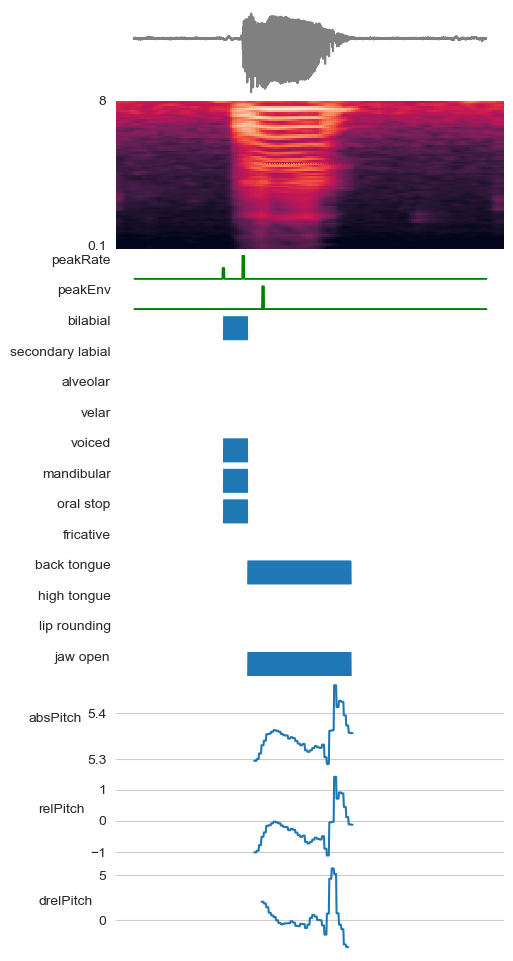

In [67]:
import seaborn as sns
onset_time = {"HS44":0,"HS45":0,"HS47":0,"HS48":0,"HS50":0,"HS54":0,"HS71":0,"HS73":0,"HS76":0}
def get_n_octaves(hz1, hz2):
    n = (np.log2(hz2) - np.log2(hz1))
    return n

def get_pitch_change(hz_values):
    hz_smooth = pd.Series(hz_values).rolling(center=True, window=5, win_type="hamming").mean()
    hz1 = np.copy(hz_smooth.values)[0:-1]
    hz2 = np.copy(hz_smooth.values)[1:]
    n = get_n_octaves(hz1, hz2)
    pitch_change = np.concatenate([[np.nan], n])
    return pitch_change

def slice2bin(x,timeline):

    timeline = np.array(timeline).squeeze(0)

    #线性差值补全timeline里为0的点
    a = np.where(x[timeline]==0)
    a = np.array(a).squeeze(0)
    total_seg = find_continus(a)
    inter_plote_num = 2
    for jj in range(len(total_seg)):
        inputx = x[total_seg[jj][0]+timeline[0]-1:total_seg[jj][-1]+timeline[0]+inter_plote_num+1]
        x[total_seg[jj][0]+timeline[0]-1:total_seg[jj][-1]+timeline[0]+inter_plote_num+1] = np.linspace(inputx[0],inputx[-1],len(inputx))

    # percent_data = x[timeline]
    # lg = np.percentile(percent_data,2.5)
    # hg = np.percentile(percent_data,97.5)
    # step = (hg-lg)/10
    # y = np.zeros_like(x)
    # y[np.where(x>hg)]=hg
    # y[np.where((x> 0) & (x<=lg))]=lg
    #
    # temp = lg
    #
    # for i in range(10):
    #     y[np.where((x>temp)& (x<temp+step))] = temp+step
    #     temp = temp +step
    #
    # y2 = np.zeros_like(y)
    # y2[timeline]
    # y2[y==0] = 0
    return x

def find_continus(aa):
    l1 = []
    total = []
    for x in sorted(set(aa)):
        l1.append(x)
        if x+1 not in aa:
            if 0 not in l1 and aa[-1] not in l1:
                total.append(l1)
            l1 = []
    return total
def plot_feature(HS=54,trial=1,task="overt_ba"):
    onset = int(np.floor(100 * onset_time["HS" + str(HS)])) + 150
    clean_path = "/Users/zhaozehao/Desktop/reading task/HSblockdata"
    Ecog_title = "ECoG_"
    wav_title = "wav_"
    env_title = "env_"
    sound_title = "soundClipMat_"
    forward = int(40)
    backward = int(120)

    # 读取数据
    mel_dir = "mel_dir//"
    mel_feat_name = mel_dir+"HS"+str(HS)+"mel.npy"
    z = np.load(mel_feat_name,allow_pickle=True).item()
    at_dir = "at_dir//"
    at_feat_name = at_dir+"HS"+str(HS)+"trace.npy"
    z2 = np.load(at_feat_name,allow_pickle=True).item()
    file_name = "HS"+str(HS)+"_Block_overt_covert.mat"
    z3 = scio.loadmat(os.path.join(clean_path,file_name))
    z3 = z3["Alldata"][0][0]

    fig = plt.figure(figsize=[5,15])
    grid  = plt.GridSpec(3+5+12+3*3+3*3,1,figure=fig)

    #原始音频绘制
    plt.subplot(grid[0:3,0])
    plt.plot(np.squeeze(z3[sound_title+task][trial,int(244.14*(onset-forward)):int(244.14*(onset+backward))]),c='grey')
    plt.grid('off')
    plt.yticks([])
    plt.xticks([])
    plt.box(on=None)

    #mel绘制
    plt.subplot(grid[3:3+5,0])
    sns.heatmap(z[sound_title+task][trial,onset-forward-1:onset+backward-1,:].T,cbar=False)
    plt.yticks([0,79],[8,0.1],rotation=0)
    plt.xticks([])

    #
    #第一步feature绘制
    feat_env_list = ["Env","peakRate","peakEnv"]

    for i in range(1,len(feat_env_list)):

        plt.subplot(grid[8+i-1,0])
        temp = np.nan_to_num(z3[env_title+task][trial,i,onset-forward:onset+backward])
        temp = np.repeat(temp,10,axis=0)

        #plt.plot(temp)
        plt.fill_between(np.arange(len(temp)),0, temp, alpha=1,color='g')

        plt.grid('off')
        plt.yticks([])
        #plt.ylim([0,1])
        plt.xticks([])
        plt.box(on=None)
        plt.ylabel(feat_env_list[i],rotation=0,ha='right', rotation_mode='anchor')

    plt.xticks([])
    #第一步feature绘制
    phonetic_feature = ['bilabial', 'secondary labial', 'alveolar', 'velar', 'voiced',
       'mandibular', 'oral stop', 'fricative', 'back tongue', 'high tongue',
       'lip rounding', 'jaw open']
    feature_one_index = z3[wav_title+task].shape[1]-12
    for i in range(len(phonetic_feature)):
        plt.subplot(grid[2+8+i,0])
        temp = np.nan_to_num(z3[wav_title+task][trial,feature_one_index+i,onset-forward:onset+backward])
        temp = np.repeat(temp,10,axis=0)

        #plt.plot(temp)
        plt.fill_between(np.arange(len(temp)),0, temp, alpha=1)

        plt.grid('off')
        plt.yticks([])
        plt.ylim([0,1])
        plt.xticks([])
        plt.box(on=None)
        plt.ylabel(phonetic_feature[i],rotation=0,ha='right', rotation_mode='anchor')


    #第二步feature绘制
    feat_wav_list = ["absPitch","relPitch","drelPitch"]
    feature_two_index = 5
    timeline = z3[wav_title+task][trial,1,onset-forward:onset+backward]>2


    # for i in range(len(feat_wav_list)):
    for i in range(3):
        plt.subplot(grid[2+8+12+3*i:2+8+12+3*i+3,0])



        temp = np.nan_to_num(z3[wav_title+task][trial,feature_two_index+i,onset-forward:onset+backward])

        #提取韵母位置
        timeline = np.where(z3[wav_title+task][trial,1,onset-forward:onset+backward]>2)
        if i <2:
            y1 = slice2bin(temp,timeline)
            if i == 0:
                pitches = y1
            temp = np.repeat(y1,5,axis=0) #减少plot对曲线的自动填充
            first_valid_index = np.where(temp!=0)[0][0]
            last_valid_index = np.where(temp!=0)[0][-1]
            print(first_valid_index)
            print(last_valid_index)
            temp[:first_valid_index]=np.NaN
            temp[last_valid_index:]=np.NaN
            plt.plot(temp)
        #temp[temp==0]=np.NaN
        else:
            pitches[pitches == 0] = np.NaN
            pitch_change = get_pitch_change(np.exp(pitches)) * 100
            temp = np.repeat(pitch_change,5,axis=0) #减少plot对曲线的自动填充
            first_valid_index = np.where(temp!=0)[0][0]
            last_valid_index = np.where(temp!=0)[0][-1]
        #
            temp[:first_valid_index]=np.NaN
            temp[last_valid_index:]=np.NaN
            plt.plot(temp)
            #plt.fill_between(np.arange(len(temp)),0, temp, alpha=1)
            #plt.plot(np.arange(first_valid_index,last_valid_index),temp[first_valid_index:last_valid_index])

        #
        #if i == 0: # 对abs单独设置
            #plt.yticks([np.log(180),np.log(320)],[180,320])
            #plt.ylim([np.log(180),np.log(320)])

        plt.grid('off')
        #plt.yticks([])
        #plt.ylim([0,1])
        plt.xlim([0,800])
        plt.xticks([])
        plt.box(on=None)
        plt.ylabel(feat_wav_list[i],rotation=0,ha='right', rotation_mode='anchor')



    return z3
HS73 = plot_feature(HS=71,trial=1,task="overt_ba")



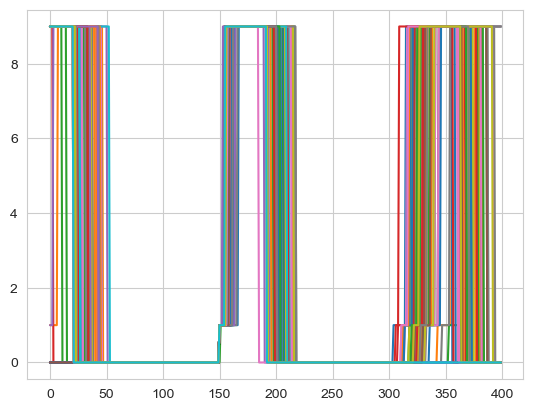

In [33]:
plt.plot(HS73['wav_overt_ba'][:,1,:].T)



In [40]:
HS = 54
if HS < 70:
    sound_list = ["overt_ba","overt_bu","overt_da","overt_du","overt_ga","overt_gu"]
else:
    sound_list = ["overt_ba","overt_da","overt_ga","overt_pa","overt_ta","overt_ka","overt_sa","overt_sha"]
for sound in sound_list:
    temp  = HS73["wav_"+sound][:,5,150-25:150+85]
    print(sound,np.shape(temp)[0],np.shape(np.where(np.sum(temp,axis=1)==0))[1],np.where(np.sum(temp,axis=1)==0)[0])


overt_ba 55 8 [28 37 38 39 49 50 53 54]
overt_bu 62 8 [24 28 39 40 43 52 60 61]
overt_da 60 7 [31 32 33 34 35 36 43]
overt_du 55 9 [15 28 29 35 36 37 38 39 54]
overt_ga 65 10 [18 26 34 37 38 46 47 48 61 62]
overt_gu 63 11 [19 21 31 32 36 37 38 55 56 61 62]


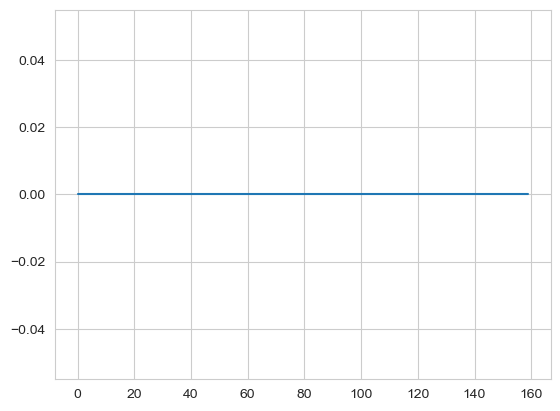

In [14]:
sound= "overt_ba"
plt.plot(HS73["wav_"+sound][1,5,150-40:150+120])

[[13, 14, 15, 16, 17, 18, 19, 20, 21]]
[5.6595519 0.        0.        0.        0.        0.        0.
 0.        0.        0.        5.6767538]
5.642589390555246 5.722086919345642 0.007949752879039628


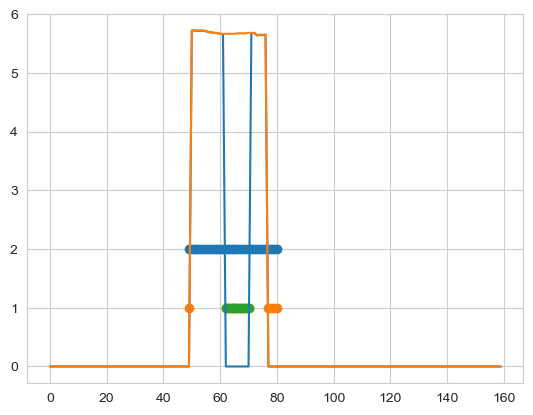

In [265]:
trial = 2
temp =  np.nan_to_num(z3[wav_title+task][trial,feature_two_index,onset-forward:onset+backward])
x = np.copy(temp)
plt.plot(x)
timeline = np.where(z3[wav_title+task][trial,1,onset-forward:onset+backward]>2)
timeline = np.array(timeline).squeeze(0)
plt.scatter(timeline,2*np.ones_like(timeline))


#线性差值补全timeline里为0的点
a = np.where(x[timeline]==0)
a = np.array(a).squeeze(0)
plt.scatter(a+timeline[0],np.ones_like(a))
total_seg = find_continus(a)
print(total_seg)
a = total_seg
a = np.array(a).squeeze(0)
plt.scatter(a+timeline[0],np.ones_like(a))

for jj in range(len(total_seg)):
    print(x[total_seg[jj][0]+timeline[0]-1:total_seg[jj][-1]+timeline[0]+2])
    inputx = x[total_seg[jj][0]+timeline[0]-1:total_seg[jj][-1]+timeline[0]+2]
    x[total_seg[jj][0]+timeline[0]-1:total_seg[jj][-1]+timeline[0]+2] = np.linspace(inputx[0],inputx[-1],len(inputx))



percent_data = x[x>0]
lg = np.percentile(percent_data,2.5)
hg = np.percentile(percent_data,97.5)
step = (hg-lg)/10
print(lg,hg,step)
y = np.zeros_like(x)
y[np.where(x>hg)]=hg
y[np.where((x> 0) & (x<=lg))]=lg
temp = lg

for i in range(10):
    y[np.where((x>temp)& (x<temp+step))] = temp+step
    temp = temp +step
plt.plot(y)





In [8]:
sound_list = ["ba", "da", "ga", "pa", "ta", "ka", "sa", "sha"]
sound_list.index("ba")

0

In [104]:

Ecog_title = "ECoG_"
wav_title = "wav_"
env_title = "env_"
sound_title = "soundClipMat_"
clean_path = "D:\\BaiduSyncdisk\\code\\HSblockdata"
import scipy.io as scio
import os

forward = int(25)
backward = int(85)
#onset_time = {"HS44":0.368,"HS45":0.151,"HS47":0.156,"HS48":0.172,"HS50":0.357,"HS54":0.322}
onset = []
HS_list = [73]
n_padding_feature = {"syllable":1,"phoneme":1,"intensity":1,"f1":1,"f2":1,"absPitch":1,"relPitch":1,"drelPitch":1,"Env":1,"peakRate":1,"peakEnv":1,"mel":80,"trace":13,'bilabial':1, 'secondary labial':1, 'alveolar':1, 'velar':1, 'voiced':1,'mandibular':1, 'oral stop':1, 'fricative':1, 'back tongue':1, 'high tongue':1,'lip rounding':1, 'jaw open':1,"phonetics":12,"consonaltal_place":5,"consonaltal_manner":3,"vowelic_place":4,"ex_consonaltal_place":7,"ex_consonaltal_manner":9,"ex_vowelic_place":8,"hg":256}
def padding_ds(ddict,padding_space=60):
    pass
    # for i in list(ddict.keys()):
    #     if i in list(n_padding_feature.keys()):
    #         if len(ddict[i])==0:
    #             ddict[i] = np.zeros([padding_space,n_padding_feature[i]])
    #         else:
    #             if n_padding_feature[i] == 1:
    #                 ddict[i] = np.expand_dims(ddict[i],-1)
    #             ddict[i] = np.concatenate((ddict[i],np.zeros([padding_space,n_padding_feature[i]])),axis=0)
    #         if n_padding_feature[i] == 1:
    #            ddict[i] = ddict[i].squeeze(-1) 
    return ddict
def get_feat(HS, task="overt"):
    """




    :param HS:
    :param task:
    :return: n_timepoints,n_feature
    """
    if HS < 70:
        sound_list = ["ba", "bu", "da", "du", "ga", "gu"]
        forward = int(25)
        backward = int(85)
    else:
        sound_list = ["ba", "da", "ga", "pa", "ta", "ka", "sa", "sha"]
        forward = int(50)
        backward = int(150)
    onset_time = {"HS44":0,"HS45":0,"HS47":0,"HS48":0,"HS50":0,"HS54":0,"HS71":0,"HS73":0,"HS76":0}

    mel_dir = "mel_dir//"
    mel_feat_name = mel_dir + "HS" + str(HS) + "mel.npy"
    z = np.load(mel_feat_name, allow_pickle=True).item()
    at_dir = "at_dir//"
    at_feat_name = at_dir + "HS" + str(HS) + "trace.npy"
    z2 = np.load(at_feat_name, allow_pickle=True).item()
    file_name = "HS" + str(HS) + "_Block_overt_covert.mat"
    z3 = scio.loadmat(os.path.join(clean_path, file_name))
    z3 = z3["Alldata"][0][0]
    feat_mat = {}
    fe_list = ["mel", "trace", "hg"]
    onset = int(np.floor(100 * onset_time["HS" + str(HS)])) + 150
    if task == "overt":
        feat_mat["mel"] = []
        feat_mat["trace"] = []
        feat_mat["hg"] = []

        feat_wav_list = ["syllable", "phoneme", "intensity", "f1", "f2"]
        feat_mat["syllable"] = []
        feat_mat["phoneme"] = []
        feat_mat["intensity"] = []
        feat_mat["f1"] = []
        feat_mat["f2"] = []

        feat_env_list = ["Env", "peakRate", "peakEnv"]
        feat_mat["Env"] = []
        feat_mat["peakRate"] = []
        feat_mat["peakEnv"] = []

        feat_pitch_list = ["absPitch", "relPitch", "drelPitch"]
        feat_mat["absPitch"] = []
        feat_mat["relPitch"] = []
        feat_mat["drelPitch"] = []

        feat_phonetic_list = ['bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular',
                              'voiced', 'oral stop', 'fricative', 'back tongue', 'high tongue',
                              'lip rounding', 'jaw open']

        for i in feat_phonetic_list:
            feat_mat[i] = []
        feat_mat['phonetics'] = []
        feat_mat['consonaltal_place'] = []
        feat_mat['consonaltal_manner'] = []
        feat_mat['vowelic_place'] = []

        for sound in sound_list:
            pitch_set = np.zeros([z3[Ecog_title + task + "_" +sound].shape[0], 3, 400])
            feature_phonetic_index = z3[wav_title + task + "_" + sound].shape[1] - 12
            print(sound)
            for i in range(z3[Ecog_title + task + "_" +sound].shape[0]):
                feat_mat = padding_ds(feat_mat)
                #减一是因为mel和trace是398个timepoint数据
                if len(feat_mat["mel"]) == 0:
                    feat_mat["mel"] = z[sound_title + task + "_" + sound][i,
                                      onset - forward - 1:onset + backward - 1, :]
                else:
                    feat_mat["mel"] = np.concatenate(
                        (feat_mat["mel"],
                         z[sound_title + task + "_" + sound][i, onset - forward - 1:onset + backward - 1, :]),
                        axis=0)

                if len(feat_mat["hg"]) == 0:
                    feat_mat["hg"] = z3[Ecog_title + task + "_" + sound][i, :,
                                     onset - forward - 1:onset + backward - 1].T
                else:
                    feat_mat["hg"] = np.concatenate(
                        (feat_mat["hg"],
                         z3[Ecog_title + task + "_" + sound][i, :, onset - forward - 1:onset + backward - 1].T),
                        axis=0)

                for wav_feature in range(len(feat_wav_list)):
                    temp = z3[wav_title + task + "_" + sound][i, wav_feature, onset - forward:onset + backward].T

                    if wav_feature < 2:  # 针对onset进行混淆,a 和辅音有不同的值，diff后a>辅音，辅音>0
                        temp = np.diff(temp)
                        temp = np.concatenate((np.array([0]),temp),axis=0)
                        temp[temp>0] = 1
                        

                    if len(feat_mat[feat_wav_list[wav_feature]]) == 0:
                        feat_mat[feat_wav_list[wav_feature]] = temp
                    else:
                        feat_mat[feat_wav_list[wav_feature]] = np.concatenate(
                            (feat_mat[feat_wav_list[wav_feature]], temp), axis=0)

                for env_feature in range(len(feat_env_list)):

                    if len(feat_mat[feat_env_list[env_feature]]) == 0:
                        feat_mat[feat_env_list[env_feature]] = z3[env_title + task + "_" + sound][i, env_feature,
                                                               onset - forward:onset + backward].T
                    else:
                        feat_mat[feat_env_list[env_feature]] = np.concatenate((feat_mat[feat_env_list[env_feature]],
                                                                               z3[env_title + task + "_" + sound][i,
                                                                               env_feature,
                                                                               onset - forward:onset + backward].T),
                                                                              axis=0)

                for pitch_feature in range(len(feat_pitch_list)):
                    feature_two_index = 5
                    temp = np.nan_to_num(z3[wav_title + task + "_" + sound][i, feature_two_index + pitch_feature,
                                         onset - forward:onset + backward])
                    
                    if (np.sum(temp) == 0):
                        if len(feat_mat[feat_pitch_list[pitch_feature]]) == 0:
                            feat_mat[feat_pitch_list[pitch_feature]] = temp.T
                        else:
                            feat_mat[feat_pitch_list[pitch_feature]] = np.concatenate(
                                (feat_mat[feat_pitch_list[pitch_feature]], temp.T), axis=0)
                        if pitch_feature == 1:
                                rel_pitch = temp
                                print(0)
                    else:
                        #提取韵母位置
                        timeline = np.where(
                            z3[wav_title + task + "_" + sound][i, 1, onset - forward:onset + backward] > 2)
                        if pitch_feature < 2:
                            temp = slice2bin(temp, timeline)
                            if pitch_feature == 0:
                                pitches = temp
                            if pitch_feature == 1:
                                rel_pitch = temp
                        else:
                            pitches[pitches == 0] = np.NaN
                            pitch_change = get_pitch_change(np.exp(pitches)) * 100
                            temp = pitch_change
                        if len(feat_mat[feat_pitch_list[pitch_feature]]) == 0:
                            feat_mat[feat_pitch_list[pitch_feature]] = temp.T
                        else:
                            feat_mat[feat_pitch_list[pitch_feature]] = np.concatenate(
                                (feat_mat[feat_pitch_list[pitch_feature]], temp.T), axis=0)
                    pitch_set[i, pitch_feature, onset - forward:onset + backward] = temp
                    
                if len(feat_mat["trace"]) == 0:
                    feat_mat["trace"] = np.concatenate((z2[sound_title + task + "_" + sound][i,
                                        onset - forward - 1:onset + backward - 1, :],np.expand_dims(rel_pitch,-1)),axis=1)
                else:
                    feat_mat["trace"] = np.concatenate((feat_mat["trace"], np.concatenate((z2[sound_title + task + "_" + sound][i,
                                        onset - forward - 1:onset + backward - 1, :],np.expand_dims(rel_pitch,-1)),axis=1)), axis=0)

                for phonetic_feature in range(len(feat_phonetic_list)):
                    temp = z3[wav_title + task + "_" + sound][i, feature_phonetic_index + phonetic_feature,
                           onset - forward:onset + backward].T

                    if len(feat_mat[feat_phonetic_list[phonetic_feature]]) == 0:
                        feat_mat[feat_phonetic_list[phonetic_feature]] = temp.T
                    else:
                        feat_mat[feat_phonetic_list[phonetic_feature]] = np.concatenate(
                            (feat_mat[feat_phonetic_list[phonetic_feature]], temp.T), axis=0)


                if len(feat_mat['phonetics']) == 0:
                    feat_mat['phonetics'] = z3[wav_title + task + "_" + sound][i, feature_phonetic_index:,
                                            onset - forward:onset + backward].T
                else:
                    feat_mat['phonetics'] = np.concatenate(
                        (feat_mat['phonetics'], z3[wav_title + task + "_" + sound][i, feature_phonetic_index:,
                                                onset - forward:onset + backward].T), axis=0)
                if len(feat_mat['consonaltal_place']) == 0:
                    feat_mat['consonaltal_place'] = z3[wav_title + task + "_" + sound][i,
                                                    feature_phonetic_index:feature_phonetic_index + 5,
                                                    onset - forward:onset + backward].T
                else:
                    feat_mat['consonaltal_place'] = np.concatenate(
                        (feat_mat['consonaltal_place'],
                         z3[wav_title + task + "_" + sound][i, feature_phonetic_index:feature_phonetic_index + 5,
                         onset - forward:onset + backward].T), axis=0)
                if len(feat_mat['consonaltal_manner']) == 0:
                    feat_mat['consonaltal_manner'] = z3[wav_title + task + "_" + sound][i,
                                                     feature_phonetic_index + 5:feature_phonetic_index + 8,
                                                     onset - forward:onset + backward].T
                else:
                    feat_mat['consonaltal_manner'] = np.concatenate(
                        (feat_mat['consonaltal_manner'], z3[wav_title + task + "_" + sound][i,
                                                         feature_phonetic_index + 5:feature_phonetic_index + 8,
                                                         onset - forward:onset + backward].T), axis=0)
                if len(feat_mat['vowelic_place']) == 0:
                    feat_mat['vowelic_place'] = z3[wav_title + task + "_" + sound][i,
                                                feature_phonetic_index + 8:feature_phonetic_index + 12,
                                                onset - forward:onset + backward].T
                else:
                    feat_mat['vowelic_place'] = np.concatenate(
                        (feat_mat['vowelic_place'], z3[wav_title + task + "_" + sound][i,
                                                    feature_phonetic_index + 8:feature_phonetic_index + 12,
                                                    onset - forward:onset + backward].T), axis=0)
                feat_mat = padding_ds(feat_mat)
            save_pitch_path = "TRF\\HS"+str(HS)+"\\HS"+str(HS)+sound+".npy"
            np.save(save_pitch_path,pitch_set)


    if task == "covert":
        transfer_point_list, offset_list = get_transfer_onset_offset(HS,z3,onset_time)
        transfer_point_list = np.around(np.nanmean(transfer_point_list, axis=0))
        offset_list = np.around(np.nanmean(offset_list, axis=0))
        print(len(transfer_point_list),len(offset_list))

        feat_mat["mel"] = []
        feat_mat["trace"] = []
        feat_mat["hg"] = []

        feat_wav_list = ["syllable", "phoneme", "intensity", "f1", "f2"]
        feat_mat["syllable"] = []
        feat_mat["phoneme"] = []
        feat_mat["intensity"] = []
        feat_mat["f1"] = []
        feat_mat["f2"] = []

        feat_env_list = ["Env", "peakRate", "peakEnv"]
        feat_mat["Env"] = []
        feat_mat["peakRate"] = []
        feat_mat["peakEnv"] = []

        feat_pitch_list = ["absPitch", "relPitch", "drelPitch"]
        feat_mat["absPitch"] = []
        feat_mat["relPitch"] = []
        feat_mat["drelPitch"] = []

        feat_phonetic_list = ['bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular',
                              'voiced', 'oral stop', 'fricative', 'back tongue', 'high tongue',
                              'lip rounding', 'jaw open']

        for i in feat_phonetic_list:
            feat_mat[i] = []
        feat_mat['phonetics'] = []
        feat_mat['consonaltal_place'] = []
        feat_mat['consonaltal_manner'] = []
        feat_mat['vowelic_place'] = []

        for sound in sound_list:
            tempz = np.mean(z[sound_title + "overt_" + sound][:, onset - forward - 1:onset + backward - 1, :], axis=0)
            
            transfer_point = int(transfer_point_list[sound_list.index(sound)])
            offset = int(offset_list[sound_list.index(sound)])

            temp_onset = np.zeros([backward + forward])
            temp_onset[0] = 1
            temp_offset = np.zeros([backward + forward])
            temp_offset[0] = 1
            temp_offset[transfer_point] = 1

            phonetic_feature_temp = np.expand_dims(get_phonetic_feature_cons(sound), -1)
            phonetic_feature_avg = np.zeros([12, backward + forward])
            phonetic_feature_avg[:8, forward:transfer_point] = np.repeat(phonetic_feature_temp[:8], transfer_point - forward, axis=1)
            phonetic_feature_avg[8:12, transfer_point:offset] = np.repeat(phonetic_feature_temp[8:], offset - transfer_point,
                                                                           axis=1)


            wav_avg = np.mean(z3[wav_title + "overt_" + sound][:, :5, onset - forward:onset + backward], axis=0)
            wav_avg[0,:] = temp_onset
            wav_avg[1,:] = temp_offset
            env_avg = np.mean(z3[env_title + "overt_" + sound][:, :, onset - forward:onset + backward], axis=0)
            pitch_set = np.load("TRF\\HS"+str(HS)+"\\HS"+str(HS)+sound+".npy")
            pitch_avg = np.mean(pitch_set,axis=0)
            
            tempz2 = np.mean(z2[sound_title + "overt_" + sound][:, onset - forward - 1:onset + backward - 1, :], axis=0)
            tempz2 = np.concatenate((tempz2,pitch_avg[[1], onset - forward:onset + backward].T),axis=1)
            


            for i in range(z3[Ecog_title + "covert_" + sound].shape[0]):
                feat_mat = padding_ds(feat_mat)
                if len(feat_mat["mel"]) == 0:
                    feat_mat["mel"] = tempz
                else:
                    feat_mat["mel"] = np.concatenate((feat_mat["mel"], tempz), axis=0)
                if len(feat_mat["trace"]) == 0:
                    feat_mat["trace"] = tempz2
                else:
                    feat_mat["trace"] = np.concatenate((feat_mat["trace"], tempz2), axis=0)
                if len(feat_mat["hg"]) == 0:
                    feat_mat["hg"] = z3[Ecog_title + "covert_" + sound][i, :, onset - forward:onset + backward].T
                else:
                    feat_mat["hg"] = np.concatenate(
                        (feat_mat["hg"], z3[Ecog_title + "covert_" + sound][i, :, onset - forward:onset + backward].T),
                        axis=0)

                for wav_feature in range(len(feat_wav_list)):

                    if len(feat_mat[feat_wav_list[wav_feature]]) == 0:
                        feat_mat[feat_wav_list[wav_feature]] = wav_avg[wav_feature].T
                    else:
                        feat_mat[feat_wav_list[wav_feature]] = np.concatenate(
                            (feat_mat[feat_wav_list[wav_feature]], wav_avg[wav_feature].T), axis=0)

                for env_feature in range(len(feat_env_list)):

                    if len(feat_mat[feat_env_list[env_feature]]) == 0:
                        feat_mat[feat_env_list[env_feature]] = env_avg[env_feature].T
                    else:
                        feat_mat[feat_env_list[env_feature]] = np.concatenate(
                            (feat_mat[feat_env_list[env_feature]], env_avg[env_feature].T), axis=0)


                for pitch_feature in range(len(feat_pitch_list)):

                    if len(feat_mat[feat_pitch_list[pitch_feature]]) == 0:
                        feat_mat[feat_pitch_list[pitch_feature]] = pitch_avg[pitch_feature, onset - forward:onset + backward].T
                    else:
                        feat_mat[feat_pitch_list[pitch_feature]] = np.concatenate(
                            (feat_mat[feat_pitch_list[pitch_feature]], pitch_avg[pitch_feature, onset - forward:onset + backward].T), axis=0)

                for phonetic_feature in range(len(feat_phonetic_list)):
                    temp = phonetic_feature_avg[phonetic_feature]

                    if len(feat_mat[feat_phonetic_list[phonetic_feature]]) == 0:
                        feat_mat[feat_phonetic_list[phonetic_feature]] = temp.T
                    else:
                        feat_mat[feat_phonetic_list[phonetic_feature]] = np.concatenate(
                            (feat_mat[feat_phonetic_list[phonetic_feature]], temp.T), axis=0)


                if len(feat_mat['phonetics']) == 0:
                    feat_mat['phonetics'] = phonetic_feature_avg.T
                else:
                    feat_mat['phonetics'] = np.concatenate(
                        (feat_mat['phonetics'], phonetic_feature_avg.T), axis=0)
                if len(feat_mat['consonaltal_place']) == 0:
                    feat_mat['consonaltal_place'] = phonetic_feature_avg[:5].T
                else:
                    feat_mat['consonaltal_place'] = np.concatenate(
                        (feat_mat['consonaltal_place'],
                         phonetic_feature_avg[:5].T), axis=0)
                if len(feat_mat['consonaltal_manner']) == 0:
                    feat_mat['consonaltal_manner'] = phonetic_feature_avg[5:8].T
                else:
                    feat_mat['consonaltal_manner'] = np.concatenate(
                        (feat_mat['consonaltal_manner'], phonetic_feature_avg[5:8].T), axis=0)
                if len(feat_mat['vowelic_place']) == 0:
                    feat_mat['vowelic_place'] = phonetic_feature_avg[8:].T
                else:
                    feat_mat['vowelic_place'] = np.concatenate(
                        (feat_mat['vowelic_place'], phonetic_feature_avg[8:].T), axis=0)
                feat_mat = padding_ds(feat_mat)
    if task == "cue":
        transfer_point_list, offset_list = get_transfer_onset_offset(z3,onset_time)
        transfer_point_list = np.around(np.nanmean(transfer_point_list, axis=0))
        offset_list = np.around(np.nanmean(offset_list, axis=0))
        print(len(transfer_point_list),len(offset_list))

        feat_mat["mel"] = []
        feat_mat["trace"] = []
        feat_mat["hg"] = []

        feat_wav_list = ["syllable", "phoneme", "intensity", "f1", "f2"]
        feat_mat["syllable"] = []
        feat_mat["phoneme"] = []
        feat_mat["intensity"] = []
        feat_mat["f1"] = []
        feat_mat["f2"] = []

        feat_env_list = ["Env", "peakRate", "peakEnv"]
        feat_mat["Env"] = []
        feat_mat["peakRate"] = []
        feat_mat["peakEnv"] = []

        feat_pitch_list = ["absPitch", "relPitch", "drelPitch"]
        feat_mat["absPitch"] = []
        feat_mat["relPitch"] = []
        feat_mat["drelPitch"] = []

        feat_phonetic_list = ['bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular',
                              'voiced', 'oral stop', 'fricative', 'back tongue', 'high tongue',
                              'lip rounding', 'jaw open']

        for i in feat_phonetic_list:
            feat_mat[i] = []
        feat_mat['phonetics'] = []
        feat_mat['consonaltal_place'] = []
        feat_mat['consonaltal_manner'] = []
        feat_mat['vowelic_place'] = []

        for sound in sound_list:
            tempz = np.mean(z[sound_title + "overt_" + sound][:, onset - forward - 1:onset + backward - 1, :], axis=0)
            
            transfer_point = int(transfer_point_list[sound_list.index(sound)])
            offset = int(offset_list[sound_list.index(sound)])

            temp_onset = np.zeros([backward + forward])
            temp_onset[0] = 1
            temp_offset = np.zeros([backward + forward])
            temp_offset[0] = 1
            temp_offset[transfer_point] = 1

            phonetic_feature_temp = np.expand_dims(get_phonetic_feature_cons(sound), -1)
            phonetic_feature_avg = np.zeros([12, backward + forward])
            phonetic_feature_avg[:8, forward:transfer_point] = np.repeat(phonetic_feature_temp[:8], transfer_point - forward, axis=1)
            phonetic_feature_avg[8:12, transfer_point:offset] = np.repeat(phonetic_feature_temp[8:], offset - transfer_point,
                                                                           axis=1)


            wav_avg = np.mean(z3[wav_title + "overt_" + sound][:, :5, onset - forward:onset + backward], axis=0)
            wav_avg[0,:] = temp_onset
            wav_avg[1,:] = temp_offset
            env_avg = np.mean(z3[env_title + "overt_" + sound][:, :, onset - forward:onset + backward], axis=0)
            pitch_set = np.load("TRF\\HS"+str(HS)+"\\HS"+str(HS)+sound+".npy")
            pitch_avg = np.mean(pitch_set,axis=0)
            
            tempz2 = np.mean(z2[sound_title + "overt_" + sound][:, onset - forward - 1:onset + backward - 1, :], axis=0)
            tempz2 = np.concatenate((tempz2,pitch_avg[[1], onset - forward:onset + backward].T),axis=1)
            


            for i in range(z3[Ecog_title + "cue_" + sound].shape[0]):
                feat_mat = padding_ds(feat_mat)
                if len(feat_mat["mel"]) == 0:
                    feat_mat["mel"] = tempz
                else:
                    feat_mat["mel"] = np.concatenate((feat_mat["mel"], tempz), axis=0)
                if len(feat_mat["trace"]) == 0:
                    feat_mat["trace"] = tempz2
                else:
                    feat_mat["trace"] = np.concatenate((feat_mat["trace"], tempz2), axis=0)
                if len(feat_mat["hg"]) == 0:
                    feat_mat["hg"] = z3[Ecog_title + "cue_" + sound][i, :, onset - forward:onset + backward].T
                else:
                    feat_mat["hg"] = np.concatenate(
                        (feat_mat["hg"], z3[Ecog_title + "cue_" + sound][i, :, onset - forward:onset + backward].T),
                        axis=0)

                for wav_feature in range(len(feat_wav_list)):

                    if len(feat_mat[feat_wav_list[wav_feature]]) == 0:
                        feat_mat[feat_wav_list[wav_feature]] = wav_avg[wav_feature].T
                    else:
                        feat_mat[feat_wav_list[wav_feature]] = np.concatenate(
                            (feat_mat[feat_wav_list[wav_feature]], wav_avg[wav_feature].T), axis=0)

                for env_feature in range(len(feat_env_list)):

                    if len(feat_mat[feat_env_list[env_feature]]) == 0:
                        feat_mat[feat_env_list[env_feature]] = env_avg[env_feature].T
                    else:
                        feat_mat[feat_env_list[env_feature]] = np.concatenate(
                            (feat_mat[feat_env_list[env_feature]], env_avg[env_feature].T), axis=0)


                for pitch_feature in range(len(feat_pitch_list)):

                    if len(feat_mat[feat_pitch_list[pitch_feature]]) == 0:
                        feat_mat[feat_pitch_list[pitch_feature]] = pitch_avg[pitch_feature, onset - forward:onset + backward].T
                    else:
                        feat_mat[feat_pitch_list[pitch_feature]] = np.concatenate(
                            (feat_mat[feat_pitch_list[pitch_feature]], pitch_avg[pitch_feature, onset - forward:onset + backward].T), axis=0)

                for phonetic_feature in range(len(feat_phonetic_list)):
                    temp = phonetic_feature_avg[phonetic_feature]

                    if len(feat_mat[feat_phonetic_list[phonetic_feature]]) == 0:
                        feat_mat[feat_phonetic_list[phonetic_feature]] = temp.T
                    else:
                        feat_mat[feat_phonetic_list[phonetic_feature]] = np.concatenate(
                            (feat_mat[feat_phonetic_list[phonetic_feature]], temp.T), axis=0)


                if len(feat_mat['phonetics']) == 0:
                    feat_mat['phonetics'] = phonetic_feature_avg.T
                else:
                    feat_mat['phonetics'] = np.concatenate(
                        (feat_mat['phonetics'], phonetic_feature_avg.T), axis=0)
                if len(feat_mat['consonaltal_place']) == 0:
                    feat_mat['consonaltal_place'] = phonetic_feature_avg[:5].T
                else:
                    feat_mat['consonaltal_place'] = np.concatenate(
                        (feat_mat['consonaltal_place'],
                         phonetic_feature_avg[:5].T), axis=0)
                if len(feat_mat['consonaltal_manner']) == 0:
                    feat_mat['consonaltal_manner'] = phonetic_feature_avg[5:8].T
                else:
                    feat_mat['consonaltal_manner'] = np.concatenate(
                        (feat_mat['consonaltal_manner'], phonetic_feature_avg[5:8].T), axis=0)
                if len(feat_mat['vowelic_place']) == 0:
                    feat_mat['vowelic_place'] = phonetic_feature_avg[8:].T
                else:
                    feat_mat['vowelic_place'] = np.concatenate(
                        (feat_mat['vowelic_place'], phonetic_feature_avg[8:].T), axis=0)
                feat_mat = padding_ds(feat_mat)
    feat_mat["lower_incisor"] = feat_mat["trace"][:, :2]
    feat_mat["upper_lip"] = feat_mat["trace"][:, 2:4]
    feat_mat["lower_lip"] = feat_mat["trace"][:, 4:6]
    feat_mat["tongue_tip"] = feat_mat["trace"][:, 6:8]
    feat_mat["tongue_body"] = feat_mat["trace"][:, 8:10]
    feat_mat["tongue_dorsum"] = feat_mat["trace"][:, 10:12]
    
    feat_mat["diff_lower_incisor"] = np.concatenate((np.zeros([1,2]),np.diff(feat_mat["lower_incisor"],axis=0)),axis=0)
    feat_mat["diff_upper_lip"] = np.concatenate((np.zeros([1,2]),np.diff(feat_mat["upper_lip"],axis=0)),axis=0)
    feat_mat["diff_lower_lip"] = np.concatenate((np.zeros([1,2]),np.diff(feat_mat["lower_lip"],axis=0)),axis=0)
    feat_mat["diff_tongue_tip"] = np.concatenate((np.zeros([1,2]),np.diff(feat_mat["tongue_tip"],axis=0)),axis=0)
    feat_mat["diff_tongue_body"] = np.concatenate((np.zeros([1,2]),np.diff(feat_mat["tongue_body"],axis=0)),axis=0)
    feat_mat["diff_tongue_dorsum"] = np.concatenate((np.zeros([1,2]),np.diff(feat_mat["tongue_dorsum"],axis=0)),axis=0)
    
    
    feat_mat["tongue"] = feat_mat["trace"][:, 6:12]
    feat_mat["lip"] = feat_mat["trace"][:, 2:6]
    feat_mat["ex_vowelic_place"] = feat_mat["phonetics"][:, 0:8]
    feat_mat["ex_consonaltal_place"] = feat_mat["phonetics"][:, 5:]
    feat_mat["ex_consonaltal_manner"] = feat_mat["phonetics"][:, [0,1,2,3,4,8,9,10,11]]

    # feat_mat["all"] = np.concatenate((feat_mat["mel"], feat_mat["trace"]), axis=1)

    for i in feat_wav_list:
        feat_mat[i] = np.expand_dims(feat_mat[i], -1)
    #
    #     feat_mat["all"] = np.concatenate((feat_mat["all"], feat_mat[i]), axis=1)
    #
    for i in feat_env_list:
        feat_mat[i] = np.expand_dims(feat_mat[i], -1)
    #     feat_mat["all"] = np.concatenate((feat_mat["all"], feat_mat[i]), axis=1)

    for i in feat_pitch_list:
        feat_mat[i] = np.expand_dims(feat_mat[i], -1)

    for i in feat_phonetic_list:
        feat_mat[i] = np.expand_dims(feat_mat[i], -1)
    feat_mat["diff_relPitch"] = np.concatenate((np.zeros([1,1]),np.diff(feat_mat["relPitch"],axis=0)),axis=0)



    return feat_mat


In [23]:

np.shape(z3["Alldata"][0][0]["wav_overt_ba"])


(53, 6, 400)

# 默读的特殊处理一：计算朗读badagapatakasasha各个音节元辅音转换位置

76
ba 0
ba 1
ba 2
ba 3
ba 4
ba 5
ba 6
ba 7
ba 8
ba 9
ba 10
ba 11
ba 12
ba 13
ba 14
ba 15
ba 16
ba 17
ba 18
ba 19
ba 20
ba 21
ba 22
ba 23
ba 24
ba 25
ba 26
ba 27
ba 28
ba 29
ba 30
ba 31
ba 32
ba 33
ba 34
ba 35
ba 36
ba 37
ba 38
ba 39
ba 40
ba 41
ba 42
ba 43
ba 44
ba 45
ba 46
ba 47
ba 48
ba 49
ba 50
ba 51
ba 52
ba 53
ba 54
ba 55
ba 56
ba 57
ba 58
ba 59
da 0
da 1
da 2
da 3
da 4
da 5
da 6
da 7
da 8
da 9
da 10
da 11
da 12
da 13
da 14
ga 0
ga 1
ga 2
ga 3
ga 4
ga 5
ga 6
ga 7
ga 8
ga 9
ga 10
ga 11
ga 12
ga 13
ga 14
ga 15
ga 16
ga 17
ga 18
ga 19
ga 20
ga 21
ga 22
ga 23
ga 24
ga 25
ga 26
ga 27
ga 28
ga 29
ga 30
ga 31
ga 32
ga 33
ga 34
ga 35
ga 36
ga 37
ga 38
ga 39
pa 0
pa 1
pa 2
pa 3
pa 4
pa 5
pa 6
pa 7
pa 8
pa 9
pa 10
pa 11
pa 12
pa 13
pa 14
pa 15
pa 16
pa 17
pa 18
pa 19
ta 0
ta 1
ta 2
ta 3
ta 4
ta 5
ta 6
ta 7
ta 8
ta 9
ta 10
ta 11
ta 12
ta 13
ta 14
ta 15
ta 16
ta 17
ta 18
ta 19
ta 20
ta 21
ta 22
ta 23
ta 24
ta 25
ta 26
ta 27
ta 28
ta 29
ta 30
ta 31
ta 32
ta 33
ta 34
ta 35
ta 36
ta 37
ta 38
ta 

(<Figure size 640x480 with 9 Axes>,
 [<AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>])

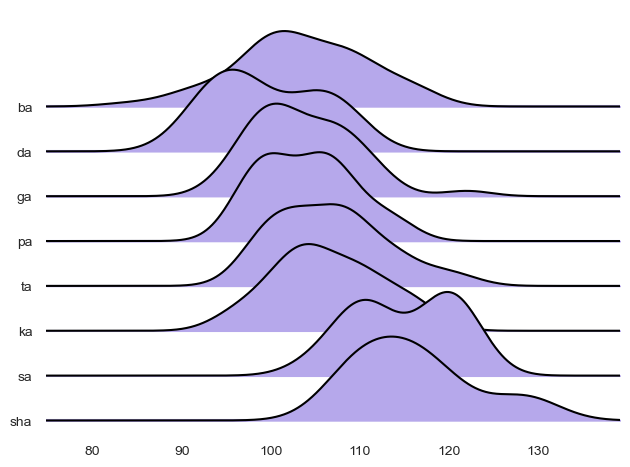

In [69]:
HS = 76
def get_transfer_onset_offset(HS,HS_block,onset_time):
    onset = int(np.floor(100 * onset_time["HS" + str(HS)])) + 150
    print(HS)
    if HS < 70:
        sound_list_phoneme = ["b","d","g","a","u"]
        sound_list = ["ba","da","ga","bu","du","gu"]
        forward = int(25)
        backward = int(85)
    else:
        sound_list_phoneme = ["b","d","g","p","t","k","s","sh","a"]
        sound_list = ["ba","da","ga","pa","ta","ka","sa","sha"]
        forward = int(50)
        backward = int(150)
    transfer_delay = {}
    transfer_offset = {}
    for sound in sound_list:
        
        transfer_delay[sound] = []
        transfer_offset[sound] = []
        for i in range(HS_block[wav_title +"overt_"+ sound][:, 1, onset - forward:onset + backward].shape[0]):
            print(sound,i)
            transfer_delay[sound].append(np.where(HS_block[wav_title +"overt_"+ sound][i, 1, onset - forward:onset + backward]>=sound_list_phoneme.index(sound[-1])+1)[0][0])
            transfer_offset[sound].append(np.where(HS_block[wav_title +"overt_"+ sound][i, 1, onset - forward:onset + backward]>=sound_list_phoneme.index(sound[-1])+1)[0][-1])
        for i in range(len(transfer_delay[sound]),84):
            transfer_delay[sound].append(np.NaN)
        for i in range(len(transfer_offset[sound]),84):
            transfer_offset[sound].append(np.NaN)

    return  pd.DataFrame(transfer_delay),pd.DataFrame(transfer_offset)
import joypy

delay,offset = get_transfer_onset_offset(HS,HS73,onset_time)
print(np.around(np.nanmean(delay,axis=0)))
print(np.around(np.nanmean(offset,axis=0)))
joypy.joyplot(offset,alpha=1,color=(182/255,168/255,235/255))

# 默读的特殊处理二：对各个phonetic 特征的重新计算，根据平均时间

In [60]:
phonetic_martix = pd.read_csv("D:\\BaiduSyncdisk\\code\\phonetic feature.csv",index_col="phonetic feature")
print(phonetic_martix)
sound_list_one = ["b","d","g","b","d","g","p","t","k","s","sh"]

print(phonetic_martix.index)
phonetic_martix = phonetic_martix.values
phonetic_martix = np.nan_to_num(np.array(phonetic_martix))
print(phonetic_martix)
x = "pa"
def get_phonetic_feature_cons(x):
    ind =  sound_list_one.index(x[:-1])
    return phonetic_martix[:,ind]
get_phonetic_feature_cons(x)

                   ba   da   ga   bu   du   gu   pa   ta   ka   sa  sha
phonetic feature                                                       
bilabial          1.0  NaN  NaN  1.0  NaN  NaN  1.0  NaN  NaN  NaN  NaN
secondary labial  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  1.0
alveolar          NaN  1.0  NaN  NaN  1.0  NaN  NaN  1.0  NaN  1.0  1.0
velar             NaN  NaN  1.0  NaN  NaN  1.0  NaN  NaN  1.0  NaN  NaN
mandibular        1.0  1.0  NaN  1.0  1.0  NaN  1.0  1.0  NaN  1.0  1.0
voiced            1.0  1.0  1.0  1.0  1.0  1.0  NaN  NaN  NaN  NaN  NaN
oral stop         1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  NaN  NaN
fricative         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  1.0  1.0
back tongue       1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0
high tongue       NaN  NaN  NaN  1.0  1.0  1.0  NaN  NaN  NaN  NaN  NaN
lip rounding      NaN  NaN  NaN  1.0  1.0  1.0  NaN  NaN  NaN  NaN  NaN
jaw open          1.0  1.0  1.0  NaN  NaN  NaN  1.0  1.0  1.0  1

array([1., 0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 1.])

(<Figure size 640x480 with 9 Axes>,
 [<AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>,
  <AxesSubplot:>])

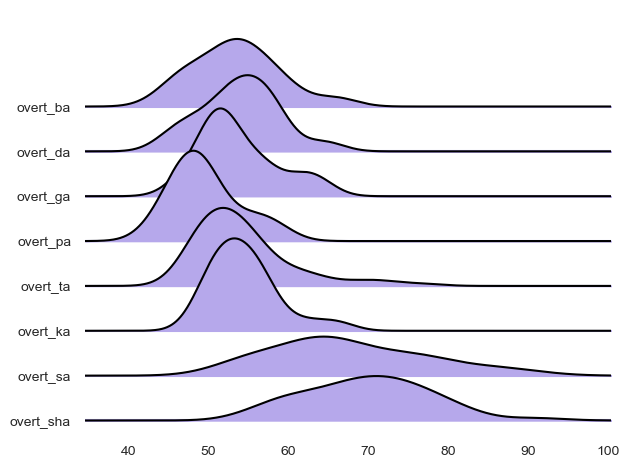

In [134]:
feat_mat = get_feat(HS,task_name)

ba
da
ga
pa
ta
ka
sa
sha


# 朗读任务
# 运动语音特征解释程度

In [147]:
HS_list = [73,76]
total_r2 = {}
total_pred_dict = {}
task_name = "overt"
nn_features = ["syllable","phoneme","intensity","f1","f2","absPitch","relPitch","drelPitch","Env","peakRate","peakEnv","mel","trace","lower_incisor","tongue","lip",'bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular','voiced', 'oral stop', 'fricative', 'back tongue', 'high tongue','lip rounding', 'jaw open',"phonetics","consonaltal_place","consonaltal_manner","vowelic_place","ex_consonaltal_place","ex_consonaltal_manner","ex_vowelic_place"]


for HS in HS_list:
    print(HS)


    save_path = "TRF\\"+"HS"+str(HS)+"\\"
    if not os.path.exists(save_path):
        os.mkdir(save_path)

    mat_file_name = save_path+"HS"+str(HS)+"_"+task_name+"_"+"_feat_mat.npy"
    if os.path.exists(mat_file_name):
        feat_mat = np.load(mat_file_name,allow_pickle=True).item()
    else:
        feat_mat = get_feat(HS,task_name)
        np.save(mat_file_name,feat_mat)

    ds = 0.6
    fs = 100

    r2_channel = {}
    wts_folds_all = {}
    best_alphas_all = {}

    for nn_feat_name in nn_features:
        print(nn_feat_name)
        dstim = feat_mat[nn_feat_name]
        resp = feat_mat["hg"]
        test_corr_folds, wts_folds, best_alphas, pred_all = run_cv_temporal_ridge_regression_model(
            dstim, resp, delays=get_delays(delay_seconds=ds, fs=fs), pred=True)
        r2 = np.sum(test_corr_folds ** 2, axis=0) / test_corr_folds.shape[0]
        r2_channel[nn_feat_name] = r2
        wts_folds_all[nn_feat_name] = wts_folds
        best_alphas_all[nn_feat_name] = best_alphas

    np.save(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_r2_channel.npy",r2_channel)
    np.save(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_wts_folds_all.npy",wts_folds_all)
    np.save(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_best_alphas_all.npy",best_alphas_all)
    print(str(HS)+" complete")

73
ba
da
ga
pa
ta
ka
sa
sha
syllable
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. phoneme
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. intensity
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. f1
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. f2
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. absPitch
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. relPitch
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. drelPitch
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. Env
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. peakRate
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. peakEnv
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. mel
Runnin

C:\Users\DELL\anaconda3\envs\ECOG\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\DELL\anaconda3\envs\ECOG\lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Running fold 2. Running fold 3. Running fold 4. secondary labial
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. alveolar
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. velar
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. mandibular
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. voiced
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. oral stop
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. fricative
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. back tongue
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. high tongue
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. lip rounding
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. jaw open
Running fold 0. Running fold 1. Runn

In [41]:
 for nn_feat_name in nn_features:
    print(feat_mat[nn_feat_name].shape)

(49280,)
(49280,)
(49280,)
(49280,)
(49280,)
(49280,)
(49280,)
(49280,)
(49280,)
(49280,)
(49280,)
(49280, 80)
(49280, 12)
(49280, 2)
(49280, 6)
(49280, 4)
(49280, 1)
(49280, 1)
(49280, 1)
(49280, 1)
(49280, 1)
(49280, 1)
(49280, 1)
(49280, 1)
(49280, 1)
(49280, 1)
(49280, 1)
(49280, 1)
(49280, 12)
(49280, 6)
(49280, 2)
(49280, 4)


In [47]:
r2_channel

AttributeError: 'dict' object has no attribute 'shape'

C:\Users\DELL\anaconda3\envs\ECOG\lib\site-packages\seaborn\categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


[Text(0, 0, 'syllable'),
 Text(1, 0, 'phoneme'),
 Text(2, 0, 'intensity'),
 Text(3, 0, 'f1'),
 Text(4, 0, 'f2'),
 Text(5, 0, 'absPitch'),
 Text(6, 0, 'relPitch'),
 Text(7, 0, 'drelPitch'),
 Text(8, 0, 'Env'),
 Text(9, 0, 'peakRate'),
 Text(10, 0, 'peakEnv'),
 Text(11, 0, 'mel'),
 Text(12, 0, 'trace'),
 Text(13, 0, 'lower_incisor'),
 Text(14, 0, 'tongue'),
 Text(15, 0, 'lip'),
 Text(16, 0, 'bilabial'),
 Text(17, 0, 'secondary labial'),
 Text(18, 0, 'alveolar'),
 Text(19, 0, 'velar'),
 Text(20, 0, 'mandibular'),
 Text(21, 0, 'voiced'),
 Text(22, 0, 'oral stop'),
 Text(23, 0, 'fricative'),
 Text(24, 0, 'back tongue'),
 Text(25, 0, 'high tongue'),
 Text(26, 0, 'lip rounding'),
 Text(27, 0, 'jaw open'),
 Text(28, 0, 'phonetics'),
 Text(29, 0, 'consonaltal_place'),
 Text(30, 0, 'consonaltal_manner'),
 Text(31, 0, 'vowelic_place'),
 Text(32, 0, 'ex_consonaltal_place'),
 Text(33, 0, 'ex_consonaltal_manner'),
 Text(34, 0, 'ex_vowelic_place')]

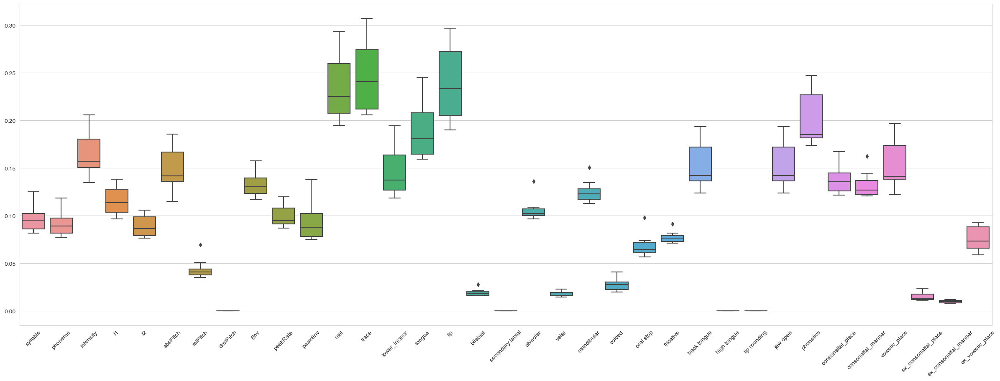

In [85]:
r2_channel_data = pd.DataFrame(r2_channel)
r2_channel_pure_data = r2_channel_data.values
nn_features1 = ["syllable","phoneme","intensity","f1","f2","absPitch","relPitch","drelPitch","Env","peakRate","peakEnv"]
nn_features2 = ["mel","trace","lower_incisor","tongue","lip"]
nn_features3 = ['bilabial', 'secondary labial', 'alveolar', 'velar', 'voiced','mandibular', 'oral stop', 'fricative', 'back tongue', 'high tongue','lip rounding', 'jaw open',"phonetics","consonaltal_place","consonaltal_manner","vowelic_place"]
nn_features_phonetics = ["ex_consonaltal_place","ex_consonaltal_manner","ex_vowelic_place"]
r2_channel_pure_data_05 = {}
for i in r2_channel.keys():
    if i in nn_features_phonetics:
        temp = r2_channel["phonetics"] - r2_channel[i]
        temp = np.sort(temp)[::-1]
        r2_channel_pure_data_05[i] = temp[:10]

    else:
        temp = r2_channel[i]
        temp = np.sort(temp)[::-1]
        r2_channel_pure_data_05[i] = temp[:10]
plt.figure(figsize=(30,10))
ax = sns.boxplot(pd.DataFrame(r2_channel_pure_data_05))
ax.set_xticklabels(r2_channel_pure_data_05.keys(),rotation=45)

In [ ]:

import matplotlib.image as mpimg
import scipy.io as sio

HS = HS_list[0]
path = "D:\\vscodeProject\\DATA\\reading task"
subject = 'HS'+str(HS)
img = mpimg.imread(path +"\\WZJ\\Brain2D\\"+ subject + "_brain2D.png")
xy = sio.loadmat(path +"\\WZJ\\Brain2D\\"+ subject + "_elec_pos2D.mat")['elecmatrix']
n_chans = 256 if xy.shape[0] >= 256 else 128

nn_features = ["mel","trace","tongue_dorsum","tongue_body","tongue_tip","lower_incisor","upper_lip","lower_lip","tongue","lip"]

overt_list = ["overt_ba","overt_da","overt_ga","overt_bu","overt_du","overt_gu"]
cor_pattern = {}
testz = get_feat_soundtype(HS,"overt")
#获取各个病人trace的相似性
for nn_feat_name in nn_features:
    cor_pattern[nn_feat_name] = np.zeros([6,6])
    for i in range(6):

        for j in range(i+1,6):
            xmin = min(testz[nn_feat_name][overt_list[i]].shape[0],testz[nn_feat_name][overt_list[j]].shape[0])
            cor_pattern[nn_feat_name][i][j] = np.corrcoef (testz[nn_feat_name][overt_list[i]][:xmin,:].reshape(-1),testz[nn_feat_name][overt_list[j]][:xmin,:].reshape(-1))[0,1]

overt_list = ["overt_ba","overt_da","overt_ga","overt_bu","overt_du","overt_gu"]
# cor_pattern = {}

#获取各个病人脑电的相似性
cor_pattern_mel_trace = {}
for nn_feat_name in ["hg"]:
    cor_pattern[nn_feat_name] = np.zeros([n_chans,6,6])
    cor_pattern_mel_trace[nn_feat_name] = np.zeros([n_chans,len(nn_features)])
    for elec in range(n_chans):
        for i in range(6):
            for j in range(i+1,6):
                xmin = min(testz[nn_feat_name][overt_list[i]].shape[0],testz[nn_feat_name][overt_list[j]].shape[0])
                cor_pattern[nn_feat_name][elec,i,j] = np.corrcoef (testz[nn_feat_name][overt_list[i]][:xmin,elec].reshape(-1),testz[nn_feat_name][overt_list[j]][:xmin,elec].reshape(-1))[0,1]
        for i in range(len(nn_features)):
            cor_pattern_mel_trace[nn_feat_name][elec,i] = np.corrcoef(np.triu(cor_pattern[nn_features[i]],1).reshape(-1),np.triu(cor_pattern[nn_feat_name][elec],1).reshape(-1))[0,1]

path = "D:\\vscodeProject\\DATA\\reading task"
subject = 'HS'+str(HS)
img = mpimg.imread(path +"\\WZJ\\Brain2D\\"+ subject + "_brain2D.png")
xy = sio.loadmat(path +"\\WZJ\\Brain2D\\"+ subject + "_elec_pos2D.mat")['elecmatrix']
n_chans = 256 if xy.shape[0] >= 256 else 128
for feature in range(len(nn_features)):
    fig, ax = plt.subplots(figsize=(5, 5))
    cof_overt_trace = cor_pattern_mel_trace["hg"][:,feature]
    ax.imshow(img)
    all_sig_elecs =np.load(str(HS)+"all_sig_elecs.npy")

    z = plt.get_cmap("coolwarm")
    plt.title("HS:"+str(HS)+" "+nn_features[feature])
    for i in range(n_chans):
        if i in all_sig_elecs:
            if not np.isnan(cof_overt_trace[i]):
                #对皮尔森相似度正的为红色，负的为蓝色,不显著的为绿色, 不显著的电极为灰色
                if cof_overt_trace[i]>0:
                    ax.plot(xy[i][0], xy[i][1], 'o',color = z(cof_overt_trace[i]),alpha = 0.7)
                    #ax.text(xy[i][0], xy[i][1], str(i))
                if cof_overt_trace[i]<0:
                    ax.plot(xy[i][0], xy[i][1], 'o',color = z(cof_overt_trace[i]),alpha = 0.7)
                    #ax.text(xy[i][0], xy[i][1], str(i))
            else:
                ax.plot(xy[i][0], xy[i][1], 'ko',alpha = 0.1)

    ax.axis("off")

# 默读任务
# 运动语音特征拟合

In [148]:
HS_list = [44,45,47,48,50,54,71]

task_name = "covert"
# nn_features = ["syllable","phoneme","intensity","f1","f2","absPitch","relPitch","drelPitch","Env","peakRate","peakEnv","all","mel","trace","tongue_dorsum","tongue_body","tongue_tip","lower_incisor","upper_lip","lower_lip","tongue","lip"]
nn_features = ["syllable","phoneme","intensity","f1","f2","absPitch","relPitch","drelPitch","Env","peakRate","peakEnv","mel","trace","lower_incisor","tongue","lip",'bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular','voiced', 'oral stop', 'fricative', 'back tongue', 'high tongue','lip rounding', 'jaw open',"phonetics","consonaltal_place","consonaltal_manner","vowelic_place","ex_consonaltal_place","ex_consonaltal_manner","ex_vowelic_place"]

for HS in HS_list:
    print(HS)

    save_path = "TRF\\"+"HS"+str(HS)+"\\"
    if not os.path.exists(save_path):
        os.mkdir(save_path)

    mat_file_name = save_path+"HS"+str(HS)+"_"+task_name+"_"+"_feat_mat.npy"
    if os.path.exists(mat_file_name):
        feat_mat = np.load(mat_file_name,allow_pickle=True).item()
    else:
        feat_mat = get_feat(HS,task_name)
        np.save(mat_file_name,feat_mat)

    ds = 0.6
    fs = 100

    r2_channel = {}
    wts_folds_all = {}
    best_alphas_all = {}

    for nn_feat_name in nn_features:
        print(nn_feat_name)
        dstim = feat_mat[nn_feat_name]
        resp = feat_mat["hg"]
        test_corr_folds, wts_folds, best_alphas, pred_all = run_cv_temporal_ridge_regression_model(
            dstim, resp, delays=get_delays(delay_seconds=ds, fs=fs), pred=True)
        r2 = np.sum(test_corr_folds ** 2, axis=0) / test_corr_folds.shape[0]
        r2_channel[nn_feat_name] = r2
        wts_folds_all[nn_feat_name] = wts_folds
        best_alphas_all[nn_feat_name] = best_alphas

    np.save(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_r2_channel.npy",r2_channel)
    np.save(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_wts_folds_all.npy",wts_folds_all)
    np.save(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_best_alphas_all.npy",best_alphas_all)
    print(str(HS)+" complete")

73
ba
da
ga
pa
ta
ka
sa
sha
8 8
syllable
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. phoneme
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. intensity
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. f1
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. f2
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. absPitch
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. relPitch
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. drelPitch
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. Env
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. peakRate
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. peakEnv
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. mel
Ru

C:\Users\DELL\anaconda3\envs\ECOG\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\DELL\anaconda3\envs\ECOG\lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Running fold 2. Running fold 3. Running fold 4. secondary labial
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. alveolar
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. velar
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. mandibular
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. voiced
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. oral stop
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. fricative
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. back tongue
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. high tongue
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. lip rounding
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. jaw open
Running fold 0. Running fold 1. Runn

C:\Users\DELL\anaconda3\envs\ECOG\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\DELL\anaconda3\envs\ECOG\lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Running fold 1. Running fold 2. Running fold 3. Running fold 4. secondary labial
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. alveolar
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. velar
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. mandibular
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. voiced
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. oral stop
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. fricative
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. back tongue
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. high tongue
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. lip rounding
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. jaw open
Running fold 0. Runn

# 进行uni R2的计算

In [105]:

feature_pool = {}
ex_features = {}
feature_pool["phonetic_model"] = ['syllable', 'bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular','voiced', 'oral stop', 'fricative', 'back tongue']
ex_features["phonetic_model"] = ['syllable', 'bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular','voiced', 'oral stop', 'fricative', 'back tongue']

feature_pool["trace_model"] = ['syllable', "relPitch","lower_incisor","tongue","lip"]
ex_features["trace_model"] = ['syllable', "relPitch","lower_incisor","tongue","lip"]

feature_pool["trace_separate_model"] = ['syllable', "relPitch","lower_incisor","upper_lip","lower_lip","tongue_tip","tongue_body","tongue_dorsum"]
ex_features["trace_separate_model"] = ['syllable', "relPitch","lower_incisor","upper_lip","lower_lip","tongue_tip","tongue_body","tongue_dorsum"]

feature_pool["trace_separate_diff_model"] = ['syllable', "diff_relPitch","diff_lower_incisor","diff_upper_lip","diff_lower_lip","diff_tongue_tip","diff_tongue_body","diff_tongue_dorsum"]
ex_features["trace_separate_diff_model"] = ['syllable', "diff_relPitch","diff_lower_incisor","diff_upper_lip","diff_lower_lip","diff_tongue_tip","diff_tongue_body","diff_tongue_dorsum"]

def run_exclude_feature(HS,model,ex_features,feature_pool,task_name = "covert"):
    """"
    ex_feature 是个列表，生成里面所有的delta
    feature_pool 是feature计算的总体
    """ 
    ex_features = ex_features[model]
    feature_pool = feature_pool[model]
    save_path = "TRF\\"+"HS"+str(HS)+"\\"
    if not os.path.exists(save_path):
        os.mkdir(save_path)

    mat_file_name = save_path+"HS"+str(HS)+"_"+task_name+"_"+"_feat_mat.npy"
    if os.path.exists(mat_file_name):
        feat_mat = np.load(mat_file_name,allow_pickle=True).item()
    else:
        feat_mat = get_feat(HS,task_name)
        np.save(mat_file_name,feat_mat)
    print(HS)
    
    nn_features_with_all = ["all"]
    for ex_feature in ex_features:
        feat_mat["ex_"+ex_feature] = []
        nn_features_with_all.append("ex_"+ex_feature)
        
        for i in range(len(feature_pool)):
            if feature_pool[i] != ex_feature:
                if len(feat_mat["ex_"+ex_feature]) == 0:
                    feat_mat["ex_"+ex_feature] = feat_mat[feature_pool[i]] 
                else:
                    feat_mat["ex_"+ex_feature] =np.concatenate((feat_mat["ex_"+ex_feature],feat_mat[feature_pool[i]] ),axis=1) 
    feat_mat["all"] = []         
    for i in range(len(feature_pool)):
            
        if len(feat_mat["all"]) == 0:
            feat_mat["all"] = feat_mat[feature_pool[i]] 
        else:
            feat_mat["all"] =np.concatenate((feat_mat["all"],feat_mat[feature_pool[i]] ),axis=1) 
    print(nn_features_with_all)    
        
   

    ds = 0.6
    fs = 100

    r2_channel = {}
    wts_folds_all = {}
    best_alphas_all = {}

    for nn_feat_name in nn_features_with_all:
        print(nn_feat_name)
        dstim = feat_mat[nn_feat_name]
        resp = feat_mat["hg"]
        test_corr_folds, wts_folds, best_alphas, pred_all = run_cv_temporal_ridge_regression_model(
            dstim, resp, delays=get_delays(delay_seconds=ds, fs=fs), pred=True)
        r2 = np.sum(test_corr_folds ** 2, axis=0) / test_corr_folds.shape[0]
        r2_channel[nn_feat_name] = r2
        wts_folds_all[nn_feat_name] = wts_folds
        best_alphas_all[nn_feat_name] = best_alphas

    np.save(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_"+model+"_r2_channel.npy",r2_channel)
    np.save(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_"+model+"_wts_folds_all.npy",wts_folds_all)
    np.save(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_"+model+"_best_alphas_all.npy",best_alphas_all)
    print(str(HS)+" complete")
HS_list = [44,45,47,48,50,54,71,73,76]
task_name_list = ["covert"]
for model in ["trace_separate_diff_model"]:
    for task_name in task_name_list:
        for HS in HS_list:
            run_exclude_feature(HS,model,ex_features,feature_pool,task_name)

44
ba 0
ba 1
ba 2
ba 3
ba 4
ba 5
ba 6
ba 7
ba 8
ba 9
ba 10
ba 11
ba 12
ba 13
ba 14
ba 15
ba 16
ba 17
ba 18
ba 19
ba 20
ba 21
ba 22
ba 23
ba 24
ba 25
ba 26
ba 27
ba 28
ba 29
ba 30
ba 31
ba 32
ba 33
ba 34
ba 35
ba 36
ba 37
ba 38
ba 39
ba 40
ba 41
ba 42
ba 43
ba 44
ba 45
ba 46
ba 47
ba 48
ba 49
ba 50
ba 51
ba 52
ba 53
ba 54
ba 55
ba 56
ba 57
ba 58
ba 59
ba 60
ba 61
ba 62
ba 63
ba 64
ba 65
ba 66
ba 67
da 0
da 1
da 2
da 3
da 4
da 5
da 6
da 7
da 8
da 9
da 10
da 11
da 12
da 13
da 14
da 15
da 16
da 17
da 18
da 19
da 20
da 21
da 22
da 23
da 24
da 25
da 26
da 27
da 28
da 29
da 30
da 31
da 32
da 33
da 34
da 35
da 36
da 37
da 38
da 39
da 40
da 41
da 42
da 43
da 44
da 45
da 46
da 47
da 48
da 49
da 50
da 51
ga 0
ga 1
ga 2
ga 3
ga 4
ga 5
ga 6
ga 7
ga 8
ga 9
ga 10
ga 11
ga 12
ga 13
ga 14
ga 15
ga 16
ga 17
ga 18
ga 19
ga 20
ga 21
ga 22
ga 23
ga 24
ga 25
ga 26
ga 27
ga 28
ga 29
ga 30
ga 31
ga 32
ga 33
ga 34
ga 35
ga 36
ga 37
ga 38
ga 39
ga 40
ga 41
ga 42
ga 43
ga 44
ga 45
ga 46
ga 47
ga 48
ga 49
ga 50
g

# 对听任务进行计算

In [155]:
HS_list = [73,76]

task_name = "cue"
# nn_features = ["syllable","phoneme","intensity","f1","f2","absPitch","relPitch","drelPitch","Env","peakRate","peakEnv","all","mel","trace","tongue_dorsum","tongue_body","tongue_tip","lower_incisor","upper_lip","lower_lip","tongue","lip"]
nn_features = ["syllable","phoneme","intensity","f1","f2","absPitch","relPitch","drelPitch","Env","peakRate","peakEnv","mel","trace","lower_incisor","tongue","lip",'bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular','voiced', 'oral stop', 'fricative', 'back tongue', 'high tongue','lip rounding', 'jaw open',"phonetics","consonaltal_place","consonaltal_manner","vowelic_place","ex_consonaltal_place","ex_consonaltal_manner","ex_vowelic_place"]

for HS in HS_list:
    print(HS)

    save_path = "TRF\\"+"HS"+str(HS)+"\\"
    if not os.path.exists(save_path):
        os.mkdir(save_path)

    mat_file_name = save_path+"HS"+str(HS)+"_"+task_name+"_"+"_feat_mat.npy"
    if os.path.exists(mat_file_name):
        feat_mat = np.load(mat_file_name,allow_pickle=True).item()
    else:
        feat_mat = get_feat(HS,task_name)
        np.save(mat_file_name,feat_mat)

    ds = 0.6
    fs = 100

    r2_channel = {}
    wts_folds_all = {}
    best_alphas_all = {}

    for nn_feat_name in nn_features:
        print(nn_feat_name)
        dstim = feat_mat[nn_feat_name]
        resp = feat_mat["hg"]
        test_corr_folds, wts_folds, best_alphas, pred_all = run_cv_temporal_ridge_regression_model(
            dstim, resp, delays=get_delays(delay_seconds=ds, fs=fs), pred=True)
        r2 = np.sum(test_corr_folds ** 2, axis=0) / test_corr_folds.shape[0]
        r2_channel[nn_feat_name] = r2
        wts_folds_all[nn_feat_name] = wts_folds
        best_alphas_all[nn_feat_name] = best_alphas

    np.save(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_r2_channel.npy",r2_channel)
    np.save(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_wts_folds_all.npy",wts_folds_all)
    np.save(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_best_alphas_all.npy",best_alphas_all)
    print(str(HS)+" complete")

73
ba
da
ga
pa
ta
ka
sa
sha
8 8
syllable
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. phoneme
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. intensity
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. f1
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. f2
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. absPitch
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. relPitch
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. drelPitch
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. Env
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. peakRate
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. peakEnv
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. mel
Ru

C:\Users\DELL\anaconda3\envs\ECOG\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\DELL\anaconda3\envs\ECOG\lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Running fold 2. Running fold 3. Running fold 4. secondary labial
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. alveolar
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. velar
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. mandibular
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. voiced
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. oral stop
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. fricative
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. back tongue
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. high tongue
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. lip rounding
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. jaw open
Running fold 0. Running fold 1. Runn

C:\Users\DELL\anaconda3\envs\ECOG\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\DELL\anaconda3\envs\ECOG\lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Running fold 2. Running fold 3. Running fold 4. secondary labial
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. alveolar
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. velar
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. mandibular
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. voiced
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. oral stop
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. fricative
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. back tongue
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. high tongue
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. lip rounding
Running fold 0. Running fold 1. Running fold 2. Running fold 3. Running fold 4. jaw open
Running fold 0. Running fold 1. Runn

In [4]:
HS = 44
save_path = "TRF\\"+"HS"+str(HS)+"\\"
task_name = "overt"
elec_path = "D:\\BaiduSyncdisk\\code\\elecs\\"+str(HS)+"sig_elecs.npy"
def plot_box(task_name):
    sig_elecs = np.load(elec_path,allow_pickle=True).item()
    r2_channel = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()

    r2_channel_data = pd.DataFrame(r2_channel)
    r2_channel_pure_data = r2_channel_data.values
    nn_features1 = ["syllable","phoneme","intensity","f1","f2","absPitch","relPitch","drelPitch","Env","peakRate","peakEnv"]
    nn_features2 = ["mel","trace","lower_incisor","tongue","lip"]
    nn_features3 = ['bilabial', 'secondary labial', 'alveolar', 'velar', 'voiced','mandibular', 'oral stop', 'fricative', 'back tongue', 'high tongue','lip rounding', 'jaw open',"phonetics","consonaltal_place","consonaltal_manner","vowelic_place"]
    nn_features_phonetics = ["ex_consonaltal_place","ex_consonaltal_manner","ex_vowelic_place"]
    nn_features = ["syllable","phoneme","intensity","f1","f2","absPitch","relPitch","drelPitch","Env","peakRate","peakEnv","mel","trace","lower_incisor","tongue","lip",'bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular','voiced', 'oral stop', 'fricative', 'back tongue', 'high tongue','lip rounding', 'jaw open',"phonetics","consonaltal_place","consonaltal_manner","vowelic_place","ex_consonaltal_place","ex_consonaltal_manner","ex_vowelic_place"]
    r2_channel_pure_data_05 = {}
    for i in nn_features:
        if i in nn_features_phonetics:
            temp = r2_channel["phonetics"] - r2_channel[i]
            temp[127] = 0
            temp = np.sort(temp)[::-1]
            r2_channel_pure_data_05[i] = temp[:10]

        else:
            temp = r2_channel[i]
            temp[127] = 0
            temp = np.sort(temp)[::-1]
            r2_channel_pure_data_05[i] = temp[:10]
    plt.figure(figsize=(30,10))
    ax = sns.boxplot(pd.DataFrame(r2_channel_pure_data_05))
    ax.set_xticklabels(r2_channel_pure_data_05.keys(),rotation=45)

plot_box("overt")
plot_box("covert")

FileNotFoundError: [Errno 2] No such file or directory: 'D:\\BaiduSyncdisk\\code\\elecs\\44sig_elecs.npy'

# 在脑表面上标注，marksize为每个电极R2

In [198]:
colorset_ar = np.array([[234,150,163],[233,151,146],[230,149,118],[219,147,78],[202,152,76],[189,155,74],[176,157,72],[255,255,255],[152,162,70],[138,166,70],
            [118,171,71],[77,176,71],[73,175,114],[73,174,134],[74,173,146],[74,172,156],[75,171,164],[255,255,255],[78,171,182],[80,172,192],
            [83,172,205],[88,173,223],[136,174,230],[163,173,234],[182,168,235],[255,255,255],[255,255,255],[228,138,230],[231,140,215],[232,143,202],
            [233,146,190],[233,148,178],[60,148,178],[60,80,178],[60,178,80]],dtype=np.float64)
nn_features = ["syllable","phoneme","intensity","f1","f2","absPitch","relPitch","drelPitch","Env","peakRate","peakEnv","mel","trace","lower_incisor","tongue","lip",'bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular','voiced', 'oral stop', 'fricative', 'back tongue', 'high tongue','lip rounding', 'jaw open',"phonetics","consonaltal_place","consonaltal_manner","vowelic_place","ex_consonaltal_place","ex_consonaltal_manner","ex_vowelic_place"]
colorset = {}
for i in range(colorset_ar.shape[0]):
    colorset_ar[i] = colorset_ar[i]/255
    colorset[nn_features[i]] = tuple(colorset_ar[i])


In [73]:
for HS in [44,45,47,48,50,54,71]:
    path = "D:\\BaiduSyncdisk\\code\\elecs\\"+str(HS)+"response_elecs_dict.mat"
    elec_path = "D:\\BaiduSyncdisk\\code\\elecs\\"+str(HS)+"sig_elecs.npy"
    response_elecs_dict = scio.loadmat(path)
    x
    task_name_list = ["overt","covert"]
    sig_elecs = {}
    for task_name in task_name_list:
        sig_elecs[task_name] = []
    if HS < 70:
        sound_list = ["ba","da","ga","bu","du","gu"]

    else:
        sound_list = ["ba","da","ga","pa","ta","ka","sa","sha"]

    print(sound_list)
    for sound in sound_list:
        for task_name in task_name_list:
            sig_elecs[task_name].extend(response_elecs_dict["ECoG_"+task_name+"_"+sound].reshape(-1))
    print(sig_elecs)
    np.save(elec_path,sig_elecs)

['ba', 'da', 'ga', 'bu', 'du', 'gu']
{'overt': [1, 2, 3, 4, 5, 6, 7, 8, 9, 12, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 45, 48, 49, 51, 52, 53, 54, 55, 56, 57, 61, 68, 69, 70, 71, 72, 75, 77, 78, 79, 82, 83, 84, 85, 86, 87, 88, 89, 90, 94, 95, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 113, 114, 116, 117, 118, 119, 120, 121, 122, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 63, 67, 69, 71, 72, 73, 75, 76, 77, 78, 79, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 110, 113, 114, 116, 117, 118, 119, 120, 121, 122, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 70, 71, 72, 75, 78, 79, 82, 83,

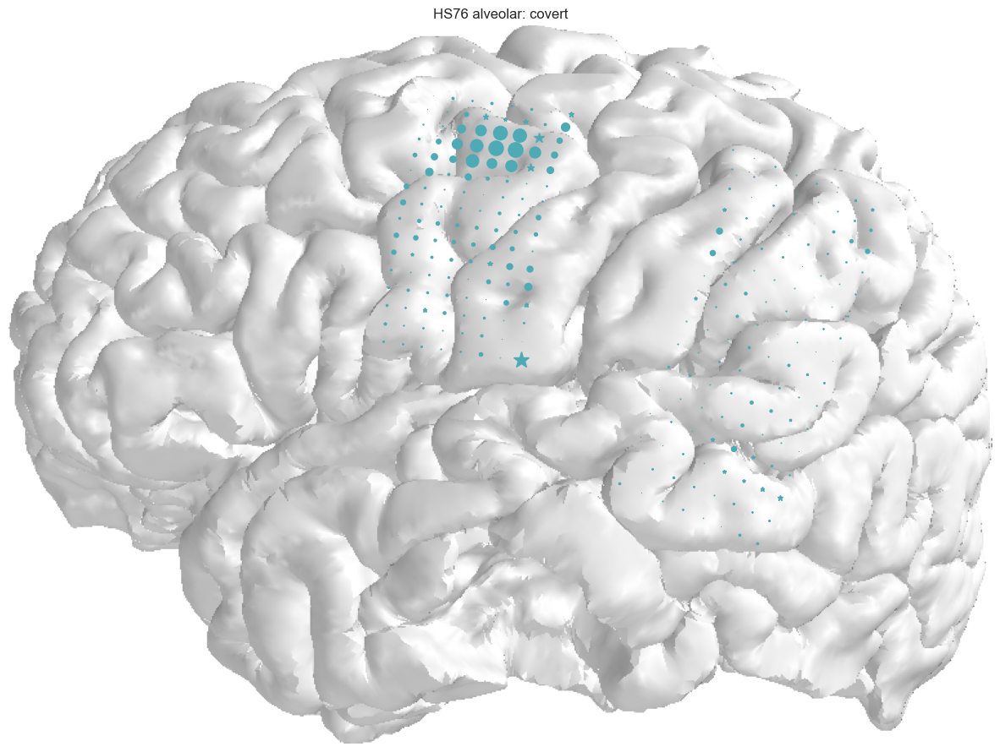

In [143]:
import matplotlib.image as mpimg
import scipy.io as scio


def plot_brain(HS,task_name,nn_feature):
    path = "D:\\BaiduSyncdisk\\code\\elecs\\"
    elec_path = "D:\\BaiduSyncdisk\\code\\elecs\\"+str(HS)+"sig_elecs.npy"

    subject = 'HS'+str(HS)
    img = mpimg.imread(path + subject + "_brain2D.png")
    xy = scio.loadmat(path + subject + "_elec_pos2D.mat")['elecmatrix']
    sig_elecs = np.load(elec_path,allow_pickle=True).item()
    plt.figure(figsize=(15,15))

    plt.imshow(img)
    n_chans = 256 if xy.shape[0] >= 256 else 128


    # nn_features = ["syllable","phoneme","intensity","f1","f2","absPitch","relPitch","drelPitch","Env","peakRate","peakEnv","all","mel","trace","tongue_dorsum","tongue_body","tongue_tip","lower_incisor","upper_lip","lower_lip","tongue","lip"]
    nn_features = ["syllable","phoneme","intensity","f1","f2","absPitch","relPitch","drelPitch","Env","peakRate","peakEnv","mel","trace","lower_incisor","tongue","lip",'bilabial', 'secondary labial', 'alveolar', 'velar', 'voiced','mandibular', 'oral stop', 'fricative', 'back tongue', 'high tongue','lip rounding', 'jaw open',"phonetics","consonaltal_place","consonaltal_manner","vowelic_place","ex_consonaltal_place","ex_consonaltal_manner","ex_vowelic_place"]

    nn_features_phonetics  = ["ex_consonaltal_place","ex_consonaltal_manner","ex_vowelic_place"]
    save_path = "TRF\\"+"HS"+str(HS)+"\\"
    if task_name == "overt&covert":
        noise_ceiling = 0.05
        r2_channel = np.load(save_path+"HS"+str(HS)+"_"+"covert"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
        for elec in range(n_chans):
            plt.plot(xy[elec,0],xy[elec,1],marker = 'o',markersize =r2_channel[nn_feature][elec]/noise_ceiling*10,color='b',alpha=0.5)
        noise_ceiling = 0.15
        r2_channel = np.load(save_path+"HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
        for elec in range(n_chans):
            plt.plot(xy[elec,0],xy[elec,1],marker = 'o',markersize =r2_channel[nn_feature][elec]/noise_ceiling*10,color='r',alpha=0.5)
        plt.title("HS"+str(HS)+" "+nn_feature+": "+task_name)
    else:
        r2_channel = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
        noise_ceiling = 0.05 if task_name=="covert" else 0.15
        if nn_feature in nn_features_phonetics:
            r2_channel[nn_feature] = r2_channel["phonetics"] - r2_channel[nn_feature]
            noise_ceiling = 0.02

        for elec in range(n_chans):
            if elec in sig_elecs[task_name]:
                plt.plot(xy[elec,0],xy[elec,1],marker = 'o',markersize =r2_channel[nn_feature][elec]/noise_ceiling*20,color=colorset[nn_feature])
            else:
               plt.plot(xy[elec,0],xy[elec,1],marker = '*',markersize =r2_channel[nn_feature][elec]/noise_ceiling*20,color=colorset[nn_feature])
        plt.title("HS"+str(HS)+" "+nn_feature+": "+task_name)
    plt.box(on=None)
    plt.yticks([])
    plt.xticks([])
HS = 76
task_name = "covert"
nn_features = ["syllable","phoneme","intensity","f1","f2","absPitch","relPitch","drelPitch","Env","peakRate","peakEnv","mel","trace","lower_incisor","tongue","lip",'bilabial', 'secondary labial', 'alveolar', 'velar','mandibular', 'voiced', 'oral stop', 'fricative', 'back tongue', 'high tongue','lip rounding', 'jaw open',"phonetics","consonaltal_place","consonaltal_manner","vowelic_place","ex_consonaltal_place","ex_consonaltal_manner","ex_vowelic_place"]
#task_name="overt&covert"
# for nn_feature in nn_features:
nn_feature = "alveolar"
plot_brain(HS,task_name,nn_feature)

# 绘制uniR2的散点分布图和脑表面

In [49]:
from scipy.stats import pearsonr
def load_F(HS):
    task_name_list = ['overt', 'covert'
                      ]
    F_values_save_path = "F_values\\" + "HS" + str(HS) + "\\"
    save_sig_name = "HS"+str(HS)+"_F_sig.npy"
    save_name = "HS"+str(HS)+"_F_values.npy"
    F_values = np.load(F_values_save_path+save_name,allow_pickle=True).item()
    F_sig_elec_path = F_values_save_path+save_sig_name
    F_sig_elecs = np.load(F_sig_elec_path,allow_pickle=True).item()
    for task_name in task_name_list:
        F_values[task_name] = F_values[task_name][:,0,:]
    return F_sig_elecs,F_values

KeyError: 'HS71'

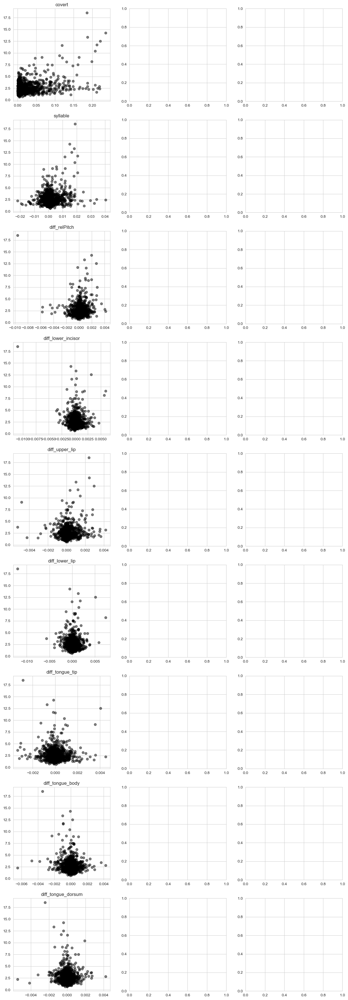

In [107]:
path = "D:\\BaiduSyncdisk\\code\\elecs\\"
elec_path = "D:\\BaiduSyncdisk\\code\\elecs\\"+str(HS)+"sig_elecs.npy"

ds = 0.6
fs = 100
from scipy.stats import pearsonr
def scatter_uni_F(HS_list,model,ex_features):
    ex_features = ex_features[model]
    task_name_list = ['covert']
    fig, axs =  plt.subplots(len(ex_features)+1,3,figsize=(15,(len(ex_features)+1)*5))
    color_HS = {"HS73":'r',"HS76":'b',"HS44":"k","HS45":"k","HS47":"k","HS48":"k","HS50":"k","HS54":"k"}
    for HS in HS_list:
        save_path = "TRF\\"+"HS"+str(HS)+"\\"
        n_chans = 256 if HS >= 45 else 128
        subject = 'HS'+str(HS)
        for task_name in  range(len(task_name_list)):
            F_sig_elecs,F_values = load_F(HS)
            
            delta_r2_channel = {}
            r2_channel = np.load(save_path+"HS"+str(HS)+"_"+task_name_list[task_name]+"_"+str(int(ds*fs))+"_"+model+"_r2_channel.npy",allow_pickle=True).item()
            max_f = np.max(F_values[task_name_list[task_name]],axis=1)
            
            for i in range(len(ex_features)):
                delta_r2_channel[ex_features[i]] = r2_channel["all"] - r2_channel["ex_"+ex_features[i]]
                
            cor_f_r = []
            for i in range(n_chans):
                axs[0,task_name].scatter(r2_channel["all"][i],max_f[i],alpha= 0.5,color=color_HS[subject])
                cor_f_r.append([r2_channel["all"][i],max_f[i]])
                    
                
            #covert_r = pearsonr(np.array(cor_f_r)[:,0],np.array(cor_f_r)[:,1])
            #axs[feature].text(0.5, 0.9, "overt r: "+str(np.around(overt_r[0],2))+" p:"+str(np.around(overt_r[1],2)), fontsize=12,transform=axs[feature].transAxes)
            #axs[0,task_name].text(0.6, 0.8, task_name_list[task_name]+ " r: "+str(np.around(covert_r[0],2))+" p:"+str(np.around(covert_r[1],2)), fontsize=12,transform=axs[0,task_name].transAxes)
            axs[0,task_name].set_title(task_name_list[task_name])
            for feature in range(len(ex_features)):
                cor_f_r = []
                for i in range(n_chans):
                    axs[feature+1,task_name].scatter(delta_r2_channel[ex_features[feature]][i],max_f[i],alpha= 0.5,color=color_HS[subject])
                    cor_f_r.append([delta_r2_channel[ex_features[feature]][i],max_f[i]])
                    
                
                #covert_r = pearsonr(np.array(cor_f_r)[:,0],np.array(cor_f_r)[:,1])
                #axs[feature].text(0.5, 0.9, "overt r: "+str(np.around(overt_r[0],2))+" p:"+str(np.around(overt_r[1],2)), fontsize=12,transform=axs[feature].transAxes)
                #axs[feature+1,task_name].text(0.6, 0.8,task_name_list[task_name]+ " r: "+str(np.around(covert_r[0],2))+" p:"+str(np.around(covert_r[1],2)), fontsize=12,transform=axs[feature+1,task_name].transAxes)
                axs[feature+1,task_name].set_title(ex_features[feature])
                
feature_pool = {}
ex_features = {}
feature_pool["phonetic_model"] = ['syllable', 'bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular','voiced', 'oral stop', 'fricative', 'back tongue']
ex_features["phonetic_model"] = ['syllable', 'bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular','voiced', 'oral stop', 'fricative', 'back tongue']

feature_pool["trace_model"] = ['syllable', "relPitch","lower_incisor","tongue","lip"]
ex_features["trace_model"] = ['syllable', "relPitch","lower_incisor","tongue","lip"]
feature_pool["trace_separate_model"] = ['syllable', "relPitch","lower_incisor","upper_lip","lower_lip","tongue_tip","tongue_body","tongue_dorsum"]
ex_features["trace_separate_model"] = ['syllable', "relPitch","lower_incisor","upper_lip","lower_lip","tongue_tip","tongue_body","tongue_dorsum"]
feature_pool["trace_separate_diff_model"] = ['syllable', "diff_relPitch","diff_lower_incisor","diff_upper_lip","diff_lower_lip","diff_tongue_tip","diff_tongue_body","diff_tongue_dorsum"]
ex_features["trace_separate_diff_model"] = ['syllable', "diff_relPitch","diff_lower_incisor","diff_upper_lip","diff_lower_lip","diff_tongue_tip","diff_tongue_body","diff_tongue_dorsum"]
HS = [44,45,47,48,50,54,71,73,76]
model = "trace_separate_diff_model"
scatter_uni_F(HS,model,ex_features)

 

In [ ]:
import matplotlib.image as mpimg
import scipy.io as scio
HS = 45
path = "D:\\BaiduSyncdisk\\code\\elecs\\"
elec_path = "D:\\BaiduSyncdisk\\code\\elecs\\HS"+str(HS)+"_elecs_all_warped.mat"

subject = 'HS'+str(HS)
xy = scio.loadmat(path + subject + "_elecs_all_warped.mat")['elecmatrix']
img = mpimg.imread(path +"MNI.png")
sig_elecs = np.load(elec_path,allow_pickle=True).item()
plt.figure(figsize=(15,15))

plt.imshow(img)
n_chans = 256 if xy.shape[0] >= 256 else 128
F_sig_elecs,F_values = load_F(HS)
for elec in range(n_chans):
    plt.plot(xy[elec,0],xy[elec,1],marker = 'o',markersize =(r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling*20,color=color_005[temp])


HS44
HS45
HS47
HS48
HS50
HS54
HS71
HS76
HS44
HS45
HS47
HS48
HS50
HS54
HS71
HS76
HS44
HS45
HS47
HS48
HS50
HS54
HS71
HS76
HS44
HS45
HS47
HS48
HS50
HS54
HS71
HS76
HS44
HS45
HS47
HS48
HS50
HS54
HS71
HS76
HS44
HS45
HS47
HS48
HS50
HS54
HS71
HS76
HS44
HS45
HS47
HS48
HS50
HS54
HS71
HS76
HS44
HS45
HS47
HS48
HS50
HS54
HS71
HS76


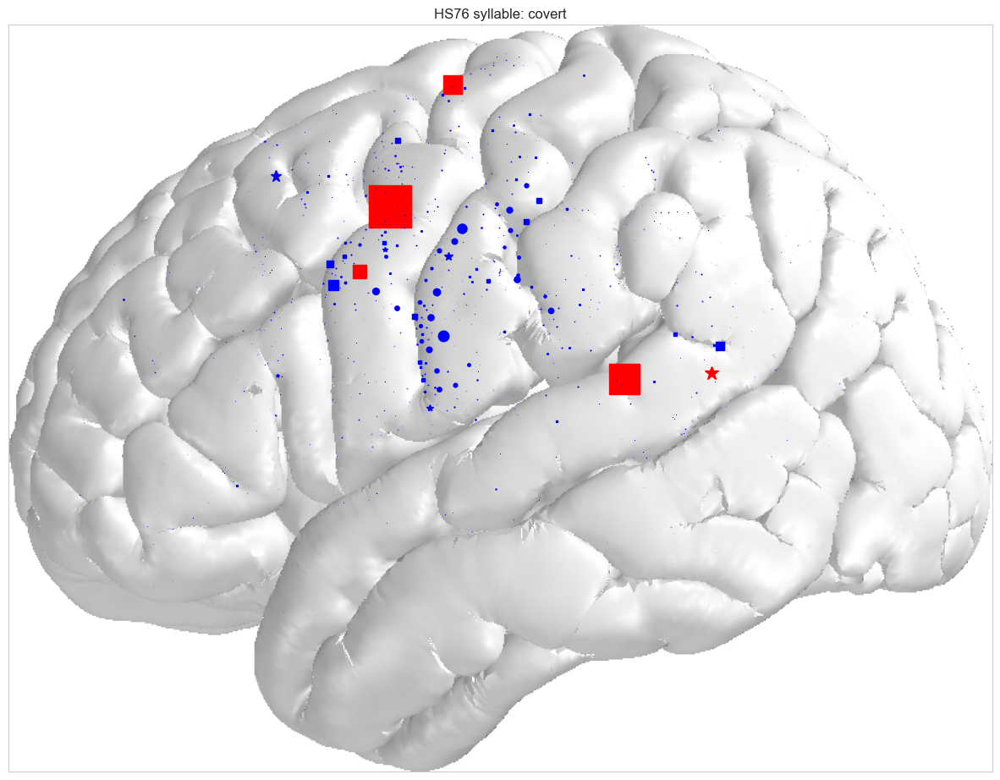

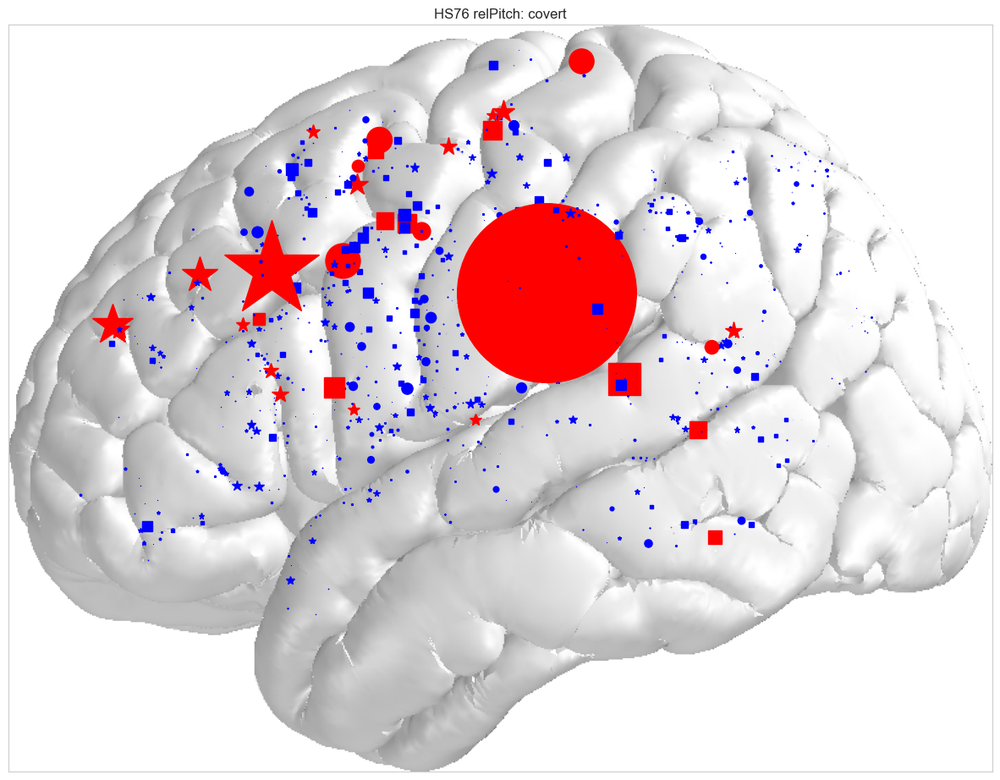

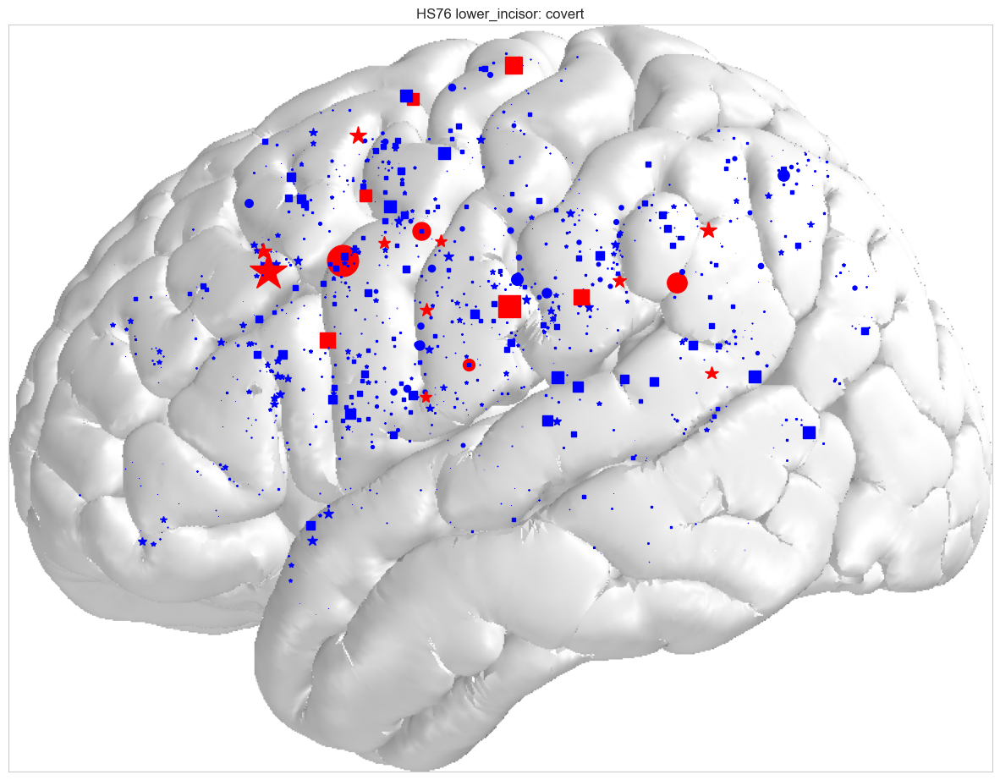

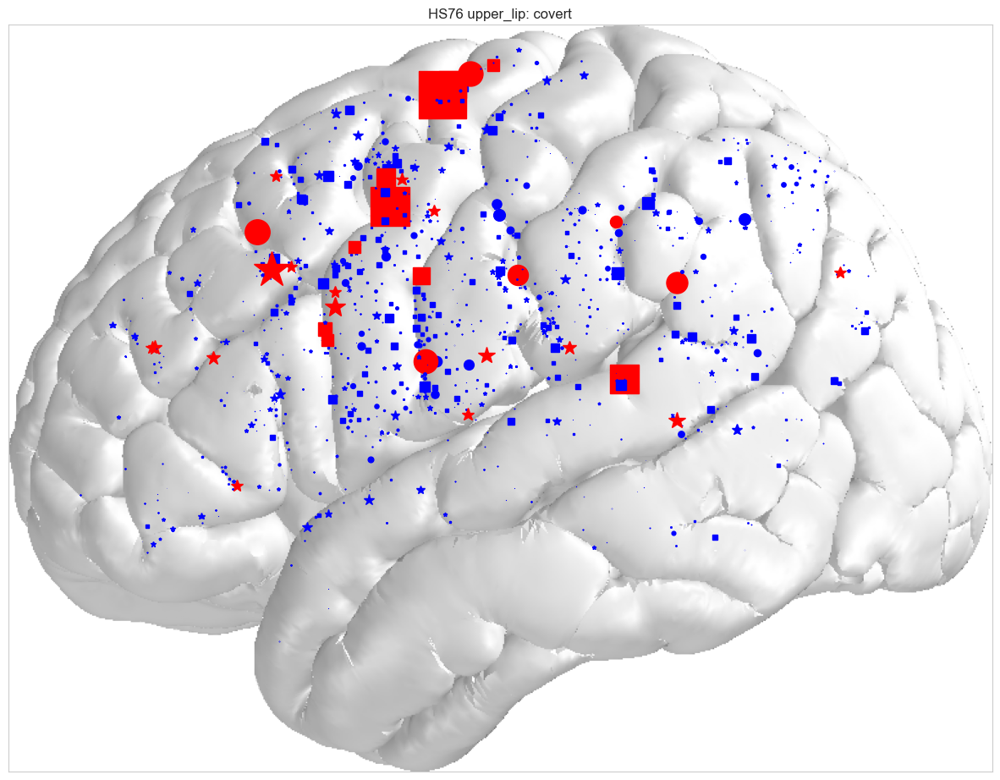

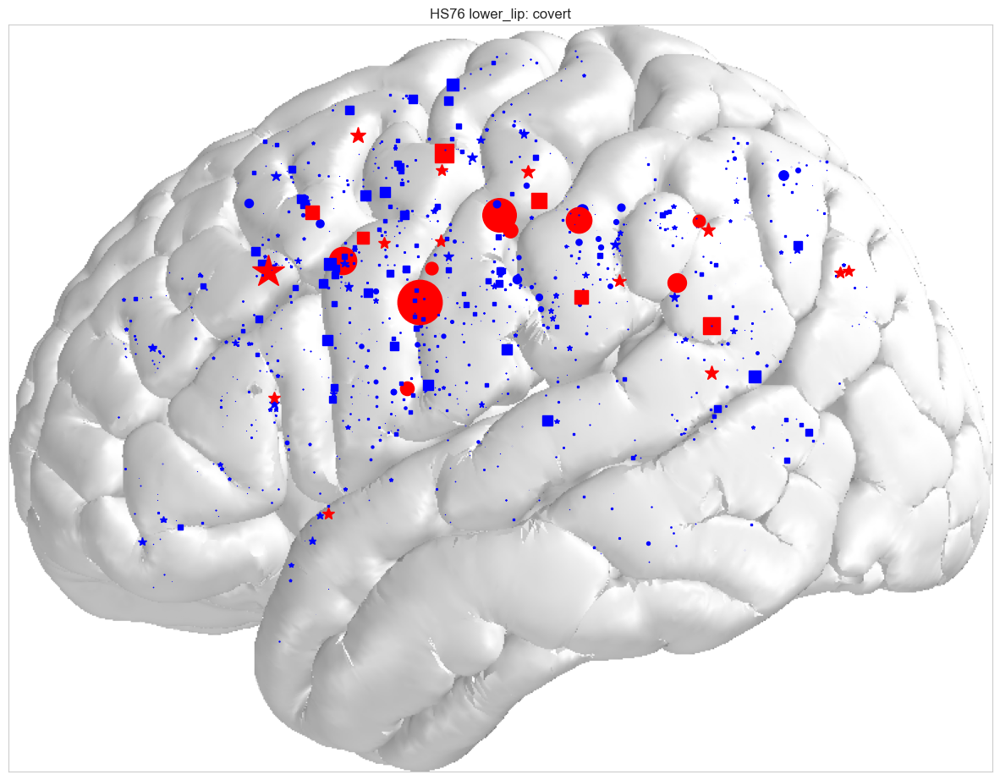

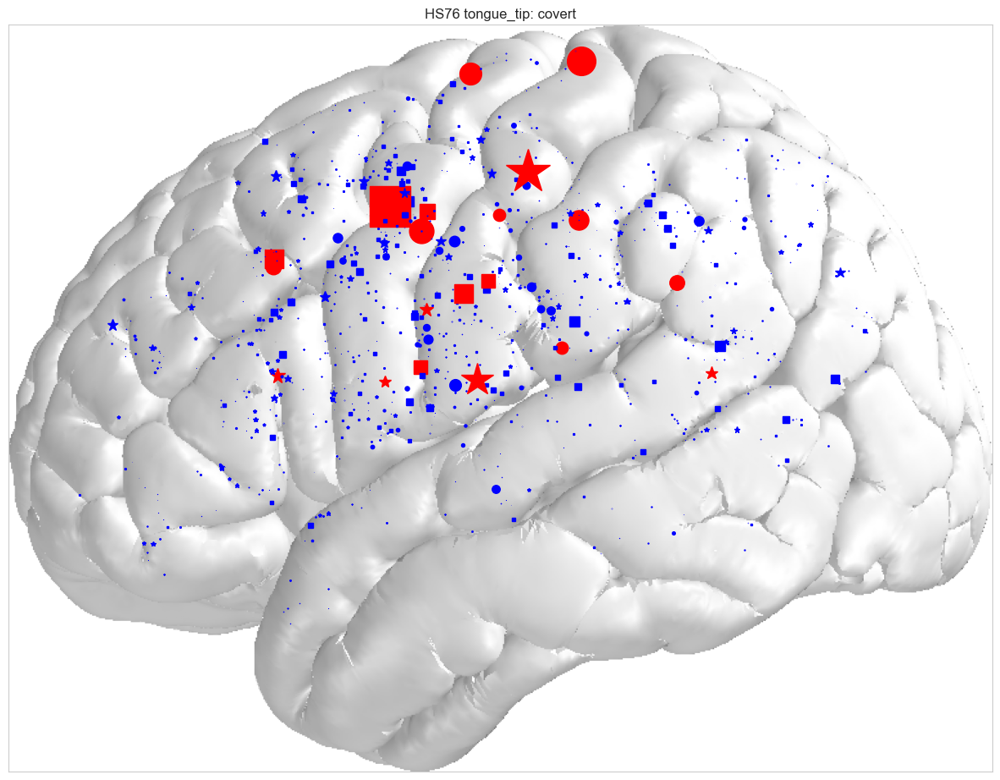

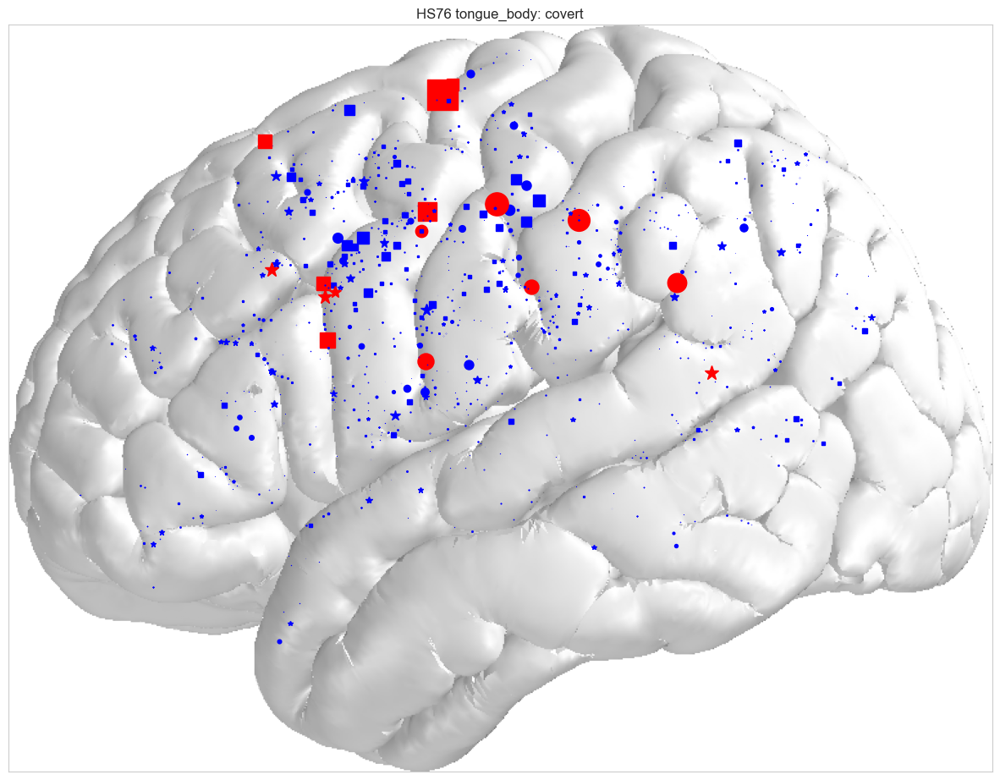

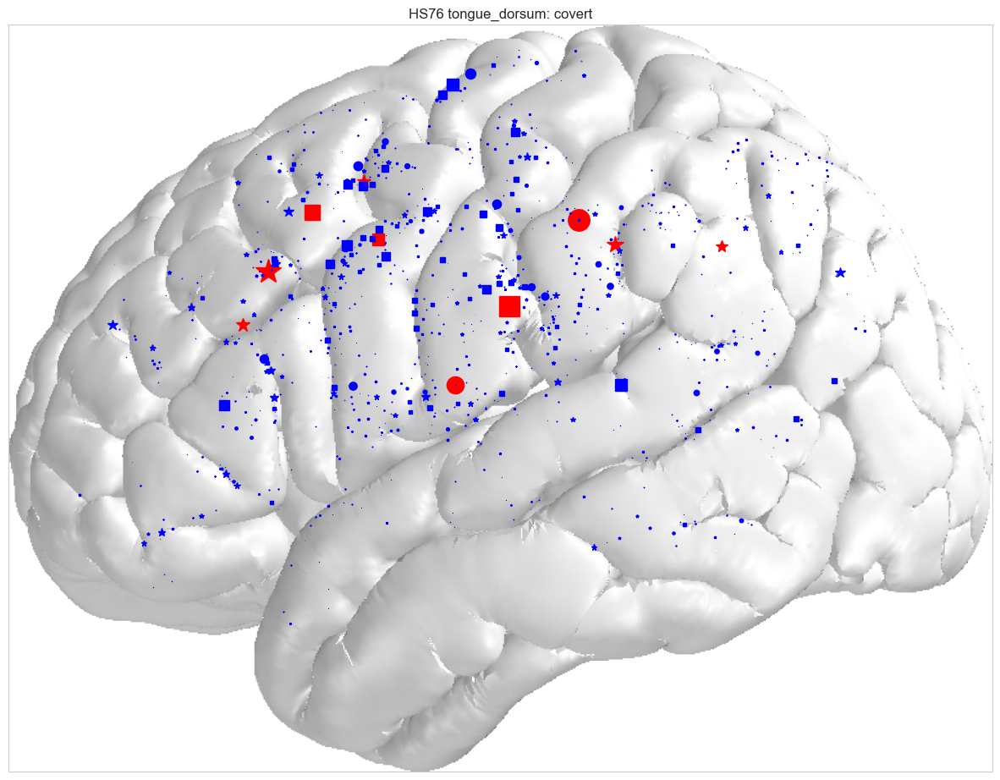

In [92]:
import matplotlib.image as mpimg
import scipy.io as scio


def plot_uni_brain(HS_list,model,task_name,nn_feature,warped=True):
    
    
    plt.figure(figsize=(15,15))
    path = "D:\\BaiduSyncdisk\\code\\elecs\\"
    img = mpimg.imread(path +"MNI.png")
    plt.imshow(img)
    for HS in HS_list:
        path = "D:\\BaiduSyncdisk\\code\\elecs\\"
        elec_path = "D:\\BaiduSyncdisk\\code\\elecs\\"+str(HS)+"sig_elecs.npy"
    
        subject = 'HS'+str(HS)
        print(subject)
        if warped:
            xy = scio.loadmat(path+"\\warped\\" + subject + "_warped_elec_pos2D.mat")['elecmatrix']
            img = mpimg.imread(path +"MNI.png")
        else:
            img = mpimg.imread(path + subject + "_brain2D.png")
            xy = scio.loadmat(path + subject + "_elec_pos2D.mat")['elecmatrix']
        sig_elecs = np.load(elec_path,allow_pickle=True).item()
        
    
        
        n_chans = 256 if xy.shape[0] >= 256 else 128
        F_sig_elecs,F_values = load_F(HS)
        
       
        save_path = "TRF\\"+"HS"+str(HS)+"\\"
    
    
        r2_channel = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_"+model+"_r2_channel.npy",allow_pickle=True).item()
        noise_ceiling = 0.02 if task_name=="overt" else 0.01
        
        color_005 = {"yes":'r',"no":'b'}
            
        for elec in range(n_chans):
            if r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec]>0.005:
                temp = "yes"
            else:
                temp = "no"
            if elec in F_sig_elecs[task_name]:
                plt.plot(xy[elec,0],xy[elec,1],marker = 'o',markersize =(r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling*20,color=color_005[temp])
            elif elec in sig_elecs[task_name]:
                plt.plot(xy[elec,0],xy[elec,1],marker = 's',markersize =(r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling*20,color=color_005[temp])
            else:
                plt.plot(xy[elec,0],xy[elec,1],marker = '*',markersize =(r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling*20,color=color_005[temp])
            
    
        plt.title("HS"+str(HS)+" "+nn_feature+": "+task_name)
        plt.box(on=None)
        plt.yticks([])
        plt.xticks([])
HS = 73

feature_pool = {}
ex_features = {}
feature_pool["phonetic_model"] = ['syllable', 'bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular','voiced', 'oral stop', 'fricative', 'back tongue']
ex_features["phonetic_model"] = ['syllable', 'bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular','voiced', 'oral stop', 'fricative', 'back tongue']

feature_pool["trace_model"] = ['syllable', "relPitch","lower_incisor","tongue","lip"]
ex_features["trace_model"] = ['syllable', "relPitch","lower_incisor","tongue","lip"]

feature_pool["trace_separate_model"] = ['syllable', "relPitch","lower_incisor","upper_lip","lower_lip","tongue_tip","tongue_body","tongue_dorsum"]
ex_features["trace_separate_model"] = ['syllable', "relPitch","lower_incisor","upper_lip","lower_lip","tongue_tip","tongue_body","tongue_dorsum"]

task_name_list = ["covert"]
for nn_feature in ex_features["trace_separate_model"]:
    for task_name in task_name_list:
        plot_uni_brain([44,45,47,48,50,54,71,76],"trace_separate_model",task_name,nn_feature)

In [91]:
import matplotlib.image as mpimg
import scipy.io as scio


def plot_uni_trace_brain(HS_list,model,task_name,nn_features,warped=True):
    
    
    plt.figure(figsize=(15,15))
    path = "D:\\BaiduSyncdisk\\code\\elecs\\"
    img = mpimg.imread(path +"MNI.png")
    plt.imshow(img)
    for HS in HS_list:
        path = "D:\\BaiduSyncdisk\\code\\elecs\\"
        elec_path = "D:\\BaiduSyncdisk\\code\\elecs\\"+str(HS)+"sig_elecs.npy"
    
        subject = 'HS'+str(HS)
        print(subject)
        if warped:
            xy = scio.loadmat(path+"\\warped\\" + subject + "_warped_elec_pos2D.mat")['elecmatrix']
            img = mpimg.imread(path +"MNI.png")
        else:
            img = mpimg.imread(path + subject + "_brain2D.png")
            xy = scio.loadmat(path + subject + "_elec_pos2D.mat")['elecmatrix']
        sig_elecs = np.load(elec_path,allow_pickle=True).item()
        
    
        
        n_chans = 256 if xy.shape[0] >= 256 else 128
        F_sig_elecs,F_values = load_F(HS)
        
       
        save_path = "TRF\\"+"HS"+str(HS)+"\\"
    
    
        r2_channel = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_"+model+"_r2_channel.npy",allow_pickle=True).item()
        noise_ceiling = 0.02 if task_name=="overt" else 0.01
        
        color_005 = {"yes":'r',"no":'b'}
            
        for elec in range(n_chans):
            if r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec]>0.005:
                temp = "yes"
            else:
                temp = "no"
            if elec in F_sig_elecs[task_name]:
                plt.plot(xy[elec,0],xy[elec,1],marker = 'o',markersize =(r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling*20,color=color_005[temp])
            elif elec in sig_elecs[task_name]:
                plt.plot(xy[elec,0],xy[elec,1],marker = 's',markersize =(r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling*20,color=color_005[temp])
            else:
                plt.plot(xy[elec,0],xy[elec,1],marker = '*',markersize =(r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling*20,color=color_005[temp])
            
    
        plt.title("HS"+str(HS)+" "+nn_feature+": "+task_name)
        plt.box(on=None)
        plt.yticks([])
        plt.xticks([])
HS = 73

feature_pool = {}
ex_features = {}
feature_pool["phonetic_model"] = ['syllable', 'bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular','voiced', 'oral stop', 'fricative', 'back tongue']
ex_features["phonetic_model"] = ['syllable', 'bilabial', 'secondary labial', 'alveolar', 'velar', 'mandibular','voiced', 'oral stop', 'fricative', 'back tongue']

feature_pool["trace_model"] = ['syllable', "relPitch","lower_incisor","tongue","lip"]
ex_features["trace_model"] = ['syllable', "relPitch","lower_incisor","tongue","lip"]

feature_pool["trace_separate_model"] = ['syllable', "relPitch","lower_incisor","upper_lip","lower_lip","tongue_tip","tongue_body","tongue_dorsum"]
ex_features["trace_separate_model"] = ['syllable', "relPitch","lower_incisor","upper_lip","lower_lip","tongue_tip","tongue_body","tongue_dorsum"]

task_name_list = ["covert"]
for nn_feature in ex_features["trace_separate_model"]:
    for task_name in task_name_list:
        plot_uni_trace_brain([44,45,47,48,50,54,71,76],"trace_separate_model",task_name,ex_features["trace_separate_model"])

ValueError: Unknown mat file type, version 101, 99

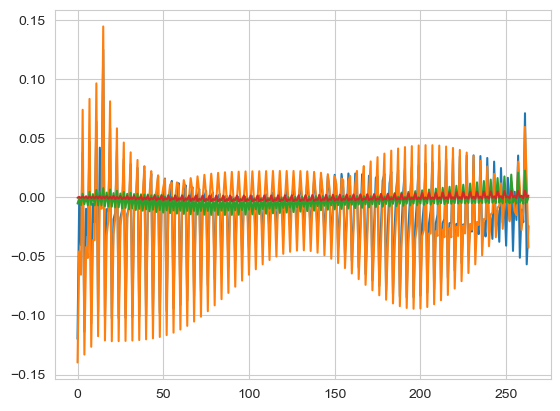

In [133]:
plt.plot(wts_folds_all['lip'][1,:,82])
plt.plot(wts_folds_all['lip'][2,:,82])
plt.plot(wts_folds_all['lip'][3,:,82])
plt.plot(wts_folds_all['lip'][4,:,82])

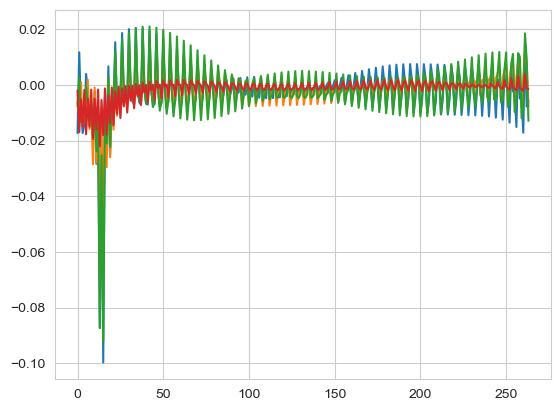

In [132]:
plt.plot(wts_folds_all['lip'][1,:,127])
plt.plot(wts_folds_all['lip'][2,:,127])
plt.plot(wts_folds_all['lip'][3,:,127])
plt.plot(wts_folds_all['lip'][4,:,127])

# 绘制R2 mel 和 phonetics

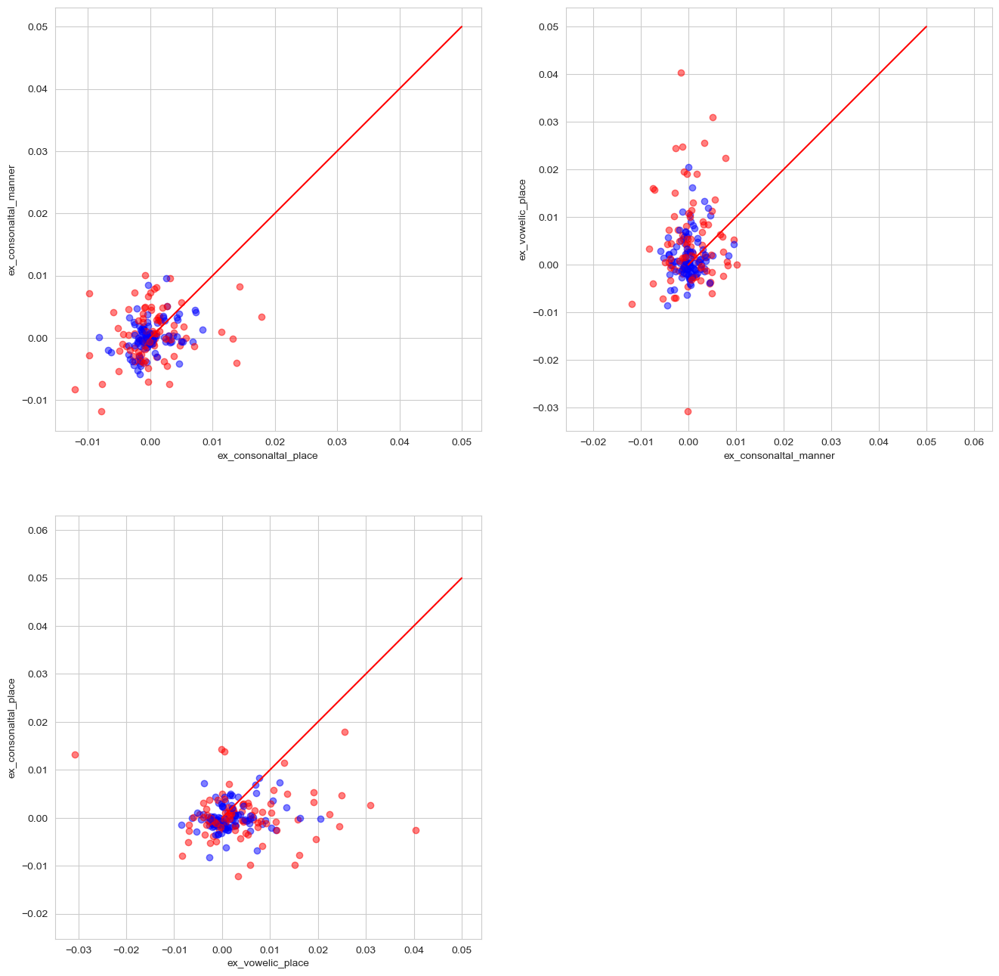

In [4]:
HS = 73
ds = 0.6
fs = 100
task_name = "covert"
save_path = "TRF\\"+"HS"+str(HS)+"\\"

r2_channel = np.load(save_path+"HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()

r2_channel_covert = np.load(save_path+"HS"+str(HS)+"_"+"covert"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
r2_channel_overt = np.load(save_path+"HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()

path = "D:\\BaiduSyncdisk\\code\\elecs\\"
elec_path = "D:\\BaiduSyncdisk\\code\\elecs\\"+str(HS)+"sig_elecs.npy"

subject = 'HS'+str(HS)
img = mpimg.imread(path + subject + "_brain2D.png")
xy = scio.loadmat(path + subject + "_elec_pos2D.mat")['elecmatrix']

elec_path = "D:\\BaiduSyncdisk\\code\\elecs\\"+str(HS)+"sig_elecs.npy"
sig_elecs = np.load(elec_path,allow_pickle=True).item()
n_chans = 256 if xy.shape[0] >= 256 else 128
plt.figure(figsize=(16,16))

watch_feature_list = ["syllable","mel","trace","phonetics","ex_consonaltal_place","ex_consonaltal_manner","ex_vowelic_place"]
factor_0_list = np.array([1,2,3])+3
factor_1_list = np.array([2,3,1])+3


figz =1
for compare in range(3):
    plt.subplot(2,2,figz)

    factor_0 = factor_0_list[figz-1]
    factor_1 = factor_1_list[figz-1]
    figz+=1
    for i in range(n_chans):
        if i in sig_elecs["overt"]:
            plt.scatter(r2_channel_overt["phonetics"][i]-r2_channel_overt[watch_feature_list[factor_0]][i],r2_channel_overt["phonetics"][i]-r2_channel_overt[watch_feature_list[factor_1]][i],alpha= 0.5,color='r')
        if i in sig_elecs["covert"]:
            plt.scatter(r2_channel_covert["phonetics"][i]-r2_channel_covert[watch_feature_list[factor_0]][i],r2_channel_covert["phonetics"][i]-r2_channel_covert[watch_feature_list[factor_1]][i],alpha= 0.5,color='b')
            #plt.arrow(r2_channel_covert["mel"][i], r2_channel_covert["trace"][i], r2_channel_overt["mel"][i]-r2_channel_covert["mel"][i], r2_channel_overt["trace"][i] -r2_channel_covert["trace"][i], length_includes_head=False,width=0.0001, fc='b', ec='k',alpha=0.5)
    plt.plot(np.linspace(0,0.05,10),np.linspace(0,0.05,10),'r')
    plt.xlabel(watch_feature_list[factor_0])
    plt.ylabel(watch_feature_list[factor_1])
    plt.axis("equal")



# 绘制delta与F值的关系

In [172]:
from scipy.stats import pearsonr
def load_F(HS):
    
    F_values_save_path = "F_values\\" + "HS" + str(HS) + "\\"
    save_sig_name = "HS"+str(HS)+"_F_sig.npy"
    save_name = "HS"+str(HS)+"_F_values.npy"
    F_values = np.load(F_values_save_path+save_name,allow_pickle=True).item()
    F_sig_elec_path = F_values_save_path+save_sig_name
    F_sig_elecs = np.load(F_sig_elec_path,allow_pickle=True).item()
    F_values = F_values[:,0,:]
    return F_sig_elecs,F_values

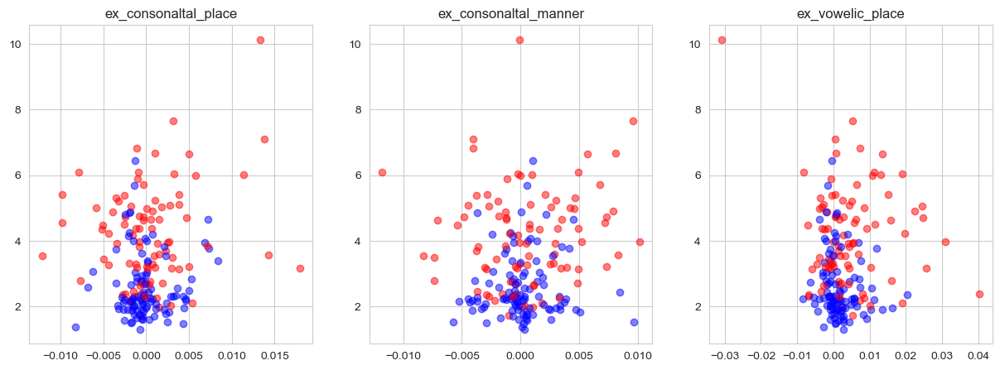

In [7]:
HS = 73
ds = 0.6
fs = 100
task_name = "covert"
save_path = "TRF\\"+"HS"+str(HS)+"\\"

r2_channel = np.load(save_path+"HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()

r2_channel_covert = np.load(save_path+"HS"+str(HS)+"_"+"covert"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
r2_channel_overt = np.load(save_path+"HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
r2_channel_cue = np.load(save_path+"HS"+str(HS)+"_"+"cue"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()

path = "D:\\BaiduSyncdisk\\code\\elecs\\"
elec_path = "D:\\BaiduSyncdisk\\code\\elecs\\"+str(HS)+"sig_elecs.npy"

subject = 'HS'+str(HS)
img = mpimg.imread(path + subject + "_brain2D.png")
xy = scio.loadmat(path + subject + "_elec_pos2D.mat")['elecmatrix']

F_sig_elecs,F_values = load_F(HS)
task_name_list = ['overt', 'covert', 'cue']
max_f = np.zeros([3,256])
for i in range(3):
    max_f[i] = np.max(F_values[task_name_list[i]],axis=1)


sig_elecs = np.load(elec_path,allow_pickle=True).item()
n_chans = 256 if xy.shape[0] >= 256 else 128
fig, axs =  plt.subplots(3,3,figsize=(15,15))
watch_feature_list = ["ex_consonaltal_place","ex_consonaltal_manner","ex_vowelic_place"]
factor_0_list = np.array([1,2,3])+3
factor_1_list = np.array([2,3,1])+3



figz =1
for feature in range(3):
    for task_name in range(3): 

        for i in range(n_chans):
            if i in sig_elecs["overt"]:
                axs[feature,task_name].scatter(r2_channel_overt["phonetics"][i]-r2_channel_overt[watch_feature_list[feature]][i],max_f[0][i],alpha= 0.5,color='r')
            if i in sig_elecs["covert"]:
                axs[feature,task_name].scatter(r2_channel_covert["phonetics"][i]-r2_channel_covert[watch_feature_list[feature]][i],max_f[1][i],alpha= 0.5,color='b')
            if i in sig_elecs["cue"]:
                axs[feature,task_name].scatter(r2_channel_covert["phonetics"][i]-r2_channel_cue[watch_feature_list[feature]][i],max_f[1][i],alpha= 0.5,color='b')

            
    axs[feature].set_title(watch_feature_list[feature])
    #plt.plot(np.linspace(0,0.05,10),np.linspace(0,0.05,10),'r')
    # plt.xlabel(watch_feature_list[factor_0])
    # plt.ylabel(watch_feature_list[factor_1])
    #plt.axis("equal")



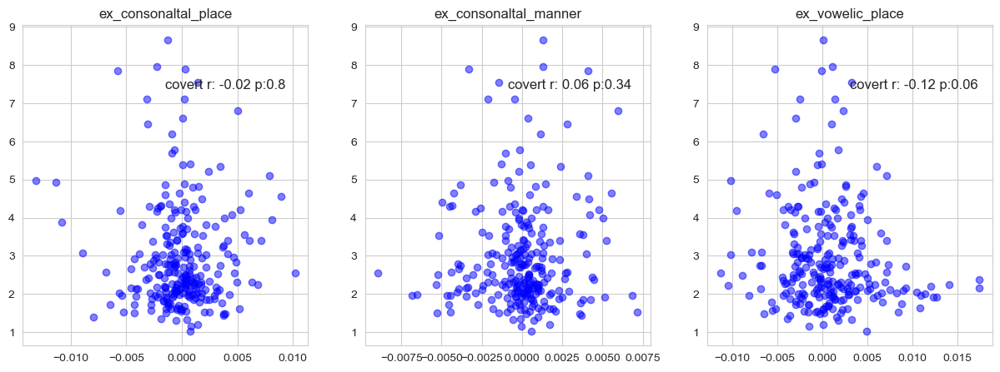

In [76]:
HS = 73
ds = 0.6
fs = 100
task_name = "covert"
save_path = "TRF\\"+"HS"+str(HS)+"\\"

r2_channel = np.load(save_path+"HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()

r2_channel_covert = np.load(save_path+"HS"+str(HS)+"_"+"covert"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
r2_channel_overt = np.load(save_path+"HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()

path = "D:\\BaiduSyncdisk\\code\\elecs\\"
elec_path = "D:\\BaiduSyncdisk\\code\\elecs\\"+str(HS)+"sig_elecs.npy"
sig_elecs = np.load(elec_path,allow_pickle=True).item()
subject = 'HS'+str(HS)
img = mpimg.imread(path + subject + "_brain2D.png")
xy = scio.loadmat(path + subject + "_elec_pos2D.mat")['elecmatrix']
F_sig_elecs,F_values = load_F(HS)

task_name_list = ['overt', 'covert', 'cue']

sig_elecs_dis = {}



n_chans = 256 if xy.shape[0] >= 256 else 128
fig, axs =  plt.subplots(1,3,figsize=(15,5))

watch_feature_list = ["ex_consonaltal_place","ex_consonaltal_manner","ex_vowelic_place"]
factor_0_list = np.array([1,2,3])+3
factor_1_list = np.array([2,3,1])+3



figz =1
for feature in range(3):
    cor_f_r_overt = []
    cor_f_r_covert = []
    for i in range(n_chans):
        #if i in sig_elecs["overt"]:
            # axs[feature].scatter(r2_channel_overt["phonetics"][i]-r2_channel_overt[watch_feature_list[feature]][i],max_f[0][i],alpha= 0.5,color='r')
            # cor_f_r_overt.append([r2_channel_overt["phonetics"][i]-r2_channel_overt[watch_feature_list[feature]][i],max_f[0][i]])
        #if i in sig_elecs["covert"]:
            axs[feature].scatter(r2_channel_covert["phonetics"][i]-r2_channel_covert[watch_feature_list[feature]][i],max_f[1][i],alpha= 0.5,color='b')
            cor_f_r_covert.append([r2_channel_covert["phonetics"][i]-r2_channel_covert[watch_feature_list[feature]][i],max_f[1][i]])
            #plt.arrow(r2_channel_covert["melce"][i], r2_channel_covert["trace"][i], r2_channel_overt["mel"][i]-r2_channel_covert["mel"][i], r2_channel_overt["trace"][i] -r2_channel_covert["trace"][i], length_includes_head=False,width=0.0001, fc='b', ec='k',alpha=0.5)
        #if i not in sig_elecs["overt"] and sig_elecs["covert"]:
        #   axs[feature].scatter(r2_channel_covert["phonetics"][i]-r2_channel_covert[watch_feature_list[feature]][i],max_f[1][i],alpha= 0.5,color='k')
   # overt_r = pearsonr(np.array(cor_f_r_overt)[:,0],np.array(cor_f_r_overt)[:,1])
    covert_r = pearsonr(np.array(cor_f_r_covert)[:,0],np.array(cor_f_r_covert)[:,1])
    #axs[feature].text(0.5, 0.9, "overt r: "+str(np.around(overt_r[0],2))+" p:"+str(np.around(overt_r[1],2)), fontsize=12,transform=axs[feature].transAxes)
    axs[feature].text(0.5, 0.8, "covert r: "+str(np.around(covert_r[0],2))+" p:"+str(np.around(covert_r[1],2)), fontsize=12,transform=axs[feature].transAxes)
    axs[feature].set_title(watch_feature_list[feature])
    #plt.plot(np.linspace(0,0.05,10),np.linspace(0,0.05,10),'r')
    # plt.xlabel(watch_feature_list[factor_0])
    # plt.ylabel(watch_feature_list[factor_1])
    #plt.axis("equal")



# 看看总模型

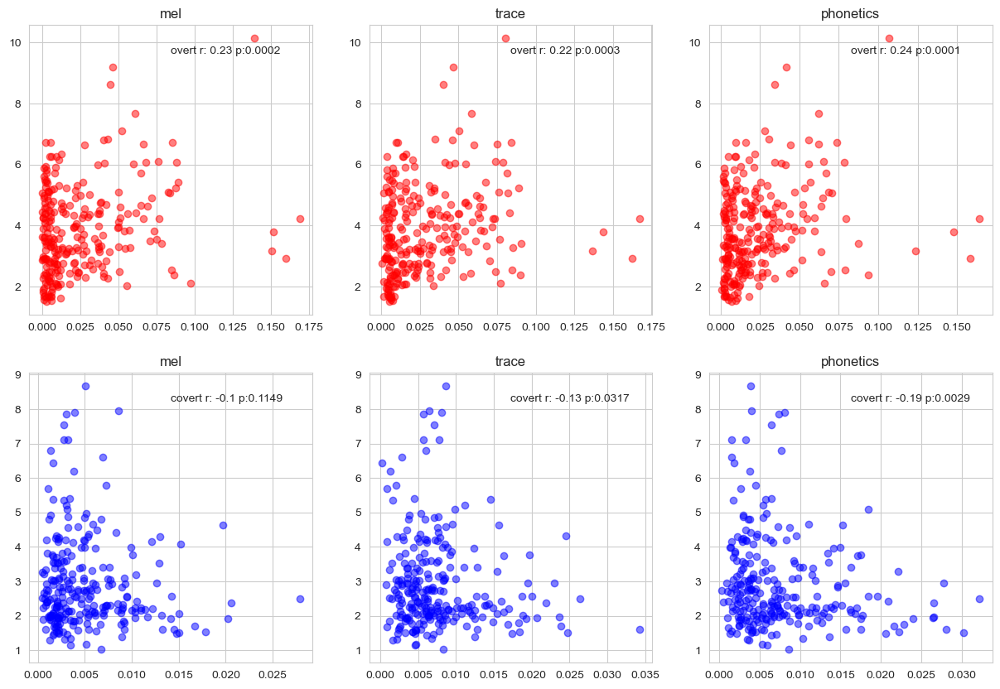

In [23]:

HS = 73
ds = 0.6
fs = 100
task_name = "covert"
save_path = "TRF\\"+"HS"+str(HS)+"\\"

r2_channel = np.load(save_path+"HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()

r2_channel_covert = np.load(save_path+"HS"+str(HS)+"_"+"covert"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
r2_channel_overt = np.load(save_path+"HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()

path = "D:\\BaiduSyncdisk\\code\\elecs\\"
elec_path = "D:\\BaiduSyncdisk\\code\\elecs\\"+str(HS)+"sig_elecs.npy"

subject = 'HS'+str(HS)
img = mpimg.imread(path + subject + "_brain2D.png")
xy = scio.loadmat(path + subject + "_elec_pos2D.mat")['elecmatrix']

F_values = np.load("F_values\\HS73\\HS73_F_values.npy",allow_pickle=True).item()
task_name_list = ['overt', 'covert', 'cue']
max_f = np.zeros([3,256])
for i in range(3):
    max_f[i] = np.max(F_values[task_name_list[i]][:,0,:],axis=1)
sig_elecs_dis = {}
max_f_index = np.zeros([3,256])


sig_elecs = np.load(elec_path,allow_pickle=True).item()
n_chans = 256 if xy.shape[0] >= 256 else 128
fig, axs =  plt.subplots(2,3,figsize=(15,10))
total_R_feature_list = ["mel","trace","phonetics"]
factor_0_list = np.array([1,2,3])+3
factor_1_list = np.array([2,3,1])+3



figz =1
for overt_on in range(2):
    for feature in range(3):
        cor_f_r_overt = []
        cor_f_r_covert = []
        if overt_on == 0:
            for i in range(n_chans):
                axs[overt_on,feature].scatter(r2_channel_overt[total_R_feature_list[feature]][i],max_f[0][i],alpha= 0.5,color='r')
                cor_f_r_overt.append([r2_channel_overt[total_R_feature_list[feature]][i],max_f[0][i]])
            overt_r = pearsonr(np.array(cor_f_r_overt)[:,0],np.array(cor_f_r_overt)[:,1])
            axs[overt_on,feature].text(0.5, 0.9, "overt r: "+str(np.around(overt_r[0],2))+" p:"+str(np.around(overt_r[1],4)), fontsize=10,transform=axs[overt_on,feature].transAxes)

        if overt_on == 1:
            for i in range(n_chans):
                axs[overt_on,feature].scatter(r2_channel_covert[total_R_feature_list[feature]][i],max_f[1][i],alpha= 0.5,color='b')
                cor_f_r_covert.append([r2_channel_covert[total_R_feature_list[feature]][i],max_f[1][i]])
                
            covert_r = pearsonr(np.array(cor_f_r_covert)[:,0],np.array(cor_f_r_covert)[:,1])
            axs[overt_on,feature].text(0.5, 0.9, "covert r: "+str(np.around(covert_r[0],2))+" p:"+str(np.around(covert_r[1],4)), fontsize=10,transform=axs[overt_on,feature].transAxes)
        axs[overt_on,feature].set_title(total_R_feature_list[feature])
        #plt.plot(np.linspace(0,0.05,10),np.linspace(0,0.05,10),'r')
        # plt.xlabel(watch_feature_list[factor_0])
        # plt.ylabel(watch_feature_list[factor_1])
        #plt.axis("equal")



# 绘制默读特征

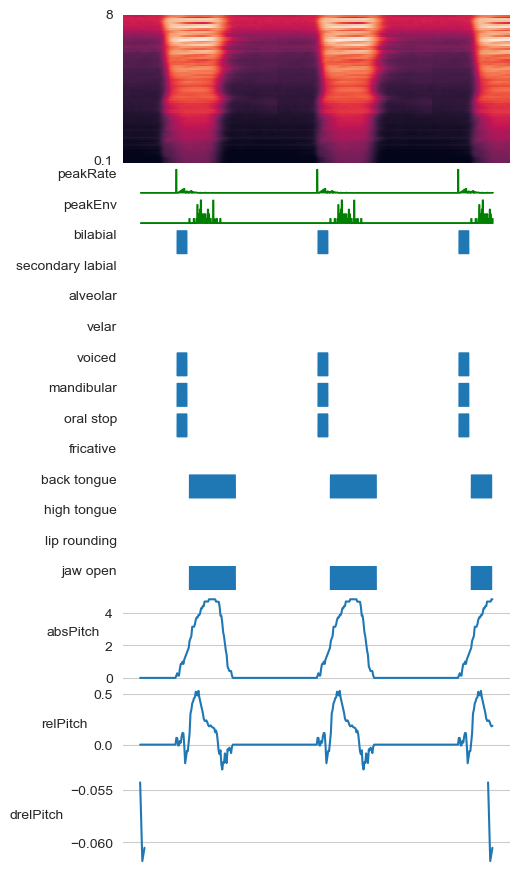

In [278]:
task_name = "covert"
mat_file_name = save_path+"HS"+str(HS)+"_"+task_name+"_"+"_feat_mat.npy"

feat_mat = np.load(mat_file_name,allow_pickle=True).item()

fig = plt.figure(figsize=[5,15])
grid  = plt.GridSpec(3+5+12+3*3+3*3,1,figure=fig)


#mel绘制
plt.subplot(grid[3:3+5,0])
sns.heatmap(feat_mat["mel"][:400,:].T,cbar=False)
plt.yticks([0,79],[8,0.1],rotation=0)
plt.xticks([])

#
#第一步feature绘制
feat_env_list = ["Env","peakRate","peakEnv"]

for i in range(1,len(feat_env_list)):

    plt.subplot(grid[8+i-1,0])
    temp = feat_mat[feat_env_list[i]][:400].reshape(-1)
    temp = np.repeat(temp,10,axis=0)

    #plt.plot(temp)
    plt.fill_between(np.arange(len(temp)),0, temp, alpha=1,color='g')

    plt.grid('off')
    plt.yticks([])
    #plt.ylim([0,1])
    plt.xticks([])
    plt.box(on=None)
    plt.ylabel(feat_env_list[i],rotation=0,ha='right', rotation_mode='anchor')

plt.xticks([])
#第一步feature绘制
phonetic_feature = ['bilabial', 'secondary labial', 'alveolar', 'velar', 'voiced',
   'mandibular', 'oral stop', 'fricative', 'back tongue', 'high tongue',
   'lip rounding', 'jaw open']
for i in range(len(phonetic_feature)):
    plt.subplot(grid[2+8+i,0])
    temp = feat_mat[phonetic_feature[i]][:400].reshape(-1)
    temp = np.repeat(temp,10,axis=0)

    #plt.plot(temp)
    plt.fill_between(np.arange(len(temp)),0, temp, alpha=1)

    plt.grid('off')
    plt.yticks([])
    plt.ylim([0,1])
    plt.xticks([])
    plt.box(on=None)
    plt.ylabel(phonetic_feature[i],rotation=0,ha='right', rotation_mode='anchor')


#第二步feature绘制
feat_wav_list = ["absPitch","relPitch","drelPitch"]
feature_two_index = 5


# for i in range(len(feat_wav_list)):
for i in range(3):
    plt.subplot(grid[2+8+12+3*i:2+8+12+3*i+3,0])



    temp = feat_mat[feat_wav_list[i]][:400].reshape(-1)

    plt.plot(temp)

        #plt.fill_between(np.arange(len(temp)),0, temp, alpha=1)
        #plt.plot(np.arange(first_valid_index,last_valid_index),temp[first_valid_index:last_valid_index])

    #
    #if i == 0: # 对abs单独设置
        #plt.yticks([np.log(180),np.log(320)],[180,320])
        #plt.ylim([np.log(180),np.log(320)])

    plt.grid('off')
    #plt.yticks([])
    #plt.ylim([0,1])
    #plt.xlim([0,800])
    plt.xticks([])
    plt.box(on=None)
    plt.ylabel(feat_wav_list[i],rotation=0,ha='right', rotation_mode='anchor')

In [193]:
feat_mat = np.load(mat_file_name,allow_pickle=True).item()


(72000, 1)

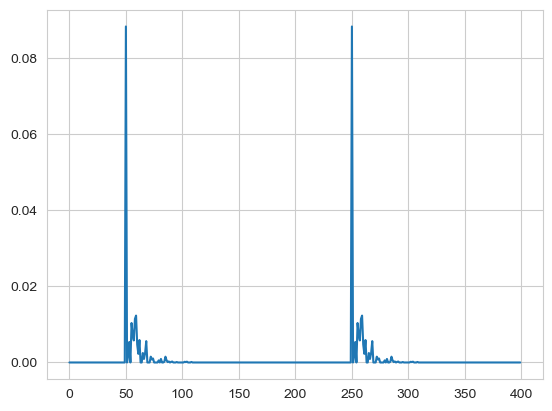

In [195]:
plt.plot(feat_mat["Env"][:400])
plt.plot(feat_mat["peakRate"][:400])

In [258]:
sound = "ga"
phonetic_feature_temp = np.expand_dims(get_phonetic_feature_cons(sound), -1)
phonetic_feature_temp

array([[0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [0.],
       [1.],
       [0.],
       [1.],
       [0.],
       [0.],
       [1.]])

<AxesSubplot:>

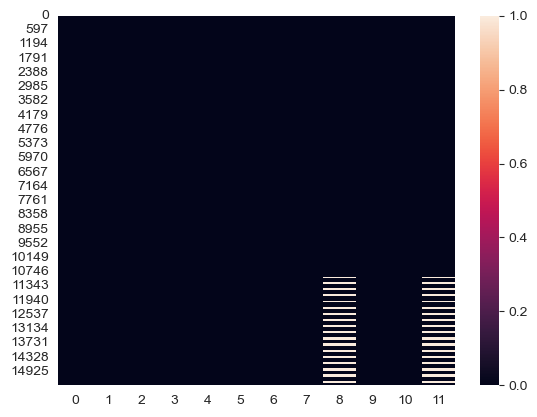

In [255]:
sns.heatmap(feat_mat["phonetics"])

<AxesSubplot:>

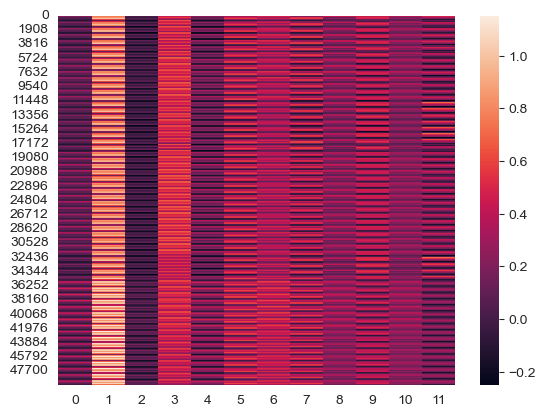

In [261]:
sns.heatmap(feat_mat["trace"])

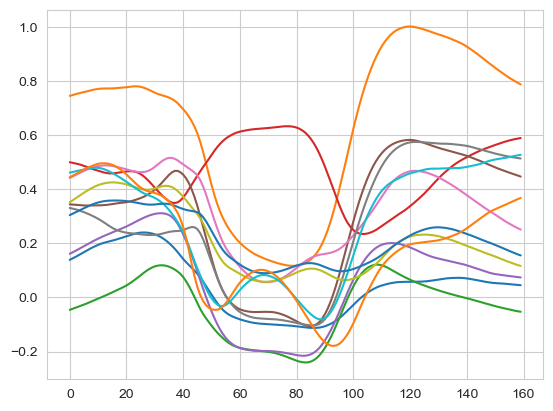

In [264]:
plt.plot(feat_mat["trace"][:160,:12])

C:\Users\DELL\anaconda3\envs\ECOG\lib\site-packages\seaborn\categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


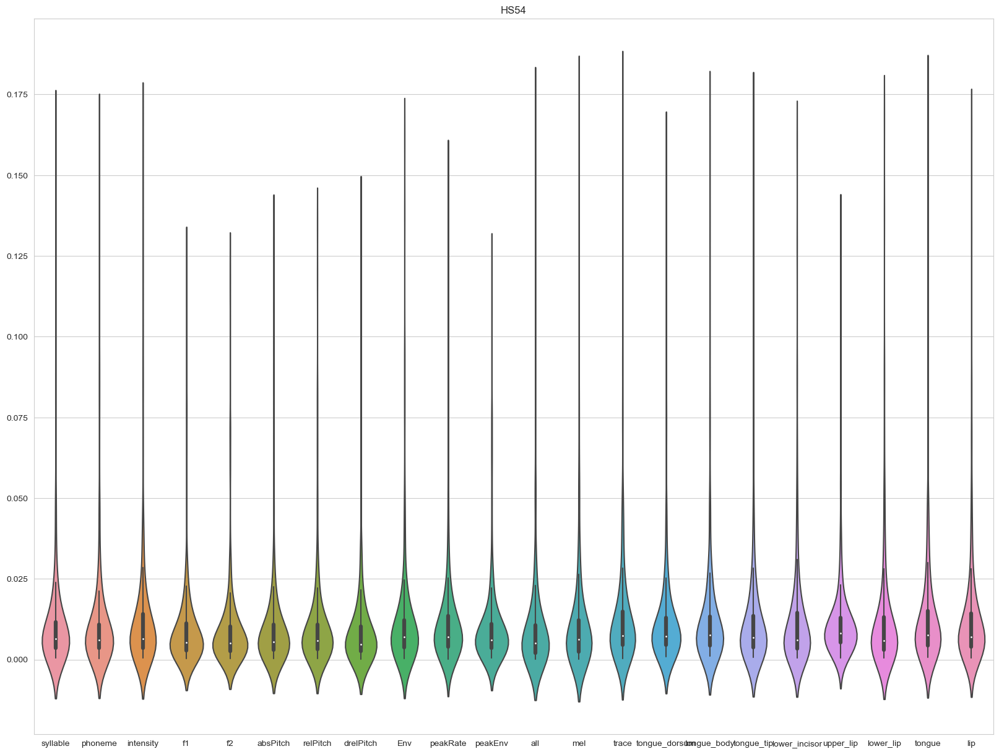

In [15]:

# ds = 0.6
# fs = 100
# z=1
# # plt.figure(figsize=(20,15))
# # for HS in HS_list:
# #     plt.title("HS"+str(HS))
# #     save_path = "TRF\\"+"HS"+str(HS)+"\\"
# #     r2_channel = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
# #     plt.subplot(3,2,z)
# #     z+=1
# #     factor_all = "all"
# #     factor_1 = "mel"
# #     factor_2 = "trace"
# #     plt.scatter(r2_channel[factor_all]-r2_channel[factor_1],r2_channel[factor_all]-r2_channel[factor_2])
# #     plt.plot(np.linspace(0,0.25,10),np.linspace(0,0.25,10),'r--')
# #     plt.xlabel(factor_1)
# #     plt.ylabel(factor_2)
# #     plt.axis("equal")
# plt.figure(figsize=(20,15))
# for HS in HS_list:
#     plt.title("HS"+str(HS))
#     save_path = "TRF\\"+"HS"+str(HS)+"\\"
#     r2_channel = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
#     z+=1
#     factor_all = "all"
#     factor_1 = "mel"
#     factor_2 = "trace"
#     sns.violinplot(pd.DataFrame(r2_channel))


# 默读到朗读的trace-mel r2的漂移

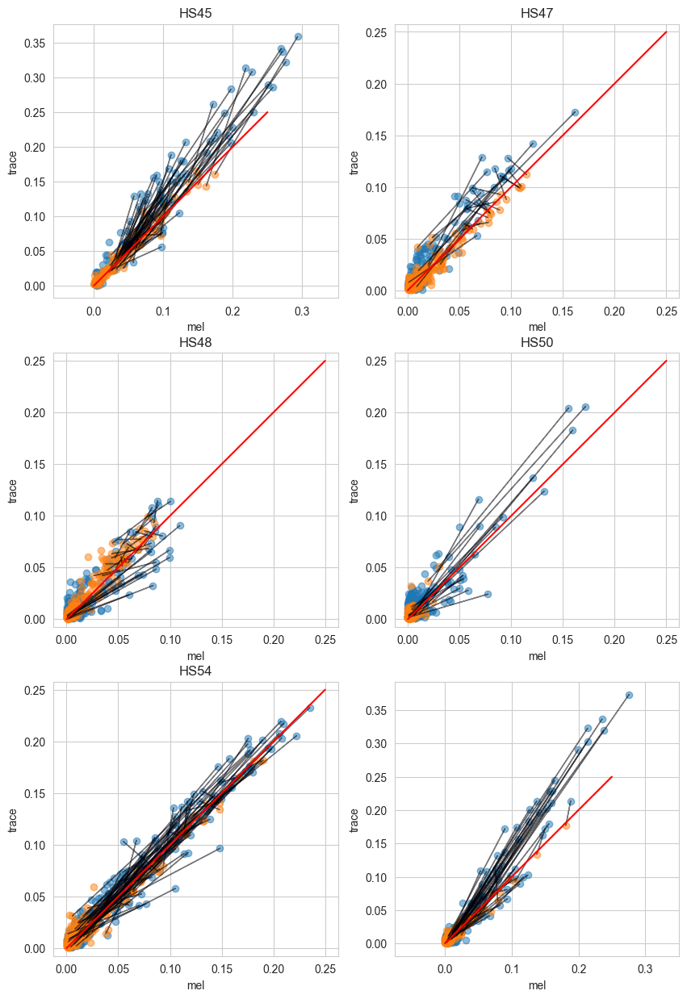

In [56]:
import seaborn as sns
import matplotlib.image as mpimg
import scipy.io as sio
import matplotlib.pyplot as plt
ds = 0.4
fs = 100
z=1
plt.figure(figsize=(10,15))

for HS in HS_list:
    plt.subplot(3,2,z)
    plt.title("HS"+str(HS))
    save_path = "TRF\\"+"HS"+str(HS)+"\\"

    r2_channel_covert = np.load(save_path+"HS"+str(HS)+"_"+"covert"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
    r2_channel_overt = np.load(save_path+"HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()


    z+=1
    plt.scatter(r2_channel_overt["mel"],r2_channel_overt["trace"],alpha= 0.5)
    plt.scatter(r2_channel_covert["mel"],r2_channel_covert["trace"],alpha= 0.5)
    for i in range(r2_channel_overt["mel"].shape[0]):
        if r2_channel_overt["mel"][i]>0.05:
            plt.arrow(r2_channel_covert["mel"][i], r2_channel_covert["trace"][i], r2_channel_overt["mel"][i]-r2_channel_covert["mel"][i], r2_channel_overt["trace"][i] -r2_channel_covert["trace"][i], length_includes_head=False,width=0.0001, fc='b', ec='k',alpha=0.5)
    plt.plot(np.linspace(0,0.25,10),np.linspace(0,0.25,10),'r')
    plt.xlabel("mel")
    plt.ylabel("trace")
    plt.axis("equal")



# 看朗读和默读，对于某个特征的差异

Text(0.5, 0.98, 'lip')

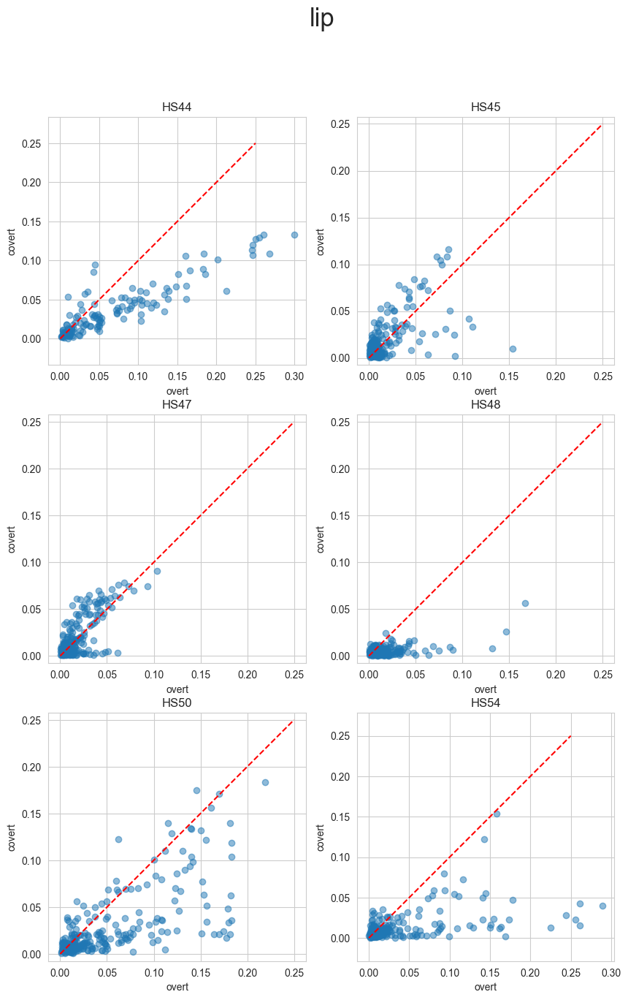

In [99]:
import seaborn as sns
import matplotlib.image as mpimg
import scipy.io as sio
import matplotlib.pyplot as plt
ds = 0.6
fs = 100
z=1
plt.figure(figsize=(10,15))
factor = nn_features[9]
for HS in HS_list:
    save_path = "TRF\\"+"HS"+str(HS)+"\\"

    r2_channel_covert = np.load(save_path+"HS"+str(HS)+"_"+"covert"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
    r2_channel_overt = np.load(save_path+"HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()

    plt.subplot(3,2,z)
    z+=1
    plt.title("HS"+str(HS))
    plt.scatter(r2_channel_overt[factor],r2_channel_covert[factor],alpha= 0.5)
    #plt.scatter(r2_channel_overt["trace"],r2_channel_covert["trace"],alpha= 0.5)

    plt.plot(np.linspace(0,0.25,10),np.linspace(0,0.25,10),'r--')

    plt.xlabel("overt")
    plt.ylabel("covert")
    plt.axis("equal")
plt.suptitle(factor,fontsize=25)

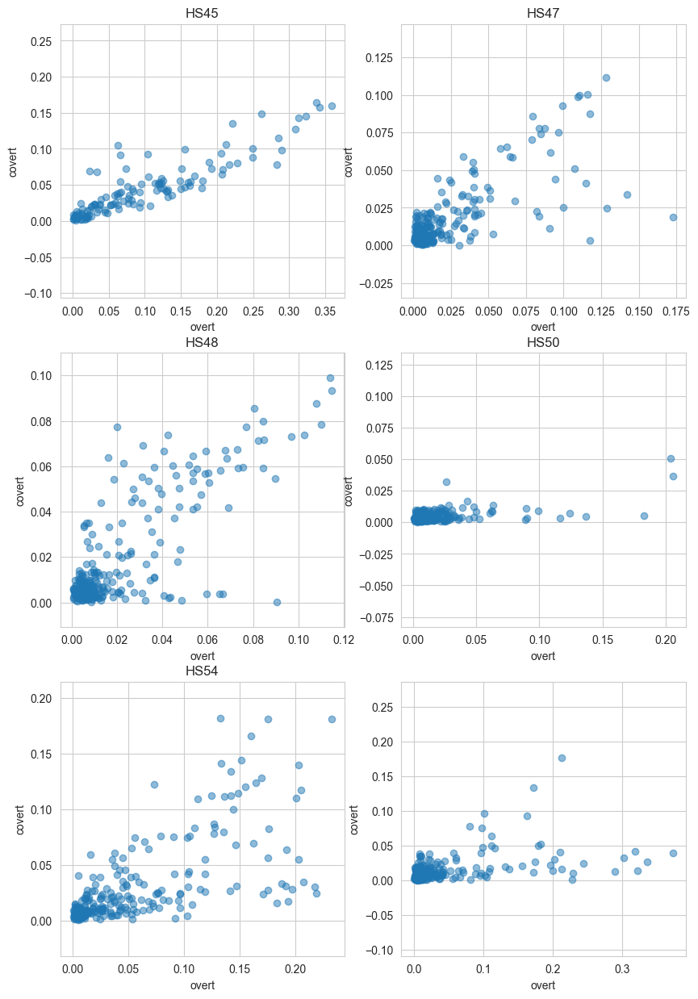

In [59]:
import seaborn as sns
import matplotlib.image as mpimg
import scipy.io as sio
import matplotlib.pyplot as plt
ds = 0.4
fs = 100
z=1
plt.figure(figsize=(10,15))
for HS in HS_list:
    plt.title("HS"+str(HS))
    r2_channel_covert = np.load("TRF\\HS"+str(HS)+"_"+"covert"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
    r2_channel_overt = np.load("TRF\\HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()

    plt.subplot(3,2,z)
    z+=1
    #plt.scatter(r2_channel_overt["mel"],r2_channel_covert["mel"],alpha= 0.5)
    plt.scatter(r2_channel_overt["trace"],r2_channel_covert["trace"],alpha= 0.5)


    plt.xlabel("overt")
    plt.ylabel("covert")
    plt.axis("equal")

# 看各个特征和各个电极脑电的相似度

In [8]:
HS = 45
save_path = "TRF\\"+"HS"+str(HS)+"\\"
task_name = "overt"
mat_file_name = save_path+"HS"+str(HS)+"_"+task_name+"_"+"_feat_mat.npy"
feat_mat = np.load(mat_file_name,allow_pickle=True).item()
HS_list = [44,45,47,48,50,54]


nn_features = ["mel","trace","tongue_dorsum","tongue_body","tongue_tip","lower_incisor","upper_lip","lower_lip","tongue","lip"]

In [18]:
from tqdm import *
nn_features = ["mel","trace","tongue_dorsum","tongue_body","tongue_tip","lower_incisor","upper_lip","lower_lip","tongue","lip"]
HS_list = [44,45,47,48,50,54]


for HS in HS_list:
    print("HS:",str(HS))
    cor_mat = {}
    save_path = "TRF\\"+"HS"+str(HS)+"\\"
    cor_save_path = "cor\\"+"HS"+str(HS)+"\\"
    if not os.path.exists(cor_save_path):
        os.mkdir(cor_save_path)

    task_name = "overt"
    mat_file_name = save_path+"HS"+str(HS)+"_"+task_name+"_"+"_feat_mat.npy"
    cor_file_name = cor_save_path + "HS"+str(HS)+"_"+task_name+"_"+"_cor_mat.npy"
    feat_mat = np.load(mat_file_name,allow_pickle=True).item()


    for nn_feat_name in nn_features:
        print("Processing %s" % nn_feat_name)
        hg = feat_mat["hg"]
        fe = feat_mat[nn_feat_name]
        cor_mat[nn_feat_name] = np.zeros([hg.shape[1],fe.shape[1]])
        for j in trange(hg.shape[1]):
            for i in range(fe.shape[1]):
                cor_mat[nn_feat_name][j,i] = np.corrcoef(hg[:,j],fe[:,i])[0,1]

    np.save(cor_file_name,cor_mat)


HS: 44
Processing mel


100%|██████████| 128/128 [00:05<00:00, 21.40it/s]


Processing trace


100%|██████████| 128/128 [00:00<00:00, 162.42it/s]


Processing tongue_dorsum


100%|██████████| 128/128 [00:00<00:00, 1084.78it/s]


Processing tongue_body


100%|██████████| 128/128 [00:00<00:00, 1112.96it/s]


Processing tongue_tip


100%|██████████| 128/128 [00:00<00:00, 1113.05it/s]


Processing lower_incisor


100%|██████████| 128/128 [00:00<00:00, 1113.05it/s]


Processing upper_lip


100%|██████████| 128/128 [00:00<00:00, 1103.53it/s]


Processing lower_lip


100%|██████████| 128/128 [00:00<00:00, 1103.93it/s]


Processing tongue


100%|██████████| 128/128 [00:00<00:00, 357.23it/s]


Processing lip


100%|██████████| 128/128 [00:00<00:00, 544.68it/s]


HS: 45
Processing mel


100%|██████████| 256/256 [00:16<00:00, 15.54it/s]


Processing trace


100%|██████████| 256/256 [00:02<00:00, 113.86it/s]


Processing tongue_dorsum


100%|██████████| 256/256 [00:00<00:00, 743.90it/s]


Processing tongue_body


100%|██████████| 256/256 [00:00<00:00, 737.67it/s]


Processing tongue_tip


100%|██████████| 256/256 [00:00<00:00, 721.13it/s]


Processing lower_incisor


100%|██████████| 256/256 [00:00<00:00, 724.66it/s]


Processing upper_lip


100%|██████████| 256/256 [00:00<00:00, 754.89it/s]


Processing lower_lip


100%|██████████| 256/256 [00:00<00:00, 759.34it/s]


Processing tongue


100%|██████████| 256/256 [00:01<00:00, 235.05it/s]


Processing lip


100%|██████████| 256/256 [00:00<00:00, 365.19it/s]


HS: 47
Processing mel


100%|██████████| 256/256 [00:15<00:00, 16.20it/s]


Processing trace


100%|██████████| 256/256 [00:02<00:00, 120.97it/s]


Processing tongue_dorsum


100%|██████████| 256/256 [00:00<00:00, 797.51it/s]


Processing tongue_body


100%|██████████| 256/256 [00:00<00:00, 800.00it/s]


Processing tongue_tip


100%|██████████| 256/256 [00:00<00:00, 797.53it/s]


Processing lower_incisor


100%|██████████| 256/256 [00:00<00:00, 797.19it/s]


Processing upper_lip


100%|██████████| 256/256 [00:00<00:00, 792.57it/s]


Processing lower_lip


100%|██████████| 256/256 [00:00<00:00, 799.99it/s]


Processing tongue


100%|██████████| 256/256 [00:00<00:00, 256.14it/s]


Processing lip


100%|██████████| 256/256 [00:00<00:00, 391.43it/s]


HS: 48
Processing mel


100%|██████████| 256/256 [00:13<00:00, 18.40it/s]


Processing trace


100%|██████████| 256/256 [00:01<00:00, 136.53it/s]


Processing tongue_dorsum


100%|██████████| 256/256 [00:00<00:00, 895.08it/s]


Processing tongue_body


100%|██████████| 256/256 [00:00<00:00, 888.89it/s]


Processing tongue_tip


100%|██████████| 256/256 [00:00<00:00, 891.96it/s]


Processing lower_incisor


100%|██████████| 256/256 [00:00<00:00, 850.58it/s]


Processing upper_lip


100%|██████████| 256/256 [00:00<00:00, 888.89it/s]


Processing lower_lip


100%|██████████| 256/256 [00:00<00:00, 888.85it/s]


Processing tongue


100%|██████████| 256/256 [00:00<00:00, 282.82it/s]


Processing lip


100%|██████████| 256/256 [00:00<00:00, 425.09it/s]


HS: 50
Processing mel


100%|██████████| 256/256 [00:16<00:00, 15.08it/s]


Processing trace


100%|██████████| 256/256 [00:02<00:00, 115.60it/s]


Processing tongue_dorsum


100%|██████████| 256/256 [00:00<00:00, 770.69it/s]


Processing tongue_body


100%|██████████| 256/256 [00:00<00:00, 755.16it/s]


Processing tongue_tip


100%|██████████| 256/256 [00:00<00:00, 748.13it/s]


Processing lower_incisor


100%|██████████| 256/256 [00:00<00:00, 733.54it/s]


Processing upper_lip


100%|██████████| 256/256 [00:00<00:00, 697.50it/s]


Processing lower_lip


100%|██████████| 256/256 [00:00<00:00, 724.73it/s]


Processing tongue


100%|██████████| 256/256 [00:01<00:00, 229.97it/s]


Processing lip


100%|██████████| 256/256 [00:00<00:00, 377.02it/s]


HS: 54
Processing mel


100%|██████████| 256/256 [00:16<00:00, 15.47it/s]


Processing trace


100%|██████████| 256/256 [00:02<00:00, 118.87it/s]


Processing tongue_dorsum


100%|██████████| 256/256 [00:00<00:00, 747.91it/s]


Processing tongue_body


100%|██████████| 256/256 [00:00<00:00, 750.28it/s]


Processing tongue_tip


100%|██████████| 256/256 [00:00<00:00, 760.34it/s]


Processing lower_incisor


100%|██████████| 256/256 [00:00<00:00, 750.25it/s]


Processing upper_lip


100%|██████████| 256/256 [00:00<00:00, 748.55it/s]


Processing lower_lip


100%|██████████| 256/256 [00:00<00:00, 756.52it/s]


Processing tongue


100%|██████████| 256/256 [00:01<00:00, 250.62it/s]


Processing lip


100%|██████████| 256/256 [00:00<00:00, 387.29it/s]


HS: 44
HS: 45
HS: 47
HS: 48
HS: 50
HS: 54


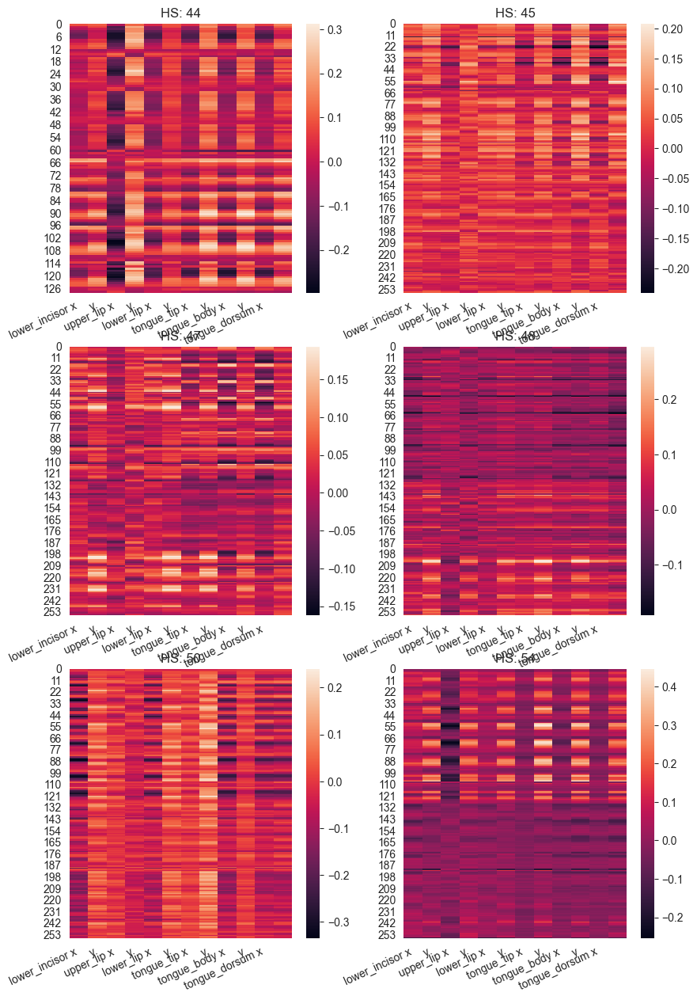

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt
trace_xlabels = ["lower_incisor x","y","upper_lip x","y","lower_lip x","y","tongue_tip x","y","tongue_body x","y","tongue_dorsum x","y"]
plt.figure(figsize=(10,15))
z = 1
for HS in HS_list:
    print("HS:",str(HS))
    plt.subplot(3,2,z)
    z+=1
    cor_save_path = "cor\\"+"HS"+str(HS)+"\\"
    task_name = "overt"
    cor_file_name = cor_save_path + "HS"+str(HS)+"_"+task_name+"_"+"_cor_mat.npy"

    cor_mat = np.load(cor_file_name,allow_pickle=True).item()
    ax = sns.heatmap(cor_mat["trace"],xticklabels=trace_xlabels)
    ax.set_xticklabels(labels=trace_xlabels,rotation = 25,horizontalalignment="right")
    plt.title("HS: "+str(HS))

# 计算mel和运动特征分别各个音节之间的相似度（6*6）

In [123]:
sound_list = ["overt_ba","overt_bu","overt_da","overt_du","overt_ga","overt_gu","covert_ba","covert_bu","covert_da","covert_du","covert_ga","covert_gu"]
Ecog_title = "ECoG_"
sound_title = "soundClipMat_"
clean_path = "D:\\BaiduNetdiskDownload\\HS-new"
import scipy.io as scio
import os

forward = int(40)
backward = int(120)
#onset_time = {"HS44":0.368,"HS45":0.151,"HS47":0.156,"HS48":0.172,"HS50":0.357,"HS54":0.322}
onset_time = {"HS44":0.368,"HS45":0.151,"HS47":0.156,"HS48":0.172,"HS50":0.357,"HS54":0.322}
onset = []
HS_list = [44,45,47,48,50,54]


def get_feat_soundtype(HS,task = "overt"):
    mel_dir = "mel_dir//"
    mel_feat_name = mel_dir+"HS"+str(HS)+"mel.npy"
    z = np.load(mel_feat_name,allow_pickle=True).item()
    at_dir = "at_dir//"
    at_feat_name = at_dir+"HS"+str(HS)+"trace.npy"
    z2 = np.load(at_feat_name,allow_pickle=True).item()
    file_name = "HS"+str(HS)+"_Block_overt_covert.mat"
    z3 = scio.loadmat(os.path.join(clean_path,file_name))
    feat_mat = {}
    fe_list = ["mel","trace","hg"]
    onset = int(np.floor(100 * onset_time["HS" + str(HS)])) + 150
    if task == "overt":
        feat_mat["mel"] = {}
        feat_mat["trace"] = {}
        feat_mat["hg"] = {}
        for sound in sound_list:
            print(sound)
            feat_mat["mel"][sound] = []
            feat_mat["trace"][sound] = []
            feat_mat["hg"][sound] = []
            if sound[0] == "c":
                pass
            else:
                for i in range(z3[Ecog_title+sound].shape[0]):
                    if len(feat_mat["mel"][sound]) == 0:
                        feat_mat["mel"][sound] = z[sound_title+sound][i,onset-forward-1:onset+backward-1,:]
                    else:
                        #feat_mat["mel"][sound] = np.concatenate(( feat_mat["mel"][sound],z[sound_title+sound][i,onset-forward-1:onset+backward-1,:]),axis=0)
                        feat_mat["mel"][sound] = feat_mat["mel"][sound]+z[sound_title+sound][i,onset-forward-1:onset+backward-1,:]

                    if len(feat_mat["trace"][sound]) == 0:
                        feat_mat["trace"][sound] = z2[sound_title+sound][i,onset-forward-1:onset+backward-1,:]
                    else:
                        #feat_mat["trace"][sound] = np.concatenate(( feat_mat["trace"][sound],z2[sound_title+sound][i,onset-forward-1:onset+backward-1,:]),axis=0)
                        feat_mat["trace"][sound] = feat_mat["trace"][sound]+z2[sound_title+sound][i,onset-forward-1:onset+backward-1,:]
                    if len(feat_mat["hg"][sound]) == 0:
                        feat_mat["hg"][sound] = z3[Ecog_title+sound][i,:,onset-forward:onset+backward].T
                    else:
                        #feat_mat["hg"][sound] = np.concatenate(( feat_mat["hg"][sound],z3[Ecog_title+sound][i,:,onset-forward:onset+backward].T),axis=0)
                        feat_mat["hg"][sound] = feat_mat["hg"][sound]+z3[Ecog_title+sound][i,:,onset-forward:onset+backward].T
                feat_mat["hg"][sound] /= z3[Ecog_title+sound].shape[0]
                feat_mat["mel"][sound] /= z3[Ecog_title+sound].shape[0]
                feat_mat["trace"][sound] /= z3[Ecog_title+sound].shape[0]
    if task == "covert":
        feat_mat["mel"] = {}
        feat_mat["trace"] = {}
        feat_mat["hg"] = {}
        for sound in sound_list:
            print(sound)
            feat_mat["mel"][sound] = []
            feat_mat["trace"][sound] = []
            feat_mat["hg"][sound] = []

            tempz = np.mean( z[sound_title+sound][:,onset-forward-1:onset+backward-1,:],axis=0)
            tempz2 = np.mean(z2[sound_title+sound][:,onset-forward-1:onset+backward-1,:],axis=0)
            if sound[0] == "c":
                pass
            else:
                  for i in range(z3[Ecog_title+"c"+sound].shape[0]):
                    if len(feat_mat["mel"][sound]) == 0:
                        feat_mat["mel"][sound] = z[sound_title+sound][i,onset-forward-1:onset+backward-1,:]
                    else:
                        feat_mat["mel"][sound] = np.concatenate(( feat_mat["mel"][sound],z[sound_title+sound][i,onset-forward-1:onset+backward-1,:]),axis=0)
                    if len(feat_mat["trace"][sound]) == 0:
                        feat_mat["trace"][sound] = z2[sound_title+sound][i,onset-forward-1:onset+backward-1,:]
                    else:
                        feat_mat["trace"][sound] = np.concatenate(( feat_mat["trace"][sound],z2[sound_title+sound][i,onset-forward-1:onset+backward-1,:]),axis=0)
                    if len(feat_mat["hg"][sound]) == 0:
                        feat_mat["hg"][sound] = z3[Ecog_title+sound][i,:,onset-forward:onset+backward].T
                    else:
                        feat_mat["hg"][sound] = np.concatenate(( feat_mat["hg"][sound],z3[Ecog_title+sound][i,:,onset-forward:onset+backward].T),axis=0)

    feat_mat["lower_incisor"] = {}
    feat_mat["upper_lip"] = {}
    feat_mat["lower_lip"] = {}
    feat_mat["tongue_tip"] = {}
    feat_mat["tongue_body"] = {}
    feat_mat["tongue_dorsum"] = {}
    feat_mat["tongue"] = {}
    feat_mat["lip"] = {}
    for sound in sound_list:
        if sound[0] != "c":
            feat_mat["lower_incisor"][sound] = feat_mat["trace"][sound][::2]
            feat_mat["upper_lip"][sound] = feat_mat["trace"][sound][:,2:4]
            feat_mat["lower_lip"][sound] = feat_mat["trace"][sound][:,4:6]
            feat_mat["tongue_tip"][sound] = feat_mat["trace"][sound][:,6:8]
            feat_mat["tongue_body"][sound] = feat_mat["trace"][sound][:,8:10]
            feat_mat["tongue_dorsum"][sound] = feat_mat["trace"][sound][:,10:12]
            feat_mat["tongue"][sound] = feat_mat["trace"][sound][:,6:12]
            feat_mat["lip"][sound] = feat_mat["trace"][sound][:,2:6]

    return feat_mat


overt_ba
overt_bu
overt_da
overt_du
overt_ga
overt_gu
covert_ba
covert_bu
covert_da
covert_du
covert_ga
covert_gu


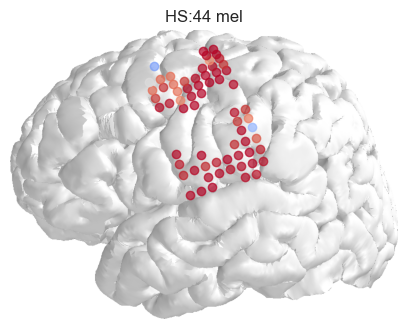

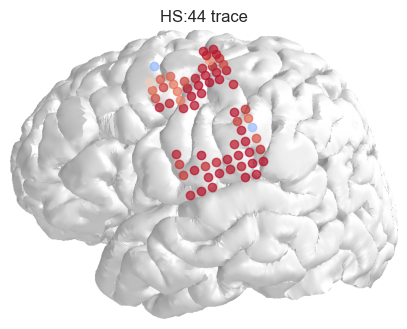

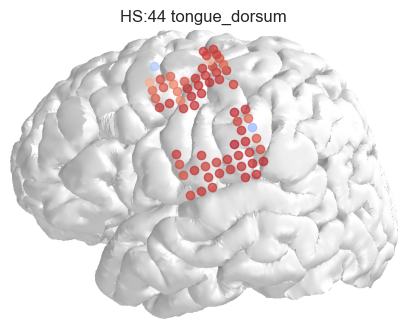

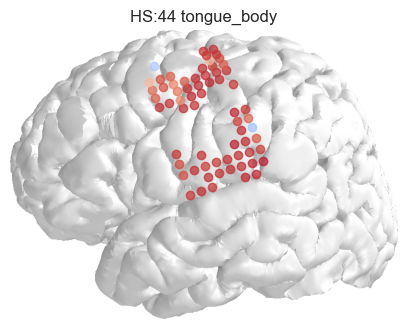

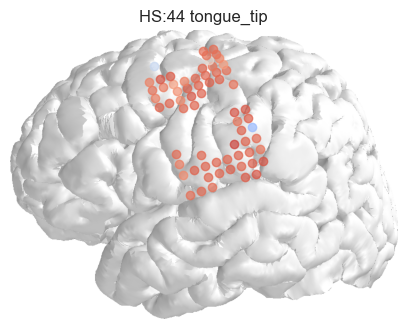

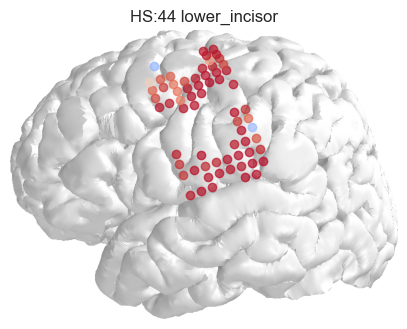

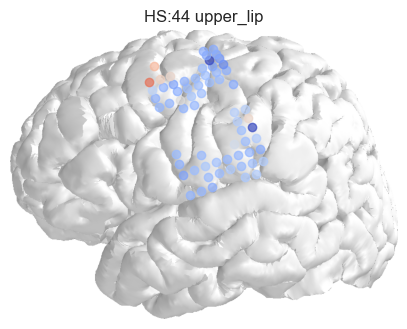

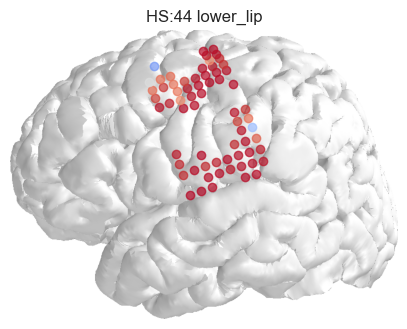

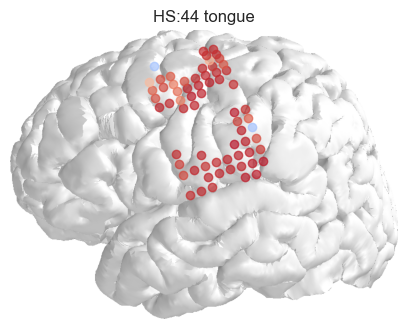

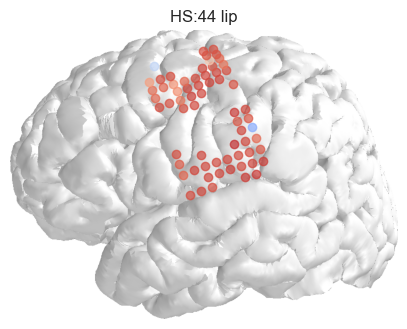

In [146]:

import matplotlib.image as mpimg
import scipy.io as scio
HS = HS_list[0]
path = "D:\\vscodeProject\\DATA\\reading task"
subject = 'HS'+str(HS)
img = mpimg.imread(path +"\\WZJ\\Brain2D\\"+ subject + "_brain2D.png")
xy = scio.loadmat(path +"\\WZJ\\Brain2D\\"+ subject + "_elec_pos2D.mat")['elecmatrix']
n_chans = 256 if xy.shape[0] >= 256 else 128

nn_features = ["mel","trace","tongue_dorsum","tongue_body","tongue_tip","lower_incisor","upper_lip","lower_lip","tongue","lip"]

overt_list = ["overt_ba","overt_da","overt_ga","overt_bu","overt_du","overt_gu"]
cor_pattern = {}
testz = get_feat_soundtype(HS,"overt")
#获取各个病人trace的相似性
for nn_feat_name in nn_features:
    cor_pattern[nn_feat_name] = np.zeros([6,6])
    for i in range(6):

        for j in range(i+1,6):
            xmin = min(testz[nn_feat_name][overt_list[i]].shape[0],testz[nn_feat_name][overt_list[j]].shape[0])
            cor_pattern[nn_feat_name][i][j] = np.corrcoef (testz[nn_feat_name][overt_list[i]][:xmin,:].reshape(-1),testz[nn_feat_name][overt_list[j]][:xmin,:].reshape(-1))[0,1]

overt_list = ["overt_ba","overt_da","overt_ga","overt_bu","overt_du","overt_gu"]
# cor_pattern = {}

#获取各个病人脑电的相似性
cor_pattern_mel_trace = {}
for nn_feat_name in ["hg"]:
    cor_pattern[nn_feat_name] = np.zeros([n_chans,6,6])
    cor_pattern_mel_trace[nn_feat_name] = np.zeros([n_chans,len(nn_features)])
    for elec in range(n_chans):
        for i in range(6):
            for j in range(i+1,6):
                xmin = min(testz[nn_feat_name][overt_list[i]].shape[0],testz[nn_feat_name][overt_list[j]].shape[0])
                cor_pattern[nn_feat_name][elec,i,j] = np.corrcoef (testz[nn_feat_name][overt_list[i]][:xmin,elec].reshape(-1),testz[nn_feat_name][overt_list[j]][:xmin,elec].reshape(-1))[0,1]
        #计算mel和trace对脑电的相似性（cos）
        #cor_pattern_mel_trace[nn_feat_name][elec,0] = np.dot(cor_pattern["mel"].reshape(-1),cor_pattern[nn_feat_name][elec].reshape(-1))/(np.linalg.norm(cor_pattern["mel"].reshape(-1))*np.linalg.norm(cor_pattern[nn_feat_name][elec].reshape(-1)))
        #cor_pattern_mel_trace[nn_feat_name][elec,1] = np.dot(cor_pattern["trace"].reshape(-1),cor_pattern[nn_feat_name][elec].reshape(-1))/(np.linalg.norm(cor_pattern["trace"].reshape(-1))*np.linalg.norm(cor_pattern[nn_feat_name][elec].reshape(-1)))
        for i in range(len(nn_features)):
            cor_pattern_mel_trace[nn_feat_name][elec,i] = np.corrcoef(np.triu(cor_pattern[nn_features[i]],1).reshape(-1),np.triu(cor_pattern[nn_feat_name][elec],1).reshape(-1))[0,1]

path = "D:\\vscodeProject\\DATA\\reading task"
subject = 'HS'+str(HS)
img = mpimg.imread(path +"\\WZJ\\Brain2D\\"+ subject + "_brain2D.png")
xy = sio.loadmat(path +"\\WZJ\\Brain2D\\"+ subject + "_elec_pos2D.mat")['elecmatrix']
n_chans = 256 if xy.shape[0] >= 256 else 128
for feature in range(len(nn_features)):
    fig, ax = plt.subplots(figsize=(5, 5))
    cof_overt_trace = cor_pattern_mel_trace["hg"][:,feature]
    ax.imshow(img)
    all_sig_elecs =np.load(str(HS)+"all_sig_elecs.npy")

    z = plt.get_cmap("coolwarm")
    plt.title("HS:"+str(HS)+" "+nn_features[feature])
    for i in range(n_chans):
        if i in all_sig_elecs:
            if not np.isnan(cof_overt_trace[i]):
                #对皮尔森相似度正的为红色，负的为蓝色,不显著的为绿色, 不显著的电极为灰色
                if cof_overt_trace[i]>0:
                    ax.plot(xy[i][0], xy[i][1], 'o',color = z(cof_overt_trace[i]),alpha = 0.7)
                    #ax.text(xy[i][0], xy[i][1], str(i))
                if cof_overt_trace[i]<0:
                    ax.plot(xy[i][0], xy[i][1], 'o',color = z(cof_overt_trace[i]),alpha = 0.7)
                    #ax.text(xy[i][0], xy[i][1], str(i))
            else:
                ax.plot(xy[i][0], xy[i][1], 'ko',alpha = 0.1)

    ax.axis("off")

overt_ba
overt_bu
overt_da
overt_du
overt_ga
overt_gu
covert_ba
covert_bu
covert_da
covert_du
covert_ga
covert_gu


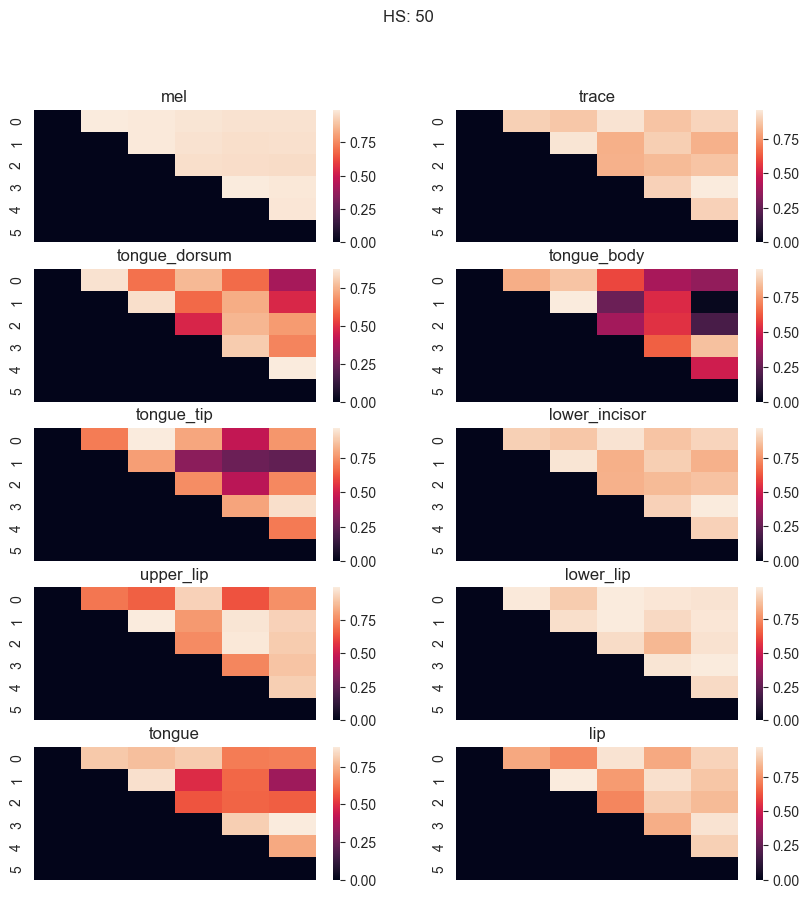

In [144]:
z=1
HS = HS_list[4]
nn_features = ["mel","trace","tongue_dorsum","tongue_body","tongue_tip","lower_incisor","upper_lip","lower_lip","tongue","lip"]

overt_list = ["overt_ba","overt_da","overt_ga","overt_bu","overt_du","overt_gu"]
cor_pattern = {}
testz = get_feat_soundtype(HS,"overt")
#获取各个病人trace的相似性
for nn_feat_name in nn_features:
    cor_pattern[nn_feat_name] = np.zeros([6,6])
    for i in range(6):

        for j in range(i+1,6):
            xmin = min(testz[nn_feat_name][overt_list[i]].shape[0],testz[nn_feat_name][overt_list[j]].shape[0])
            cor_pattern[nn_feat_name][i][j] = np.corrcoef (testz[nn_feat_name][overt_list[i]][:xmin,:].reshape(-1),testz[nn_feat_name][overt_list[j]][:xmin,:].reshape(-1))[0,1]


plt.figure(figsize=(10,10))
plt.suptitle("HS: "+str(HS))
for nn_feat_name in nn_features:
    plt.subplot(5,2,z)
    z+=1
    plt.title(nn_feat_name)
    ax = sns.heatmap(cor_pattern[nn_feat_name])

    ax.set_xticklabels([])

<AxesSubplot:>

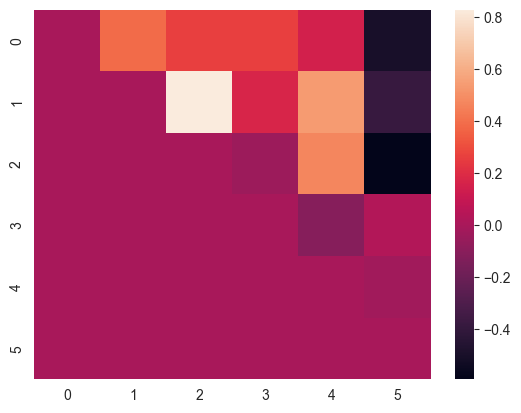

In [149]:
sns.heatmap(cor_pattern[nn_feat_name][46])

In [45]:
testz["trace"][overt_list[i]].shape[0]
testz["trace"][overt_list[j]].shape[0]

8480

In [ ]:
import seaborn as sns
import matplotlib.image as mpimg
import scipy.io as sio
import matplotlib.pyplot as plt
def pattern_simi_plot(HS):
    path = os.getcwd()
    subject = 'HS'+str(HS)
    img = mpimg.imread(path +"\\WZJ\\Brain2D\\"+ subject + "_brain2D.png")
    xy = sio.loadmat(path +"\\WZJ\\Brain2D\\"+ subject + "_elec_pos2D.mat")['elecmatrix']
    n_chans = 256 if xy.shape[0] >= 256 else 128
    fig, ax = plt.subplots(figsize=(15, 15))
    cof_overt_covert = data_distance_xgb_cof_overt_covert["HS"+str(HS)]
    ax.imshow(img)
    all_sig_elecs =np.load(str(HS)+"all_sig_elecs.npy")
    for i in range(n_chans):
        if i in all_sig_elecs:
            if not np.isnan(cof_overt_covert[0,i]):
                #对皮尔森相似度正的为红色，负的为蓝色,不显著的为绿色, 不显著的电极为灰色
                if cof_overt_covert[1,i]<0.9:
                    if cof_overt_covert[0,i]>0:
                        ax.plot(xy[i][0], xy[i][1], 'ro',alpha = cof_overt_covert[0,i])
                        ax.text(xy[i][0], xy[i][1], str(np.around(cof_overt_covert[0,i],2)))
                    else:
                        ax.plot(xy[i][0], xy[i][1], 'bo',alpha = -cof_overt_covert[0,i])
                        ax.text(xy[i][0], xy[i][1], str(np.around(cof_overt_covert[0,i],2)))
            else:
                ax.plot(xy[i][0], xy[i][1], 'ko',alpha = 0.1)

    ax.axis("off")

# 寻找默读解释性强的电极

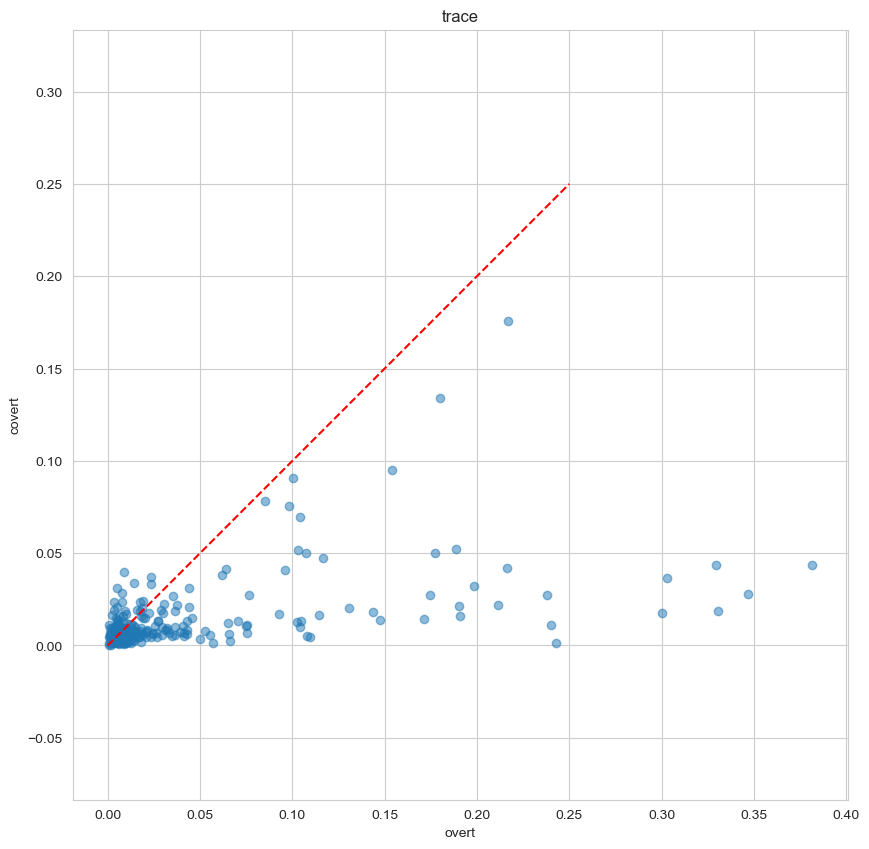

In [29]:
#进行朗读默读的对照

def plot_covert_overt(nn_feature):
    plt.figure(figsize=(10,10))

    r2_channel_covert = np.load(save_path+"HS"+str(HS)+"_"+"covert"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
    r2_channel_overt = np.load(save_path+"HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
    plt.scatter(r2_channel_overt[nn_feature],r2_channel_covert[nn_feature],alpha= 0.5)
    #plt.scatter(r2_channel_overt["trace"],r2_channel_covert["trace"],alpha= 0.5)

    plt.plot(np.linspace(0,0.25,10),np.linspace(0,0.25,10),'r--')
    plt.title(nn_feature)
    plt.xlabel("overt")
    plt.ylabel("covert")
    plt.axis("equal")

plot_covert_overt("trace")

# 绘制脑电和脑区的latency图

[array(['inferiorparietal'], dtype='<U16')
 array(['inferiortemporal'], dtype='<U16')
 array(['lateraloccipital'], dtype='<U16')
 array(['middletemporal'], dtype='<U14')
 array(['postcentral'], dtype='<U11') array(['precentral'], dtype='<U10')
 array(['superiorparietal'], dtype='<U16')
 array(['superiortemporal'], dtype='<U16')
 array(['supramarginal'], dtype='<U13')]
5
5
5
5
4
4
4
4
8
8
8
8
8
8
8
8
5
5
5
5
4
4
4
4
8
8
8
8
8
8
8
8
5
5
5
5
4
4
4
4
8
8
8
8
8
8
8
8
5
5
5
5
4
4
4
4
4
8
8
8
8
8
8
8
5
5
5
5
4
4
4
4
4
4
8
8
8
8
8
8
5
5
5
5
5
4
4
4
4
4
4
8
8
8
8
8
5
5
5
5
5
4
4
4
4
4
4
8
8
8
8
8
5
5
5
5
5
5
5
4
4
4
4
8
8
8
8
8
2
2
2
0
0
0
0
0
0
0
0
0
0
0
6
6
2
2
2
0
0
0
0
0
0
0
0
0
0
0
6
6
2
2
0
0
0
0
0
0
0
0
0
0
0
0
6
6
1
2
0
0
0
0
0
0
0
0
0
0
0
0
6
6
1
1
3
0
0
0
0
0
0
0
0
0
0
6
6
6
3
3
8
0
0
0
0
0
0
0
0
0
0
6
6
6
3
3
7
8
8
8
8
8
8
8
8
8
8
8
8
8
3
3
7
7
8
8
8
8
8
8
8
8
8
8
8
8


(-0.5, 763.5, 539.5, -0.5)

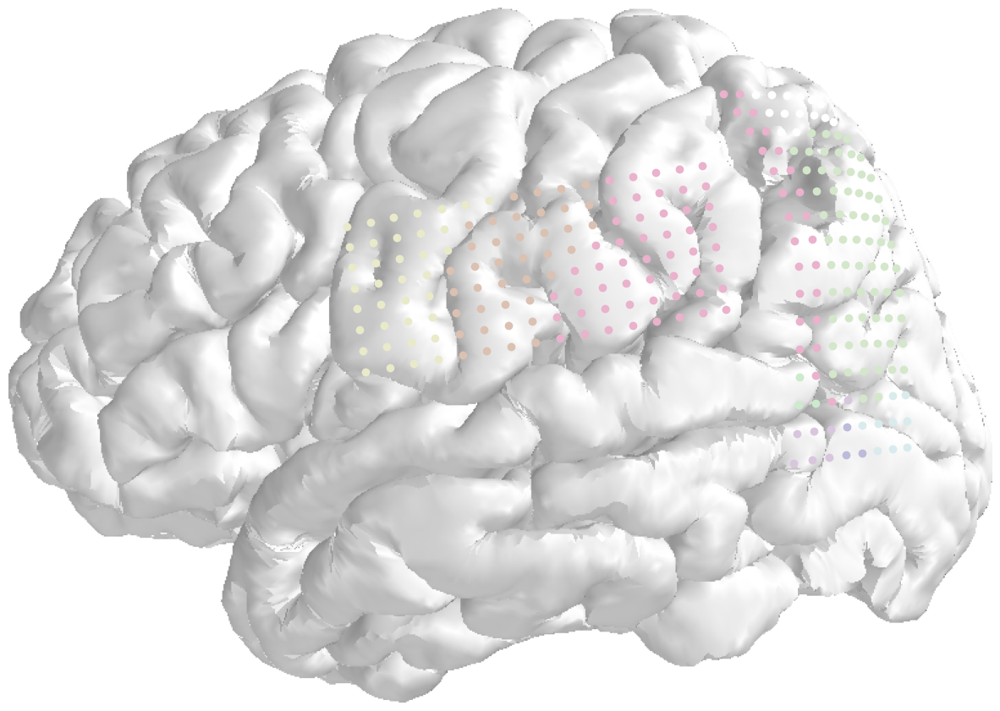

In [111]:
path = "D:\\vscodeProject\\DATA\\reading task"
subject = 'HS'+str(HS)
xycolor = sio.loadmat(path +"\\WZJ\\Brain2D\\"+ subject + "_elecs_all.mat")["anatomy"]
xy = sio.loadmat(path +"\\WZJ\\Brain2D\\"+ subject + "_elec_pos2D.mat")['elecmatrix']


color_list = [(212/255,231/255,203/255),(188/255,187/255,219/255),(217/255,235/255,237/255),(216/255,198/255,222/255),(219/255,193/255,178/255),(233/255,234/255,202/255),(255/255,255/255,255/255),(204/255,234/255,204/255),(234/255,178/255,204/255)]
place_list = np.unique(xycolor[:,3])
print(place_list)
img = mpimg.imread(path +"\\WZJ\\Brain2D\\"+ subject + "_brain2D.png")

n_chans = 256 if xy.shape[0] >= 256 else 128


fig, ax = plt.subplots(figsize=(15, 15))

ax.imshow(img)
for i in range(n_chans):
        color_ind = np.where(place_list==xycolor[i,3])[0][0]
        print(color_ind)
        ax.plot(xy[i][0], xy[i][1], 'o',color=color_list[color_ind])
        #ax.text(xy[i][0], xy[i][1],i)


ax.axis("off")


In [58]:
clean_path = "D:\\BaiduNetdiskDownload\\HS-new"
file_name = "HS"+str(HS)+"_Block_overt_covert.mat"
z3 = scio.loadmat(os.path.join(clean_path,file_name))
z3 = z3["Alldata"][0][0]


TypeError: unhashable type: 'numpy.ndarray'

In [136]:
avgECoG = {}
for i in range(len(place_list)):
    avgECoG[place_list[i][0]] = []
n=5
for i in range(n_chans):
    avgECoG[xycolor[i,3][0]].append(np.mean(z3["ECoG_overt_ba"][:,i,:],axis=0))
# 选择是否高斯平滑：如果高斯平滑n为多少
gauss = False
for i in range(len(place_list)):
    avgECoG[place_list[i][0]] = np.array(avgECoG[place_list[i][0]])
    if gauss:
        for j in range(avgECoG[place_list[i][0]].shape[0]):
            avgECoG[place_list[i][0]][j] = np.convolve(avgECoG[place_list[i][0]][j],np.ones([n])/n,mode="same")

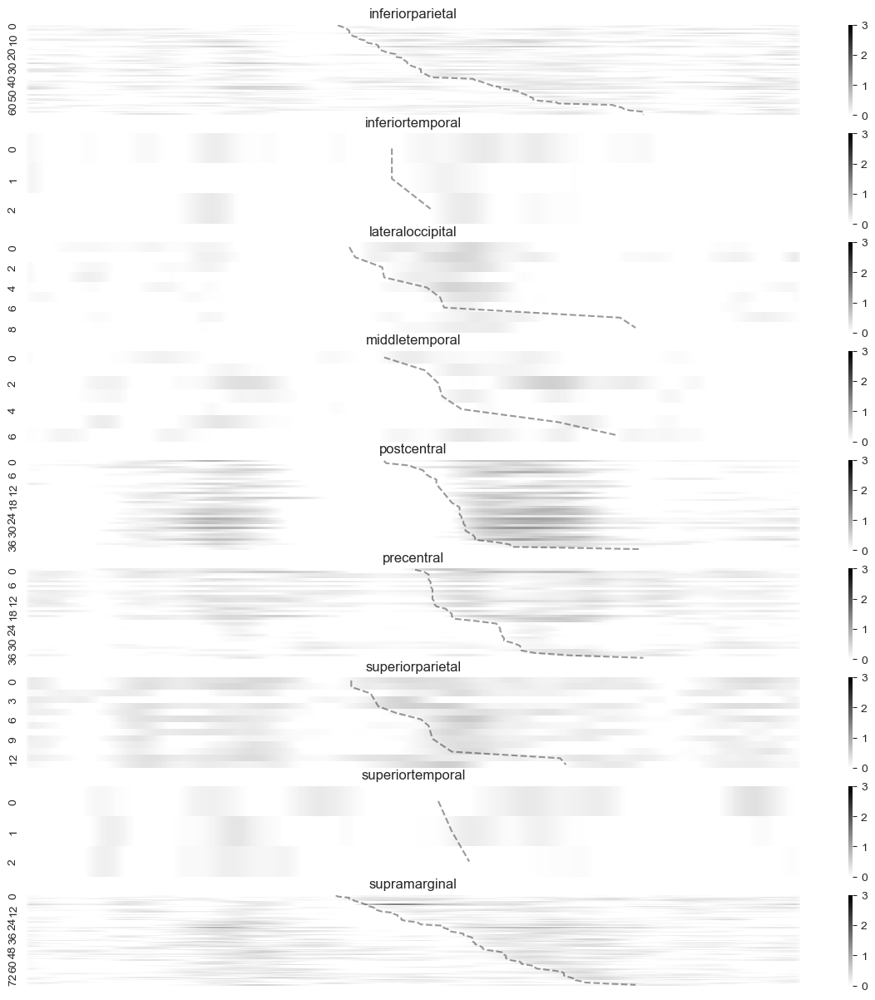

In [137]:
pos = {}
for i in range(len(place_list)):
    temp = avgECoG[place_list[i][0]]
    #temp[temp<0]=0
    pos[place_list[i][0]] = np.argmax(np.diff(temp,axis=1)[:,160:320],axis=1)

fig,axs = plt.subplots(len(place_list),figsize=(15,15))
for place_ind in range(len(place_list)):
    temp =  avgECoG[place_list[place_ind][0]][pos[place_list[place_ind][0]].argsort()]
    #temp[temp<0]=0
    axs[place_ind].set_title(place_list[place_ind][0])
    sns.heatmap(temp,cmap="binary",ax=axs[place_ind],vmax=3,vmin=0)
    xforplot = pos[place_list[place_ind][0]][pos[place_list[place_ind][0]].argsort()]+160
    yforplot = np.arange(1,len(pos[place_list[place_ind][0]])+1)-0.5
    axs[place_ind].plot(xforplot,yforplot,"k--",alpha=0.4)
    axs[place_ind].set_xticks([200])
    #axs[place_ind].set(facecolor = color_list[place_ind])


In [ ]:
nn_features = ["syllable","phoneme","intensity","f1","f2","absPitch","relPitch","drelPitch","Env","peakRate","peakEnv","all","mel","trace"]

r2_channel_covert = np.load(save_path+"HS"+str(HS)+"_"+"covert"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()
r2_channel_overt = np.load(save_path+"HS"+str(HS)+"_"+"overt"+"_"+str(int(ds*fs))+"_r2_channel.npy",allow_pickle=True).item()

r2_channel_covert["syllable"]
path = os.getcwd()
subject = 'HS'+str(HS)
img = mpimg.imread(path +"\\WZJ\\Brain2D\\"+ subject + "_brain2D.png")
xy = sio.loadmat(path +"\\WZJ\\Brain2D\\"+ subject + "_elec_pos2D.mat")['elecmatrix']
n_chans = 256 if xy.shape[0] >= 256 else 128


fig, ax = plt.subplots(figsize=(15, 15))

ax.imshow(img)
all_sig_elecs =np.load(str(HS)+"all_sig_elecs.npy")
for i in range(n_chans):
    if i in all_sig_elecs:
        if not np.isnan(cof_overt_covert[0,i]):
            #对皮尔森相似度正的为红色，负的为蓝色,不显著的为绿色, 不显著的电极为灰色
            if cof_overt_covert[1,i]<0.9:
                if cof_overt_covert[0,i]>0:
                    ax.plot(xy[i][0], xy[i][1], 'ro',alpha = cof_overt_covert[0,i])
                    ax.text(xy[i][0], xy[i][1], str(np.around(cof_overt_covert[0,i],2)))
                else:
                    ax.plot(xy[i][0], xy[i][1], 'bo',alpha = -cof_overt_covert[0,i])
                    ax.text(xy[i][0], xy[i][1], str(np.around(cof_overt_covert[0,i],2)))
        else:
            ax.plot(xy[i][0], xy[i][1], 'ko',alpha = 0.1)

ax.axis("off")

In [123]:

def stacktemporal(x):
    timestep = 1

    ecogfs = 3052
    targetfs = 100
    windowsize = ecogfs // targetfs

    y = []
    startpoint = 0
    timepoint = startpoint

    while (True):
        #窗内叠加
        for i in range(targetfs//timestep):
            y.append(x[timepoint + i:timepoint + i + windowsize].T)
        #窗外滑动
        timepoint += timestep * ecogfs
        if timepoint + windowsize > len(x):
            break
    return np.array(y)


x = np.linspace(1, 10000, 3052 * 4)
print(np.shape(x))
np.shape(stacktemporal(x))

(12208,)


(400, 30)